In [1]:
!nvidia-smi

Sat Dec 28 04:49:17 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
'''
  In this exercise we take a random vector of pure noise and train a Generative Adversarial Network to
  convert this noise into written numbers, using the MNIST library as a reference for the real images.
'''


import pdb, torch # pdb is for debugging
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm # progress bar
import matplotlib.pyplot as plt


In [12]:
# grid visualization function
def show(tensor, ch=1, size=(28, 28), num=16):
  # tensor: 128 x 784
  data = tensor.detach().cpu().view(-1, ch, * size)
  grid = make_grid(data[:num], nrow=4).permute(1, 2, 0)
  plt.imshow(grid)
  plt.show()



In [5]:
# setup main params and hyperparams
epochs = 500
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64 # noise vector (input for generator)
lr = .00001 # learning rate
loss_func = nn.BCEWithLogitsLoss()

batch_size = 128 # num of images to be processed per batch
device = 'cuda'

# download data set
dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()), shuffle=True, batch_size=batch_size)


Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9.91M/9.91M [00:00<00:00, 17.7MB/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28.9k/28.9k [00:00<00:00, 495kB/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1.65M/1.65M [00:00<00:00, 4.55MB/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4.54k/4.54k [00:00<00:00, 11.2MB/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [6]:
# build models

# generator
def gen_block(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        gen_block(z_dim, h_dim), # 64, 128
        gen_block(h_dim, h_dim * 2), # 128, 256
        gen_block(h_dim * 2, h_dim * 4), # 256, 512
        gen_block(h_dim * 4, h_dim * 8), # 512, 1024
        nn.Linear(h_dim * 8, i_dim), # 1024, 784 (28 x 28)
        nn.Sigmoid() # vals of pixels should be btwn (0, 1)
    )

  def forward(self, noise):
    return self.gen(noise)

# generate noise
def gen_noise(num, z_dim):
  return torch.randn(num, z_dim).to(device) # store in gpu

# discriminator
def disc_block(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc = nn.Sequential(
        disc_block(i_dim, h_dim * 4), # 784, 1024
        disc_block(h_dim * 4, h_dim * 2), # 1024, 512
        disc_block(h_dim * 2, h_dim), # 512, 256
        nn.Linear(h_dim, 1) # 256, 1
    )

  def forward(self, image):
    return self.disc(image)

In [9]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr) # optimization

disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr) # optimization

In [10]:
print(gen)

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)


In [11]:
print(disc)

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)


In [13]:
x, y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([1, 8, 3, 9, 1, 3, 1, 8, 6, 6])


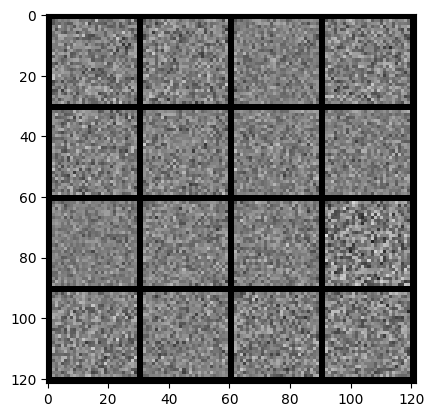

In [15]:
noise = gen_noise(batch_size, z_dim)
fake = gen(noise)
show(fake)
# this shows the initial output of passing the noise thru the generator
# because no learning has occurred yet, the output is very noisy

In [16]:
# calculate generator loss
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  pred = disc(fake)
  targets = torch.ones_like(pred) # create a vector of 1s with the same dimensionality of pred to try to fool the discriminator
  gen_loss = loss_func(pred, targets)

  return gen_loss


# calcuate discriminator loss
def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  disc_fake = disc(fake.detach()) # detach so that during backpropogation we don't change the params of the generator
  disc_fake_targets = torch.zeros_like(disc_fake) # create vector of 0s with the same dimensionality of 'fake'
  disc_fake_loss = loss_func(disc_fake, disc_fake_targets)

  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets)

  disc_loss = (disc_fake_loss + disc_real_loss) / 2

  return disc_loss



  0%|          | 0/469 [00:00<?, ?it/s]

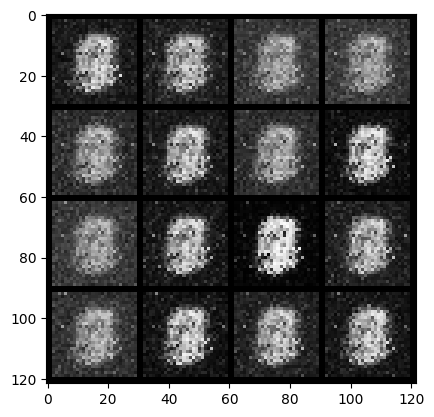

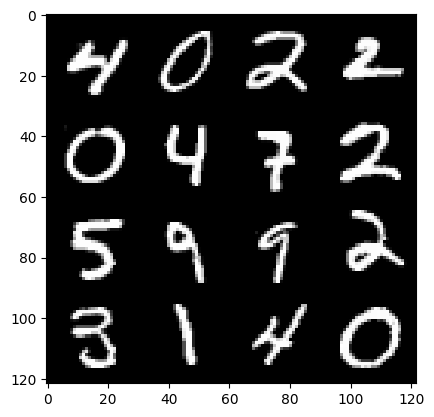

0: step 300 / Gen loss: 1.933544772068659 / disc_loss: 0.34104350641369835


  0%|          | 0/469 [00:00<?, ?it/s]

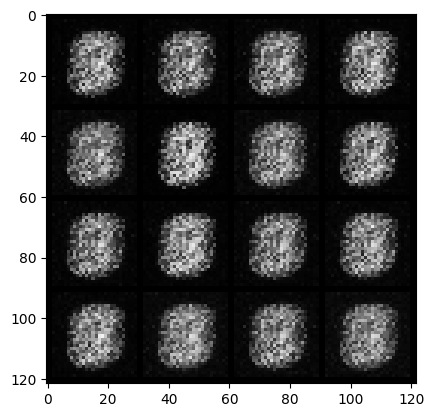

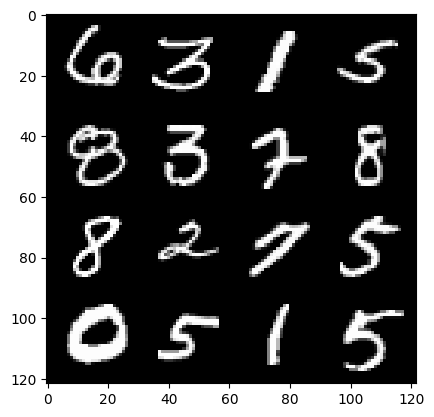

1: step 600 / Gen loss: 3.4147395817438753 / disc_loss: 0.12306462464233242


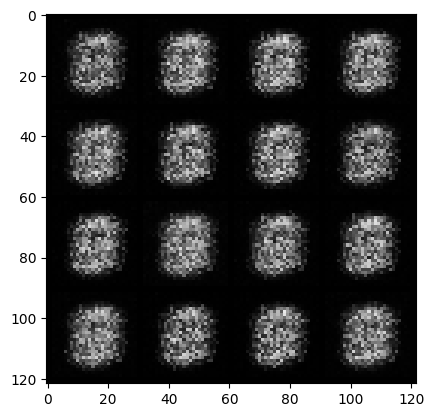

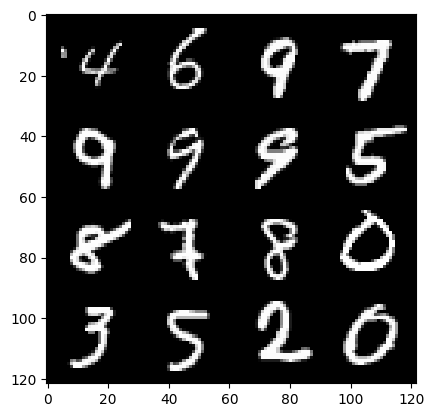

1: step 900 / Gen loss: 3.397965403397877 / disc_loss: 0.05690082079420491


  0%|          | 0/469 [00:00<?, ?it/s]

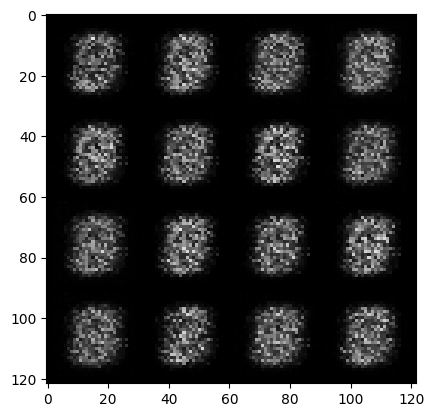

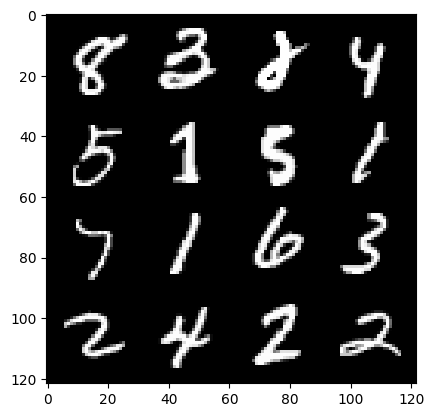

2: step 1200 / Gen loss: 3.468089102109272 / disc_loss: 0.03902321254213647


  0%|          | 0/469 [00:00<?, ?it/s]

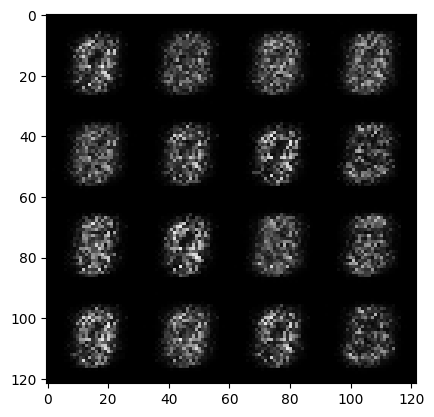

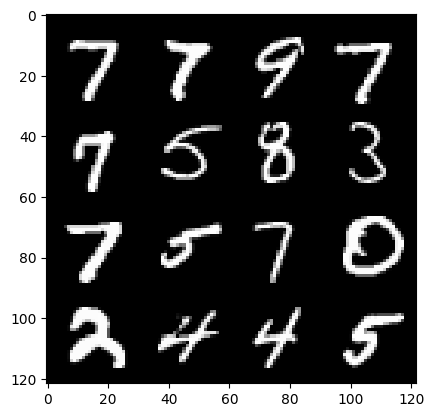

3: step 1500 / Gen loss: 3.398831752936045 / disc_loss: 0.0455923702195287


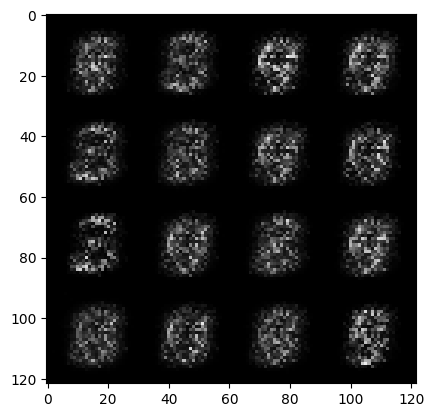

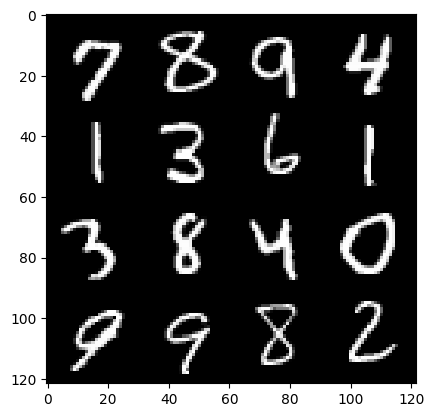

3: step 1800 / Gen loss: 3.2826558812459306 / disc_loss: 0.05854913131644333


  0%|          | 0/469 [00:00<?, ?it/s]

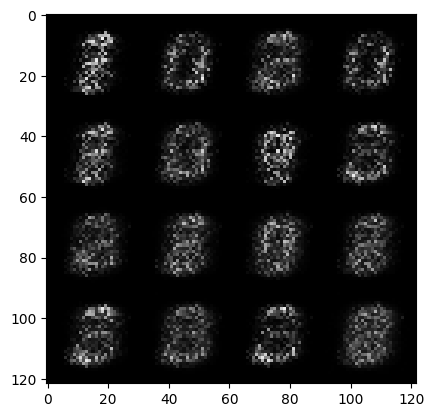

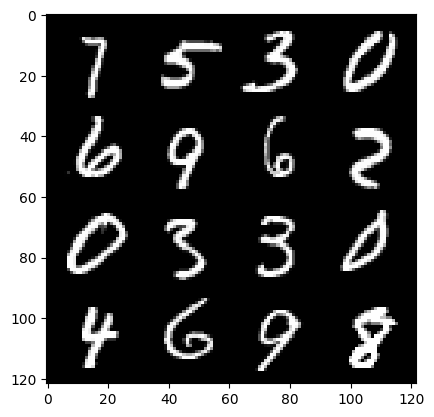

4: step 2100 / Gen loss: 3.566634825070702 / disc_loss: 0.04858620382224518


  0%|          | 0/469 [00:00<?, ?it/s]

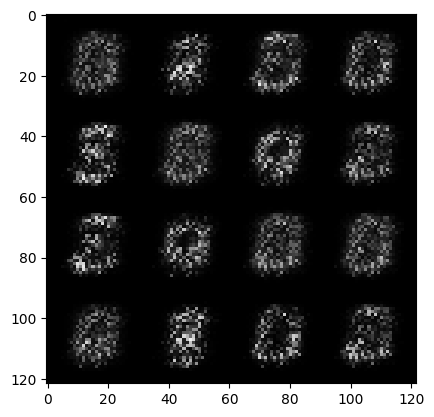

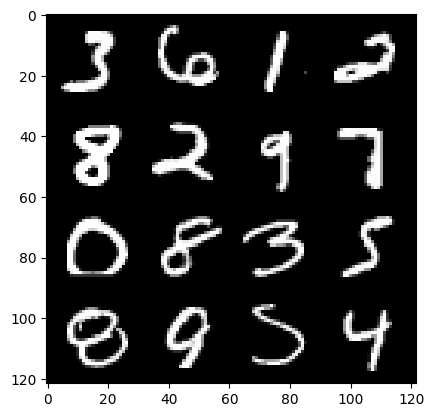

5: step 2400 / Gen loss: 3.767991340160371 / disc_loss: 0.04057133692627154


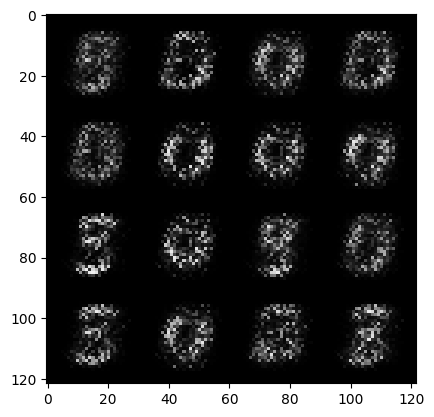

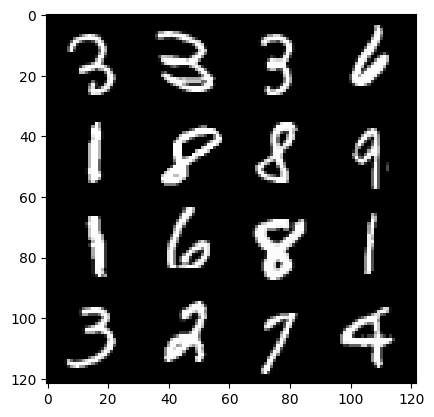

5: step 2700 / Gen loss: 4.311228215694427 / disc_loss: 0.02793160604933897


  0%|          | 0/469 [00:00<?, ?it/s]

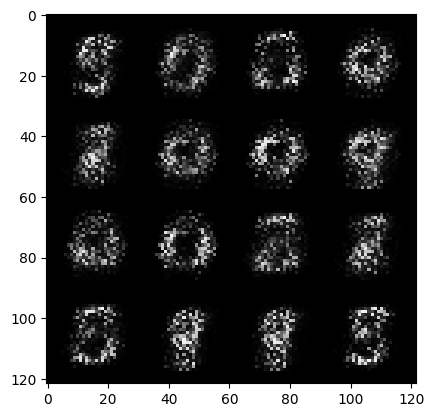

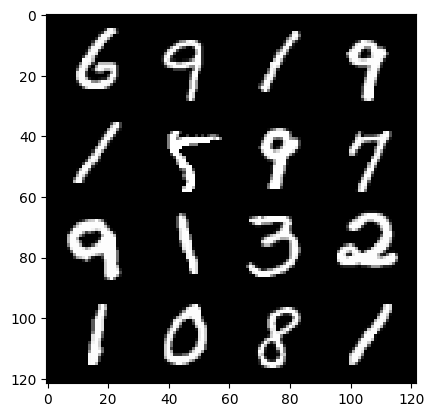

6: step 3000 / Gen loss: 4.711933676401773 / disc_loss: 0.02573799109396836


  0%|          | 0/469 [00:00<?, ?it/s]

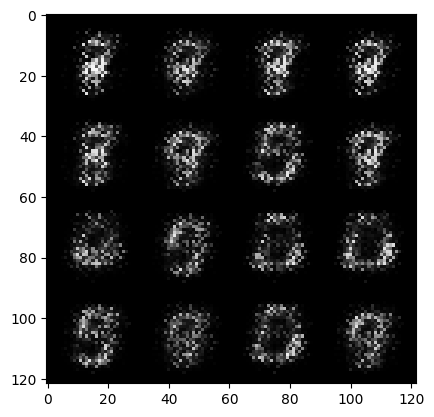

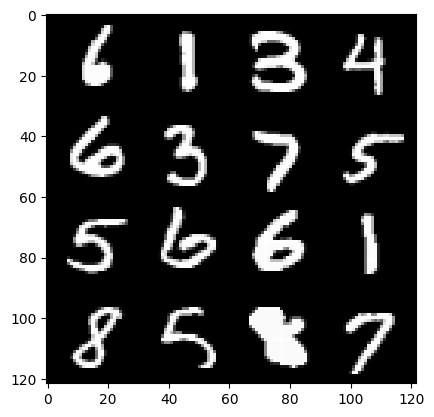

7: step 3300 / Gen loss: 5.010550279617313 / disc_loss: 0.021232646666467212


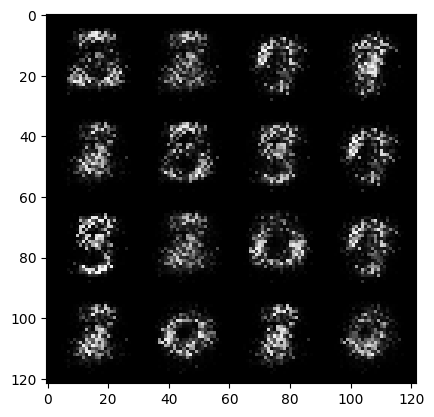

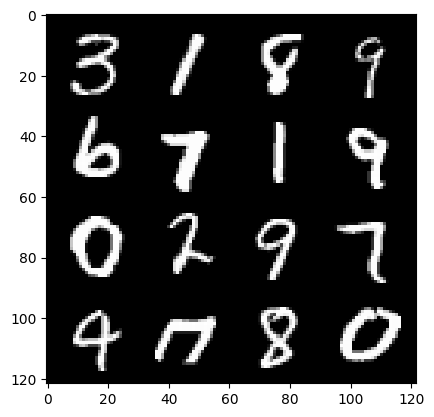

7: step 3600 / Gen loss: 5.084571940104167 / disc_loss: 0.02079555491606393


  0%|          | 0/469 [00:00<?, ?it/s]

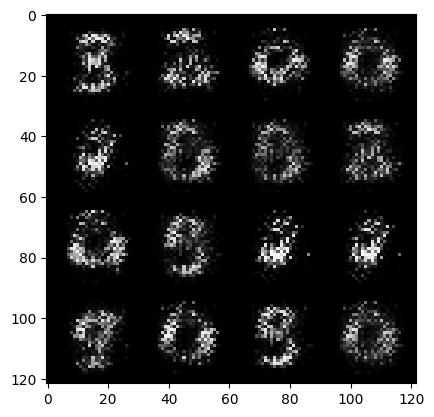

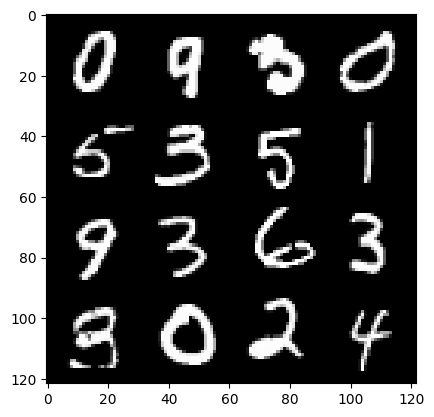

8: step 3900 / Gen loss: 5.26802540938059 / disc_loss: 0.018988302152914308


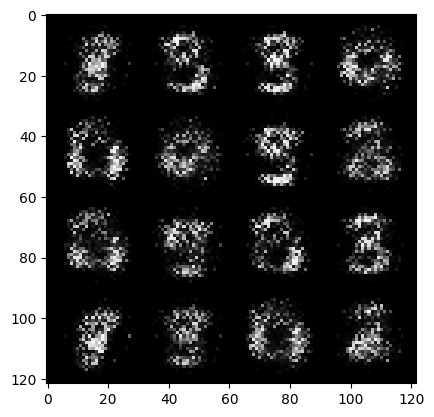

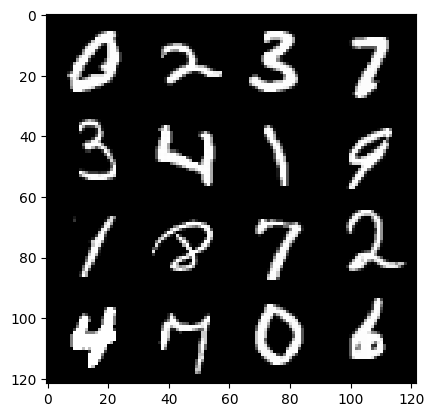

8: step 4200 / Gen loss: 5.472518315315245 / disc_loss: 0.016035489952191718


  0%|          | 0/469 [00:00<?, ?it/s]

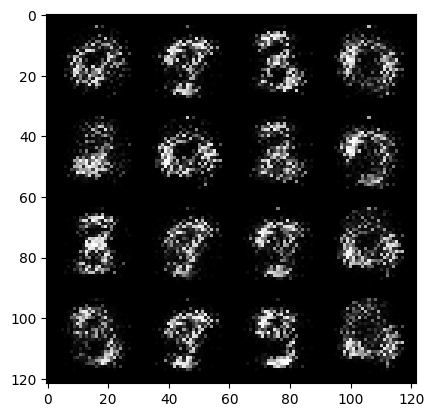

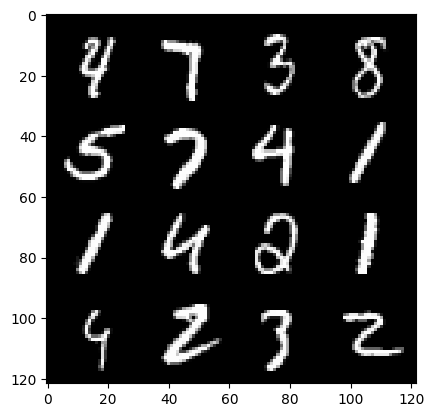

9: step 4500 / Gen loss: 5.743033278783162 / disc_loss: 0.014336234523604318


  0%|          | 0/469 [00:00<?, ?it/s]

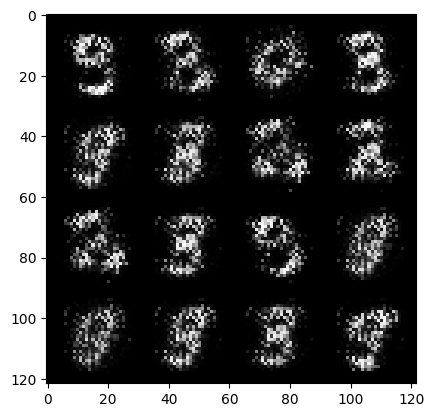

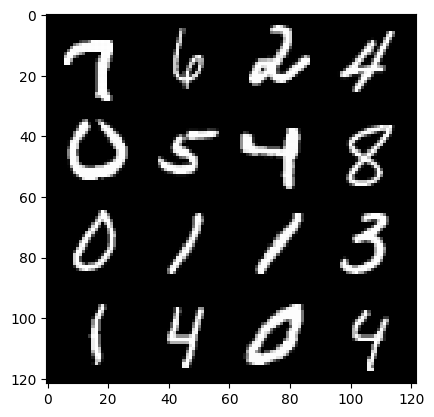

10: step 4800 / Gen loss: 5.904160186449688 / disc_loss: 0.01281261331168936


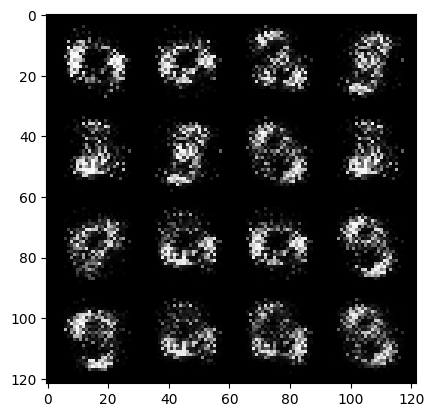

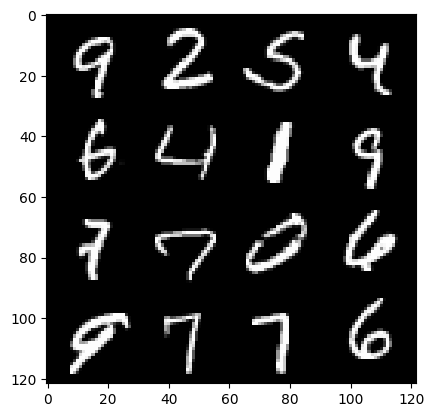

10: step 5100 / Gen loss: 6.519083749453234 / disc_loss: 0.012287975555906694


  0%|          | 0/469 [00:00<?, ?it/s]

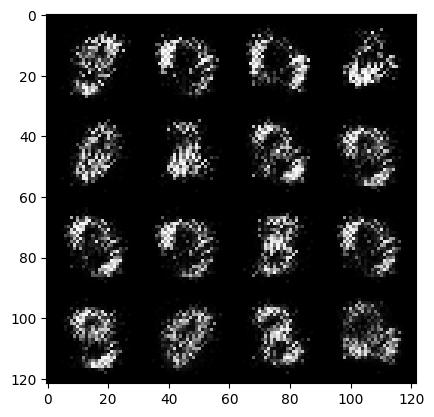

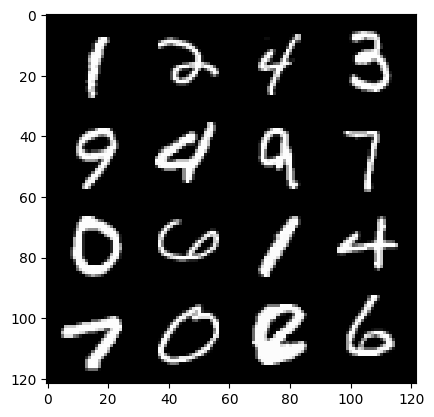

11: step 5400 / Gen loss: 6.599241453806557 / disc_loss: 0.01275182265012215


  0%|          | 0/469 [00:00<?, ?it/s]

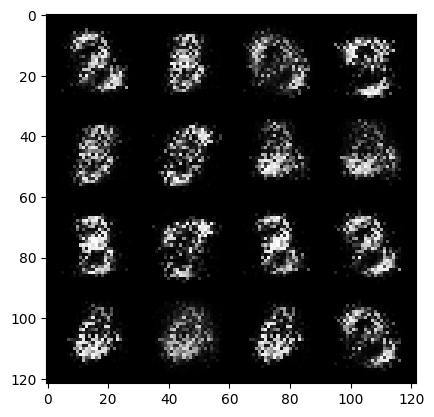

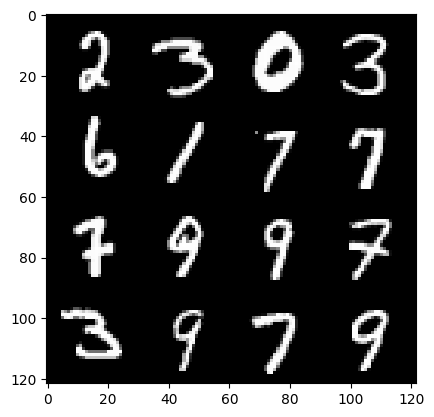

12: step 5700 / Gen loss: 6.4940930795669525 / disc_loss: 0.01154378923587501


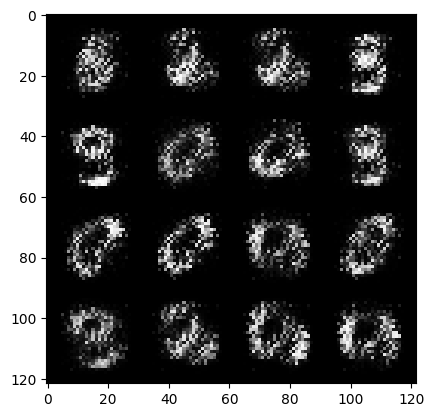

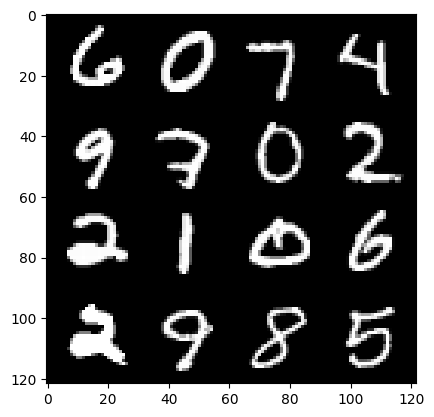

12: step 6000 / Gen loss: 6.366094382603963 / disc_loss: 0.01164438723120838


  0%|          | 0/469 [00:00<?, ?it/s]

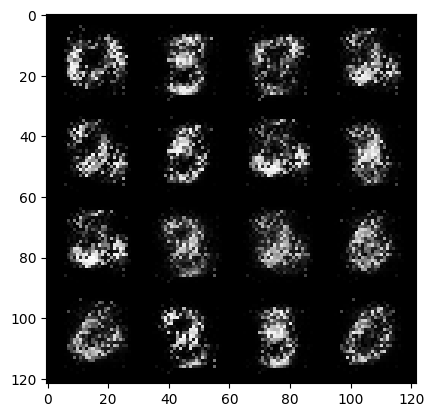

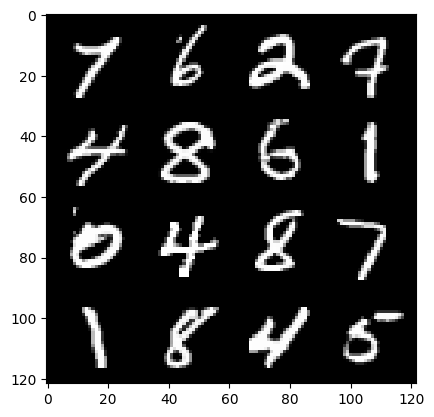

13: step 6300 / Gen loss: 6.500604521433506 / disc_loss: 0.012297869626587875


  0%|          | 0/469 [00:00<?, ?it/s]

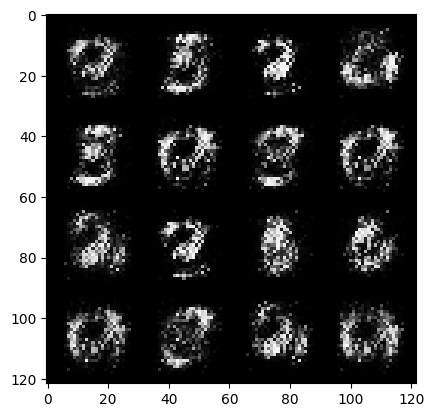

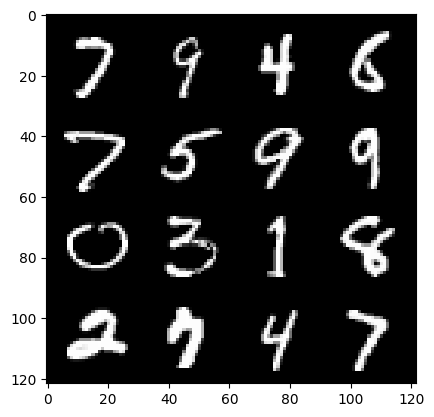

14: step 6600 / Gen loss: 6.70265899817149 / disc_loss: 0.014580973490762206


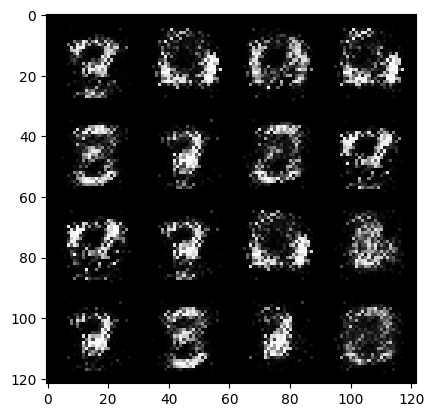

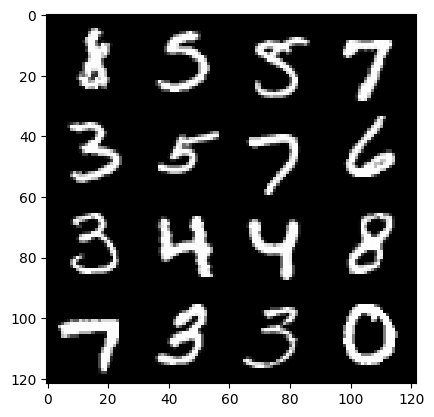

14: step 6900 / Gen loss: 6.730184162457782 / disc_loss: 0.01408353308759009


  0%|          | 0/469 [00:00<?, ?it/s]

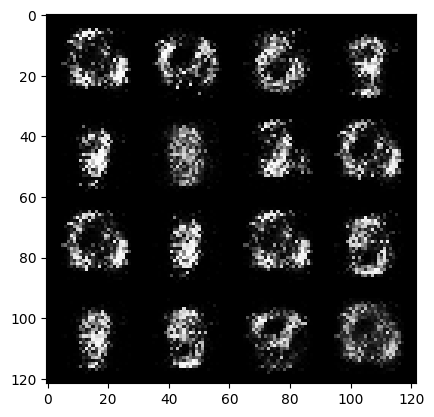

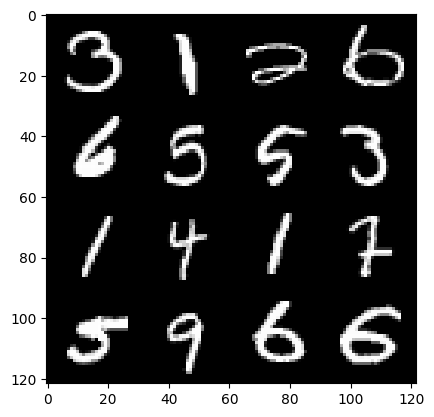

15: step 7200 / Gen loss: 6.722340531349186 / disc_loss: 0.012283082554737717


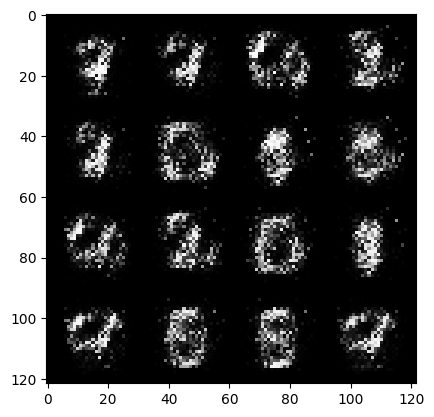

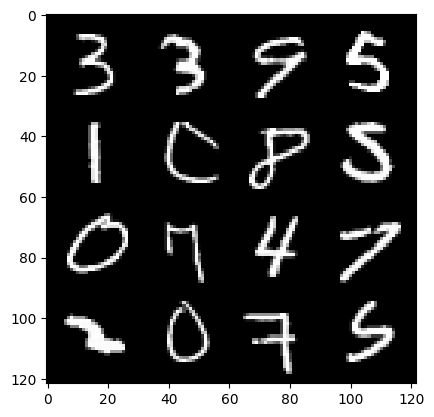

15: step 7500 / Gen loss: 6.805516610145565 / disc_loss: 0.00901947397273034


  0%|          | 0/469 [00:00<?, ?it/s]

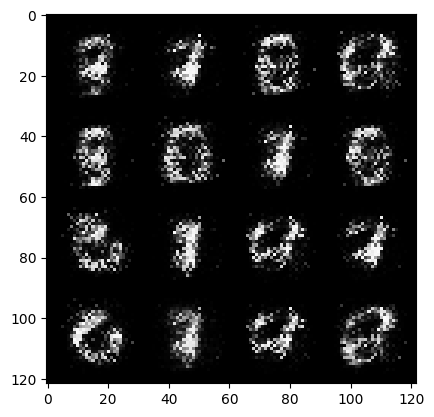

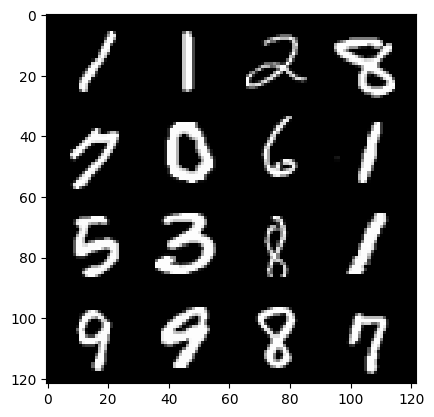

16: step 7800 / Gen loss: 7.280828215281164 / disc_loss: 0.007548263611970471


  0%|          | 0/469 [00:00<?, ?it/s]

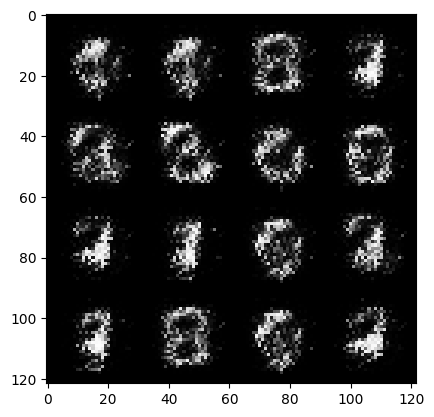

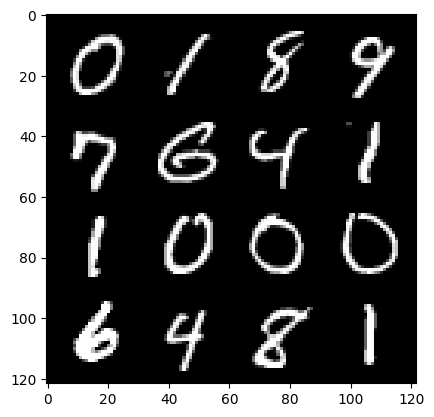

17: step 8100 / Gen loss: 7.173112249374393 / disc_loss: 0.0084122194784383


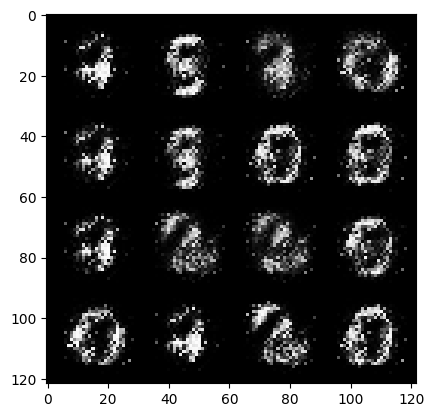

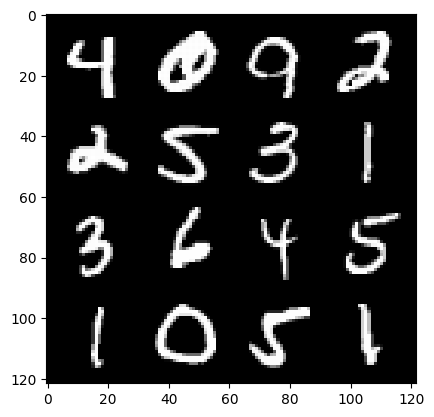

17: step 8400 / Gen loss: 7.308927062352499 / disc_loss: 0.00859321823421245


  0%|          | 0/469 [00:00<?, ?it/s]

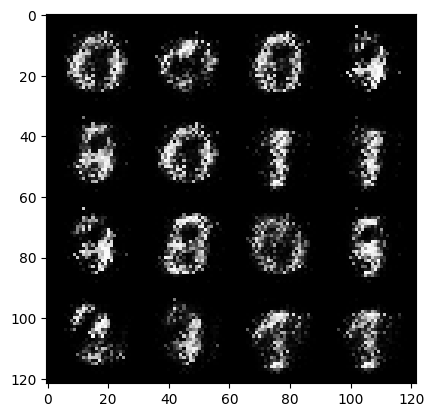

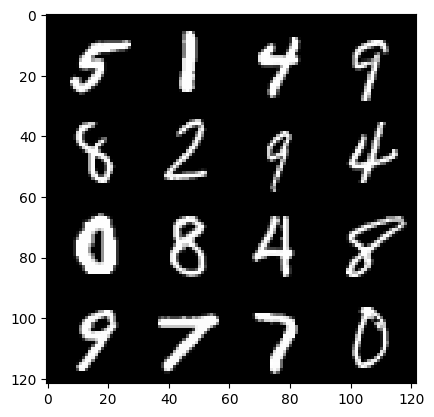

18: step 8700 / Gen loss: 7.099102770487465 / disc_loss: 0.010881192579399788


  0%|          | 0/469 [00:00<?, ?it/s]

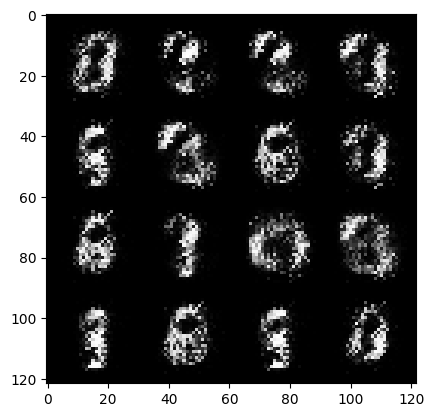

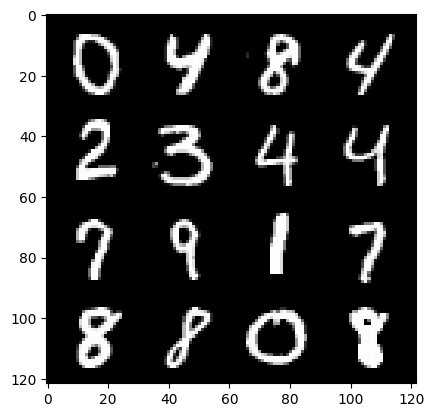

19: step 9000 / Gen loss: 7.238584807713826 / disc_loss: 0.011331065192352975


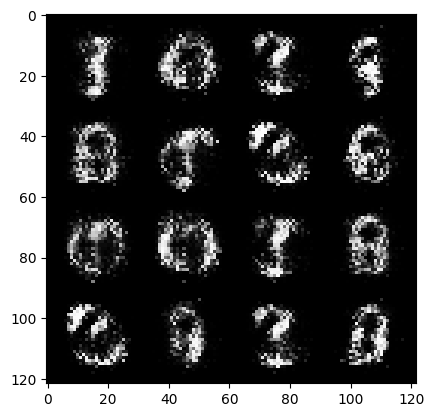

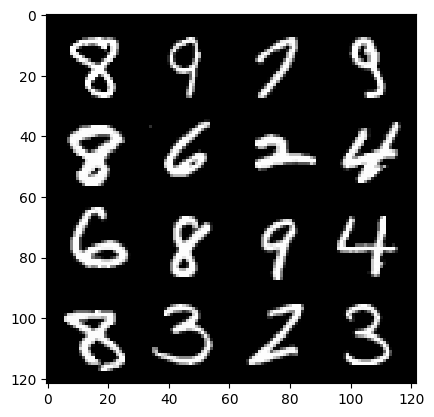

19: step 9300 / Gen loss: 6.932415334383649 / disc_loss: 0.010975676007413613


  0%|          | 0/469 [00:00<?, ?it/s]

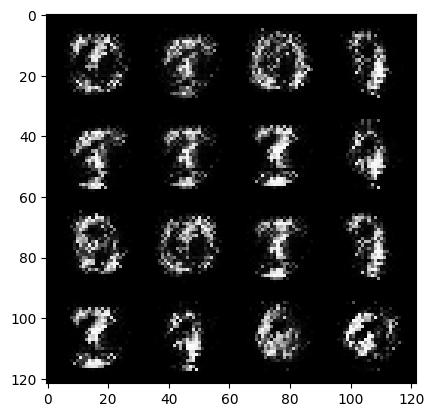

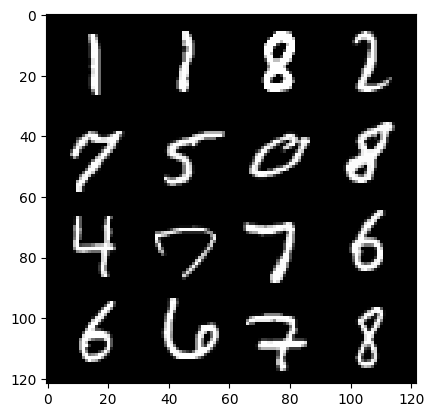

20: step 9600 / Gen loss: 6.7287282148996965 / disc_loss: 0.011049748081713925


  0%|          | 0/469 [00:00<?, ?it/s]

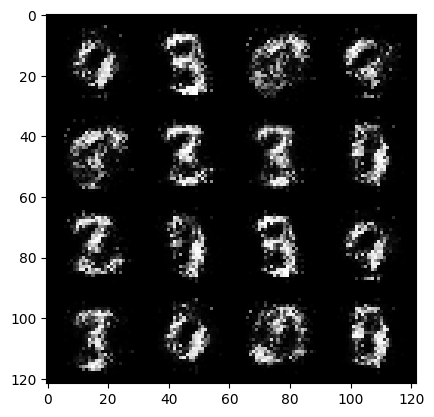

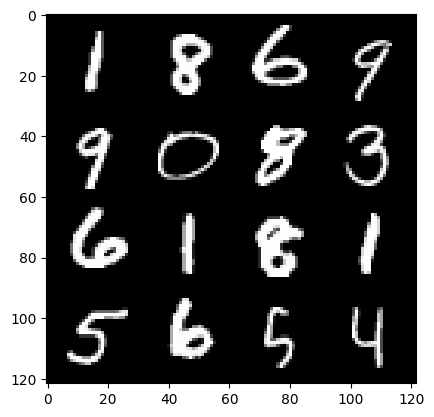

21: step 9900 / Gen loss: 6.9935614538192725 / disc_loss: 0.010460705381507675


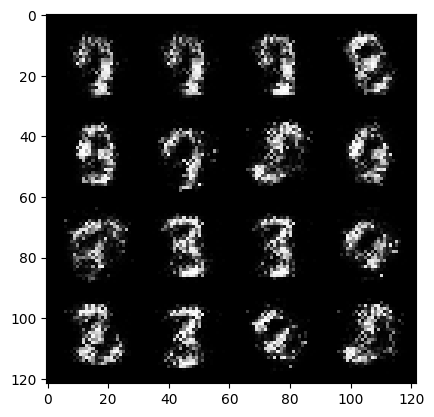

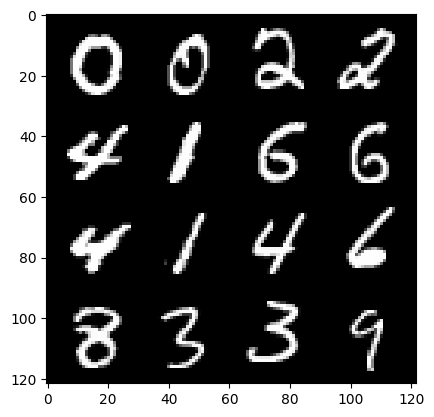

21: step 10200 / Gen loss: 7.107980403900143 / disc_loss: 0.01027532023920988


  0%|          | 0/469 [00:00<?, ?it/s]

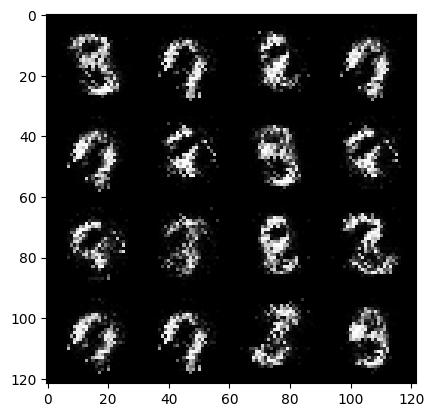

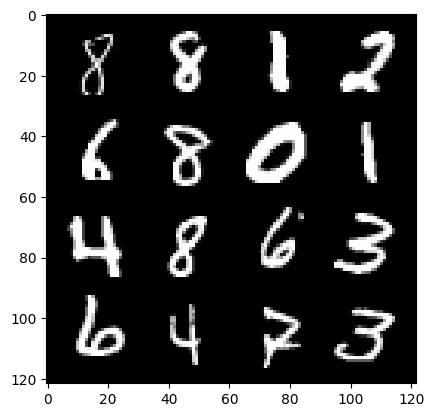

22: step 10500 / Gen loss: 7.1032285499572785 / disc_loss: 0.009472747698115803


  0%|          | 0/469 [00:00<?, ?it/s]

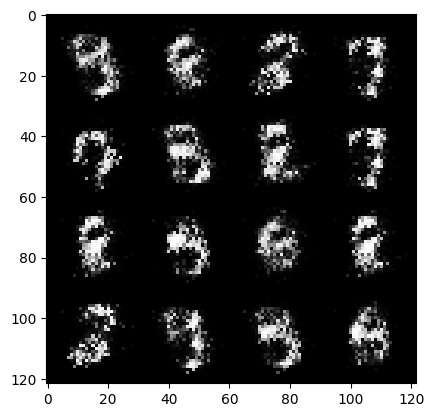

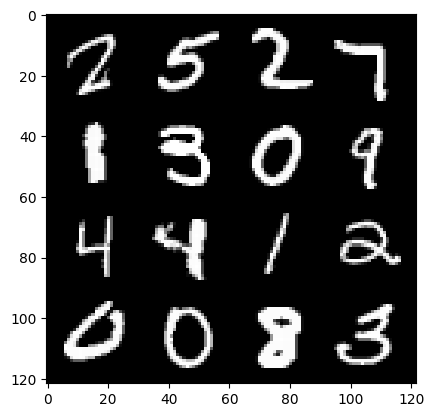

23: step 10800 / Gen loss: 6.932380681037899 / disc_loss: 0.010477828065631911


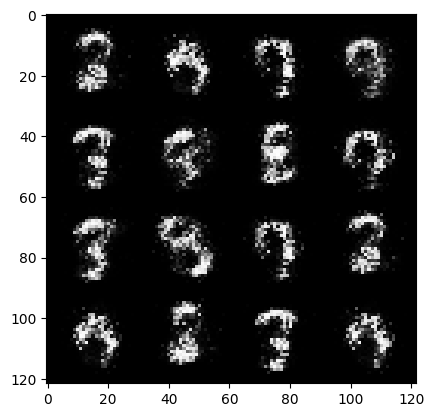

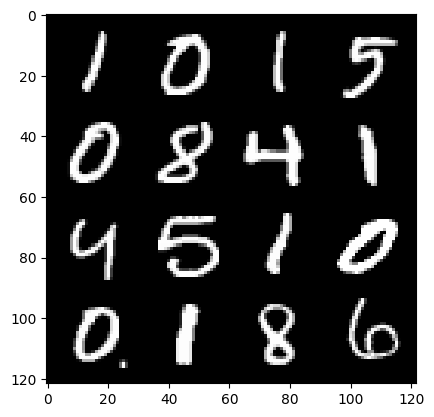

23: step 11100 / Gen loss: 6.723148560523983 / disc_loss: 0.01410125760283942


  0%|          | 0/469 [00:00<?, ?it/s]

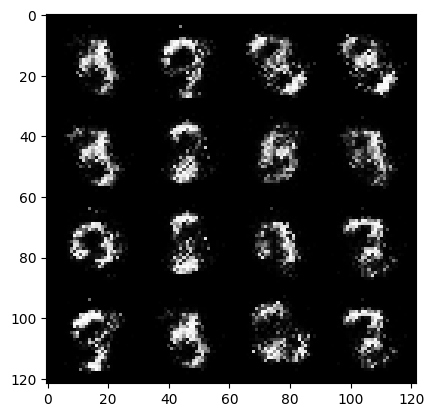

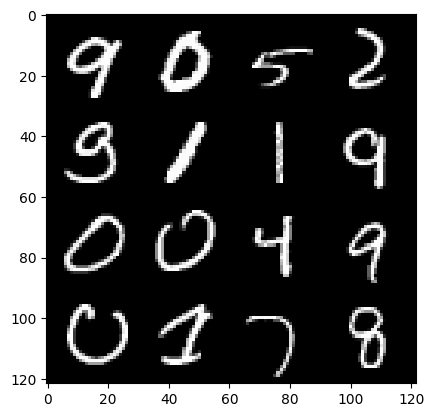

24: step 11400 / Gen loss: 6.393818801244099 / disc_loss: 0.014655796171476453


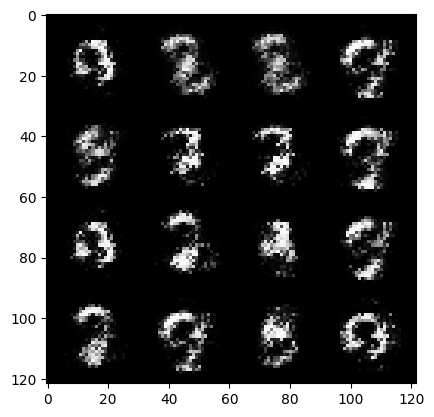

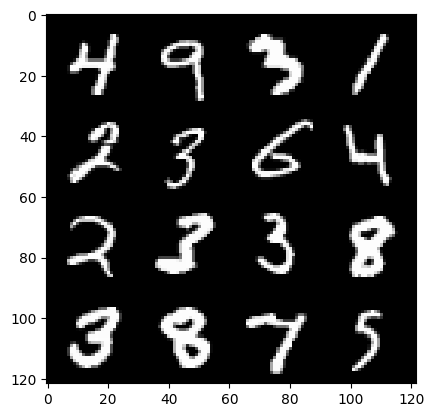

24: step 11700 / Gen loss: 6.5697817134857175 / disc_loss: 0.015656144403231643


  0%|          | 0/469 [00:00<?, ?it/s]

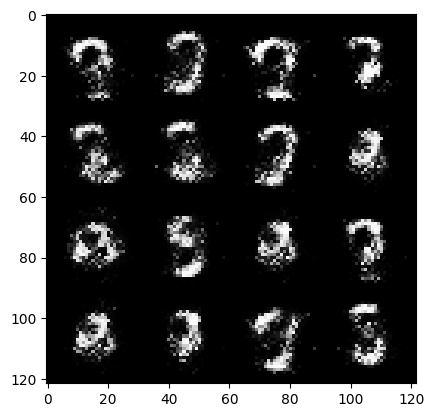

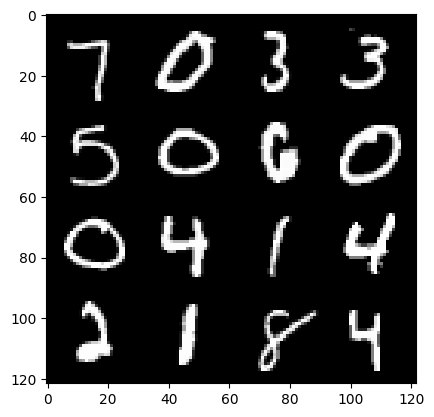

25: step 12000 / Gen loss: 6.575460252761845 / disc_loss: 0.015677197371454288


  0%|          | 0/469 [00:00<?, ?it/s]

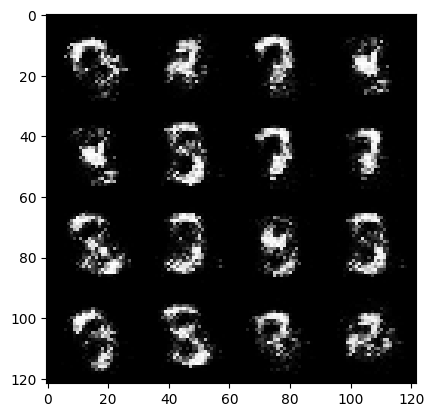

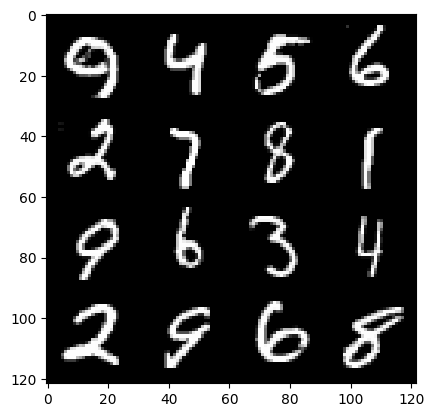

26: step 12300 / Gen loss: 6.820670579274497 / disc_loss: 0.015230645959575968


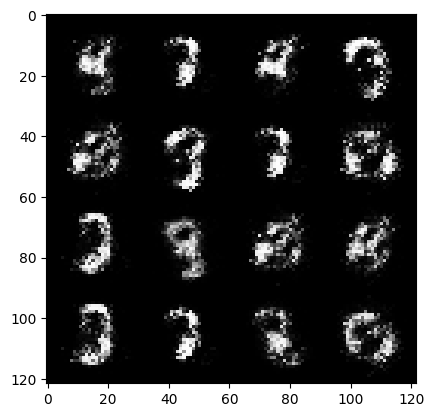

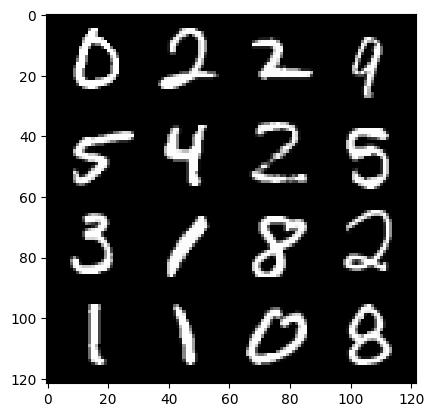

26: step 12600 / Gen loss: 6.901374316215516 / disc_loss: 0.014387904837106672


  0%|          | 0/469 [00:00<?, ?it/s]

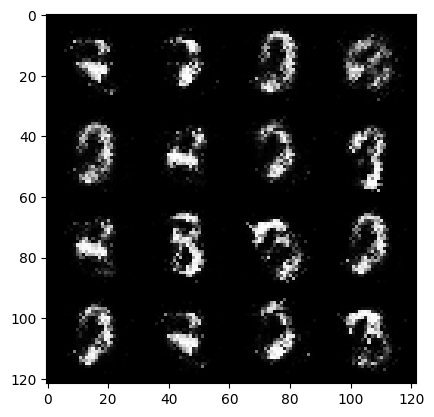

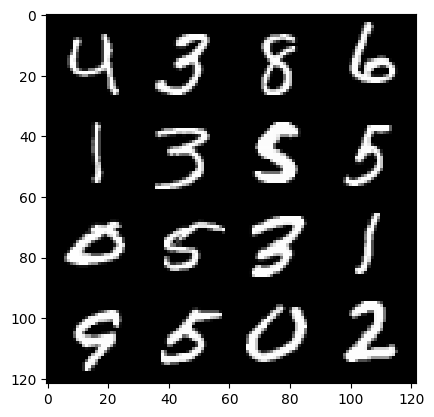

27: step 12900 / Gen loss: 6.938834149042769 / disc_loss: 0.016556681958027192


  0%|          | 0/469 [00:00<?, ?it/s]

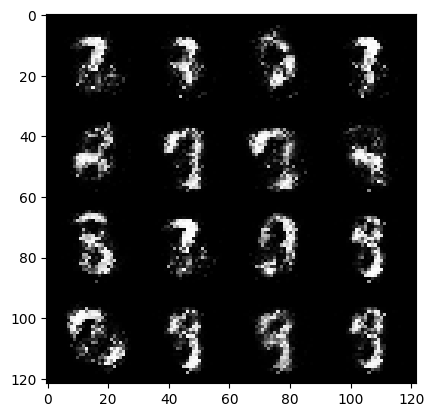

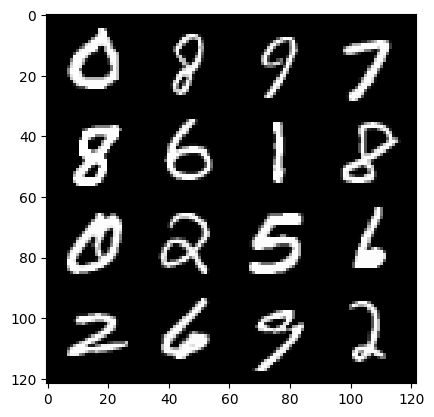

28: step 13200 / Gen loss: 6.64430578231812 / disc_loss: 0.02031276642034451


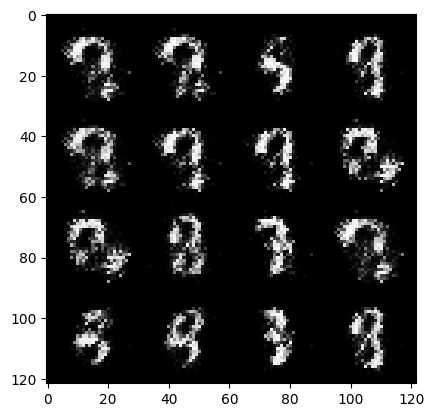

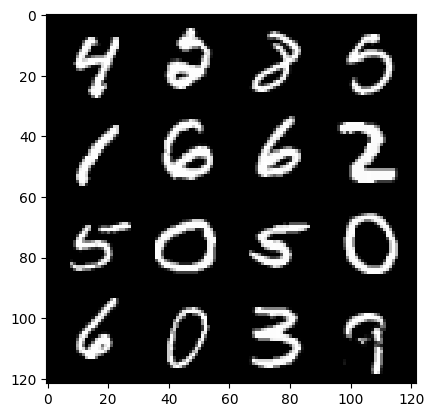

28: step 13500 / Gen loss: 6.788205993970235 / disc_loss: 0.02003220626618715


  0%|          | 0/469 [00:00<?, ?it/s]

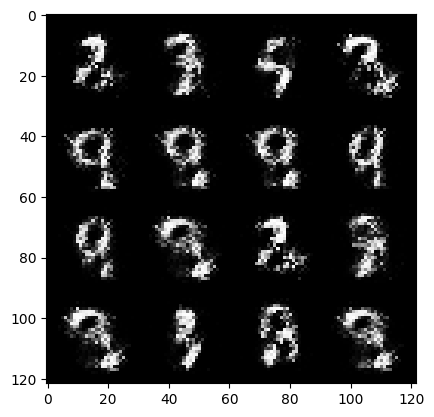

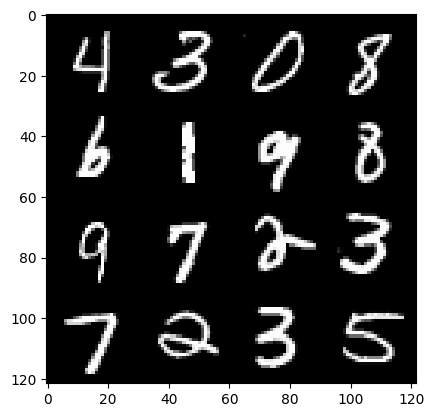

29: step 13800 / Gen loss: 6.749030249913539 / disc_loss: 0.021624155058525496


  0%|          | 0/469 [00:00<?, ?it/s]

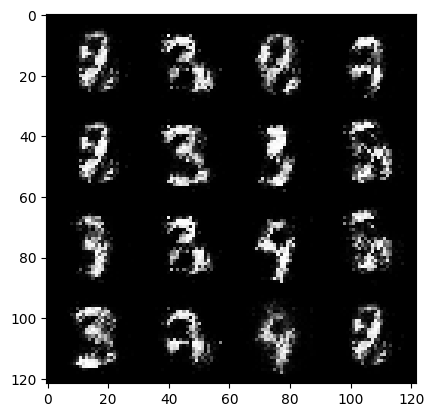

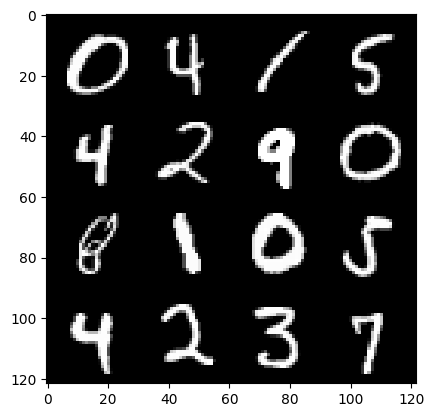

30: step 14100 / Gen loss: 6.4878676637013735 / disc_loss: 0.02080402126302942


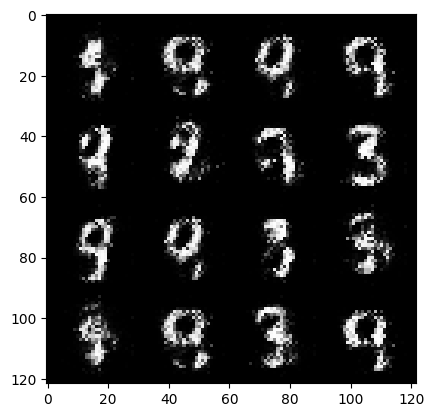

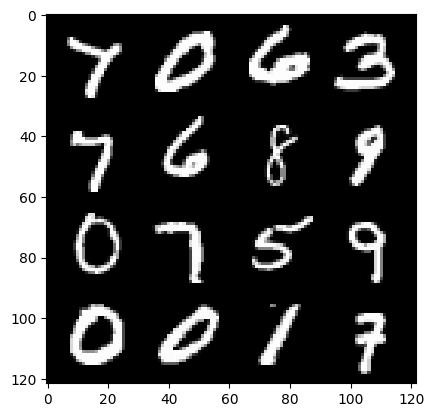

30: step 14400 / Gen loss: 6.547316629091905 / disc_loss: 0.02173656915857767


  0%|          | 0/469 [00:00<?, ?it/s]

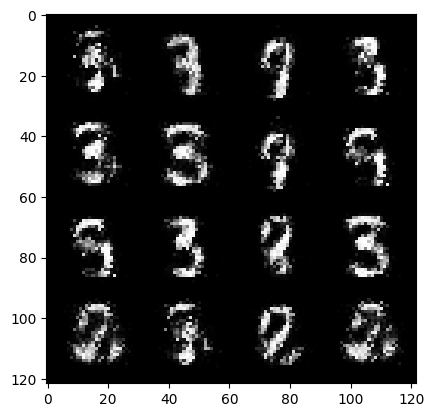

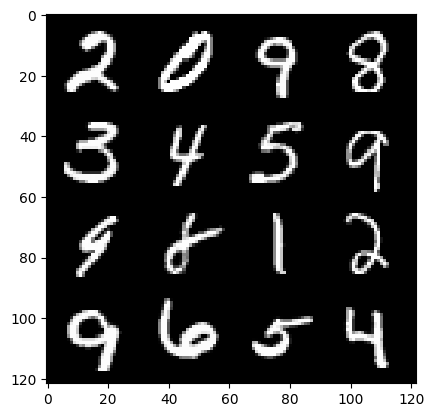

31: step 14700 / Gen loss: 6.1134378846486435 / disc_loss: 0.02368278395306943


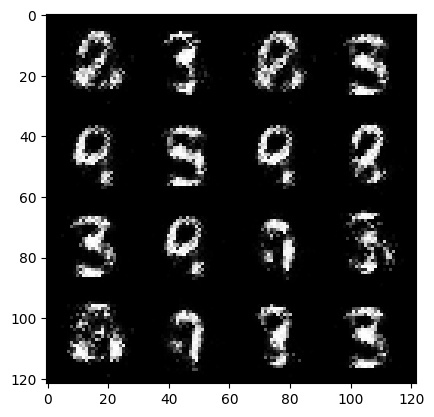

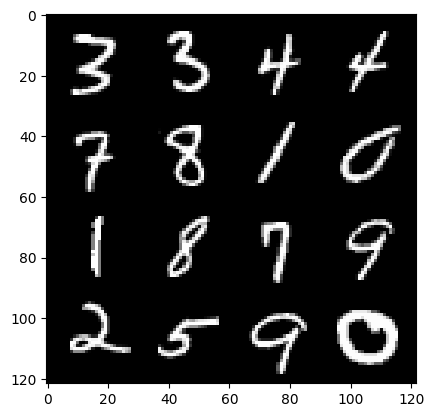

31: step 15000 / Gen loss: 5.954046870867416 / disc_loss: 0.022077122634897608


  0%|          | 0/469 [00:00<?, ?it/s]

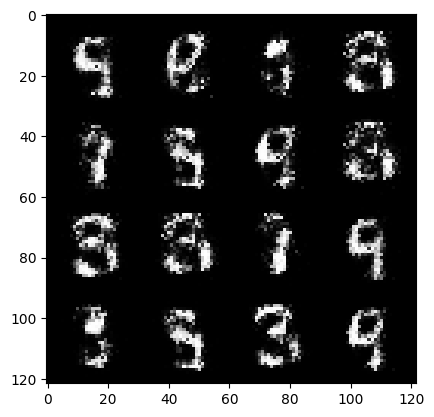

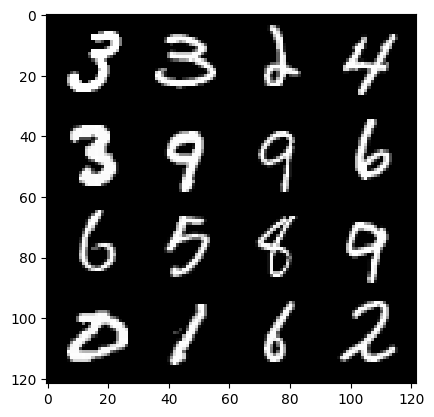

32: step 15300 / Gen loss: 6.154498159090679 / disc_loss: 0.023375220025579128


  0%|          | 0/469 [00:00<?, ?it/s]

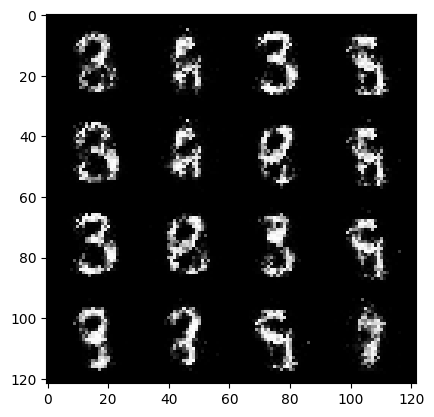

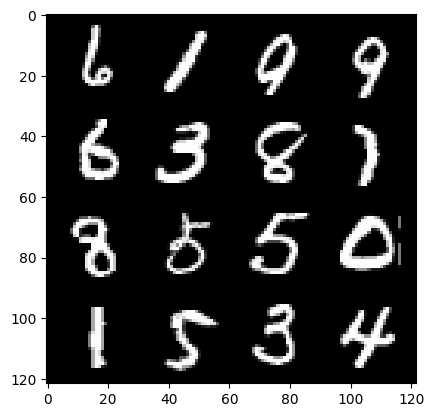

33: step 15600 / Gen loss: 6.170789728164672 / disc_loss: 0.022711341901061447


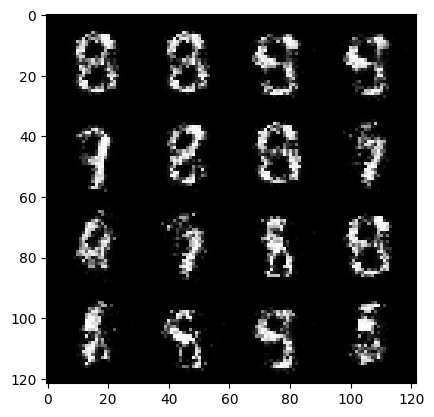

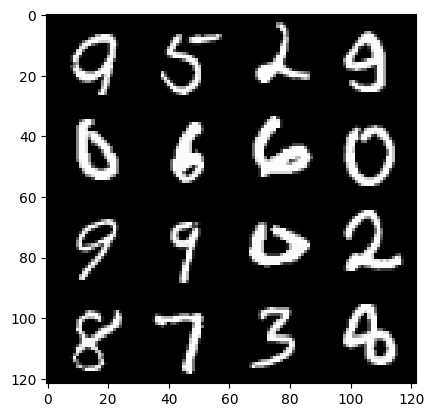

33: step 15900 / Gen loss: 6.084517332712807 / disc_loss: 0.025232202213568


  0%|          | 0/469 [00:00<?, ?it/s]

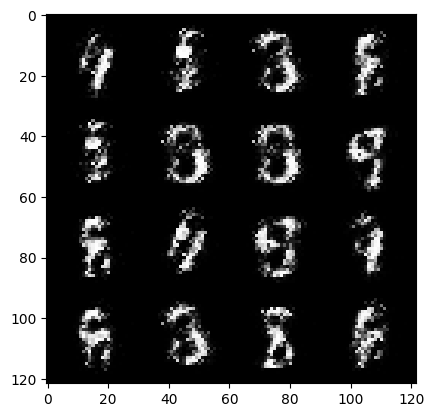

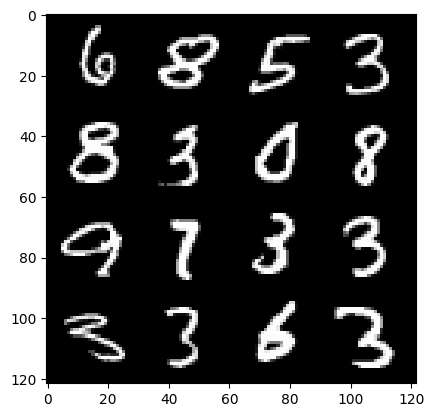

34: step 16200 / Gen loss: 6.094078240394596 / disc_loss: 0.02651495893641063


  0%|          | 0/469 [00:00<?, ?it/s]

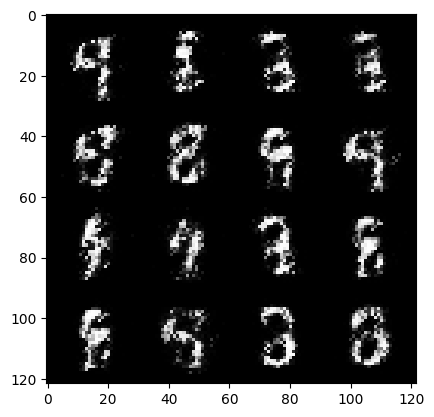

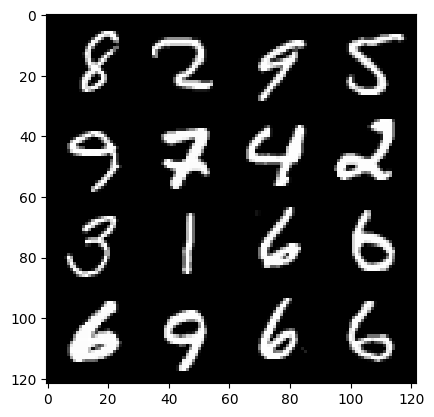

35: step 16500 / Gen loss: 6.395295880635578 / disc_loss: 0.0236400450548778


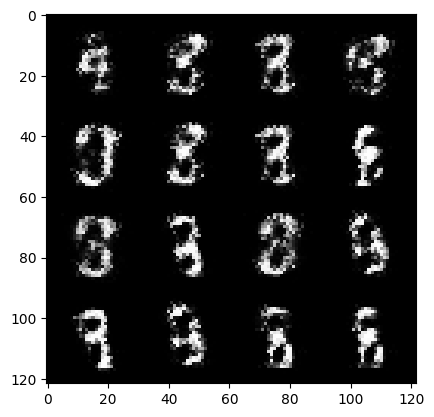

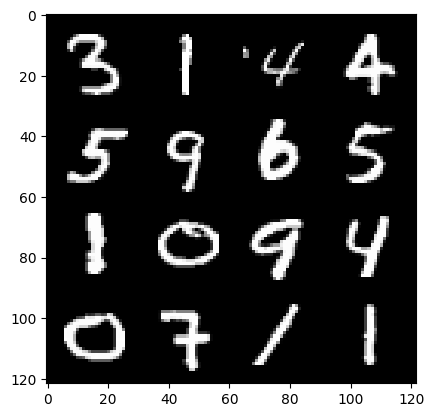

35: step 16800 / Gen loss: 6.312568397521971 / disc_loss: 0.026877814192945763


  0%|          | 0/469 [00:00<?, ?it/s]

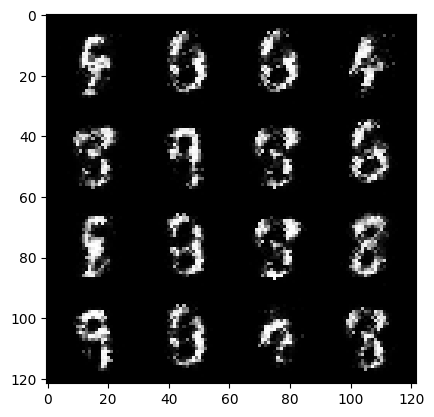

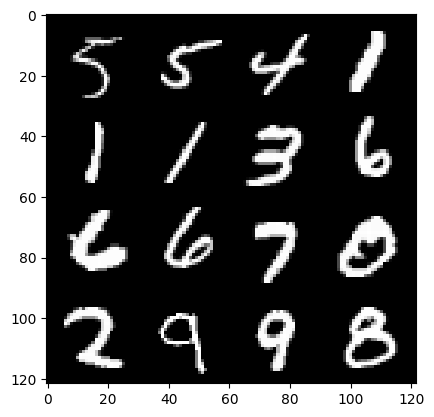

36: step 17100 / Gen loss: 6.287439497311912 / disc_loss: 0.03238971097084383


  0%|          | 0/469 [00:00<?, ?it/s]

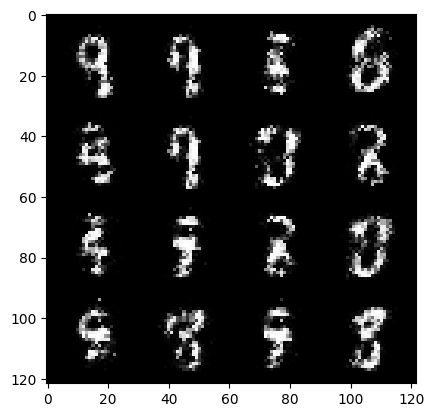

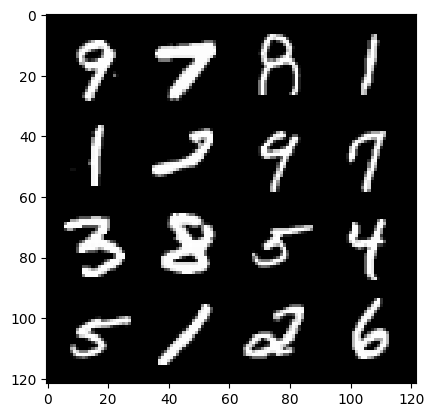

37: step 17400 / Gen loss: 6.489437479972846 / disc_loss: 0.03060413326757649


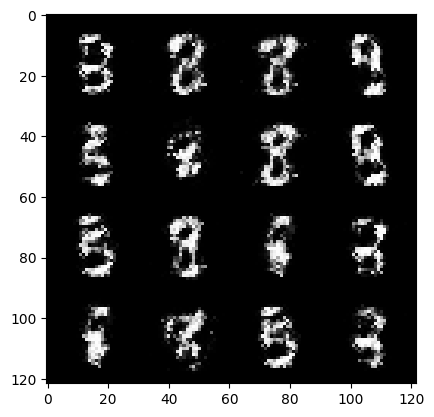

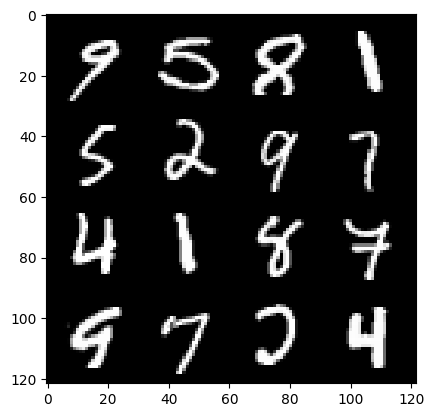

37: step 17700 / Gen loss: 6.161928785641988 / disc_loss: 0.03196928216454883


  0%|          | 0/469 [00:00<?, ?it/s]

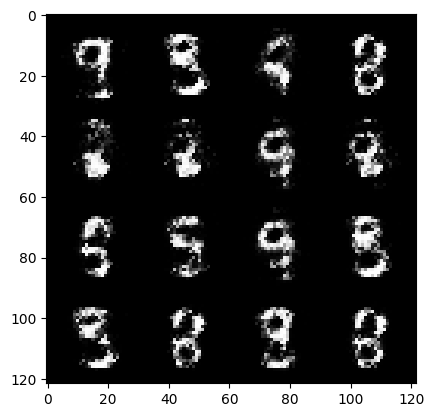

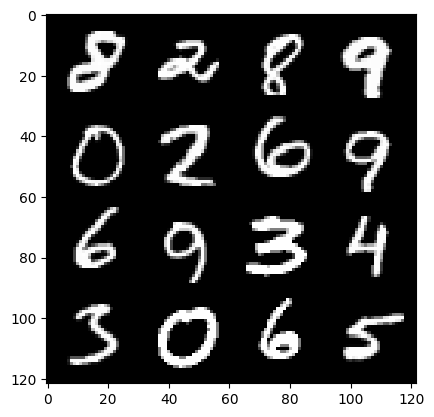

38: step 18000 / Gen loss: 5.930011828740439 / disc_loss: 0.03707850644985835


  0%|          | 0/469 [00:00<?, ?it/s]

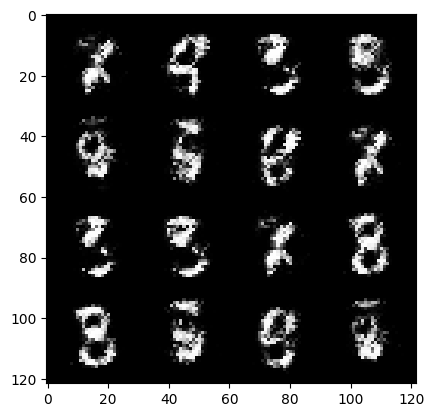

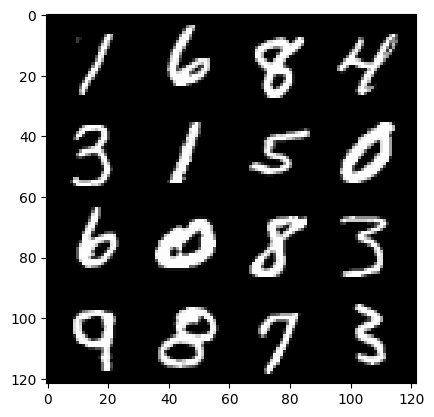

39: step 18300 / Gen loss: 6.004360521634418 / disc_loss: 0.03780933033364515


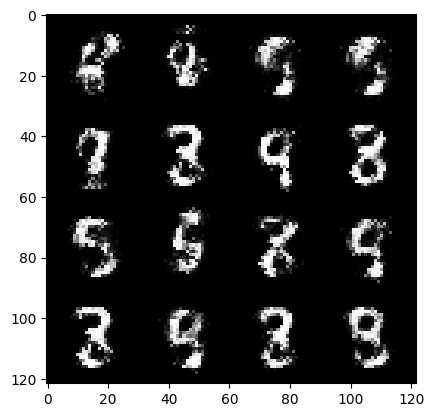

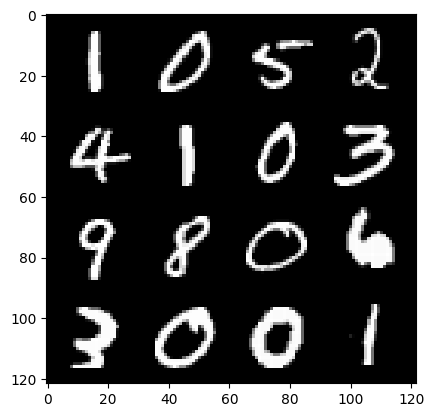

39: step 18600 / Gen loss: 6.07608908653259 / disc_loss: 0.037249819971621044


  0%|          | 0/469 [00:00<?, ?it/s]

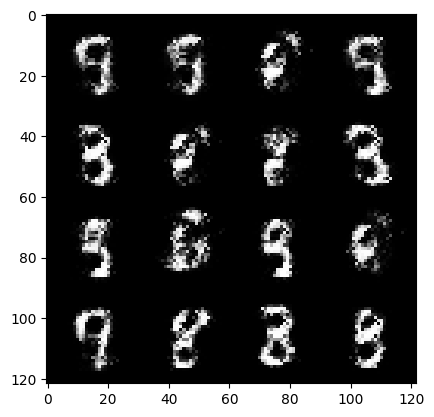

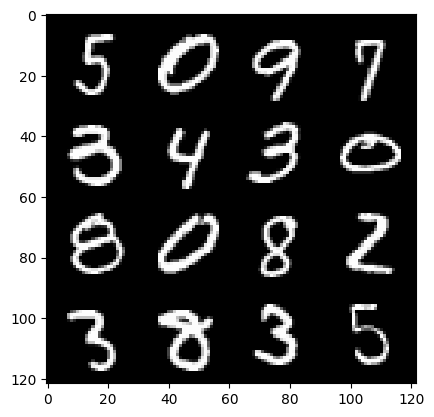

40: step 18900 / Gen loss: 5.944559419949845 / disc_loss: 0.040780456506957635


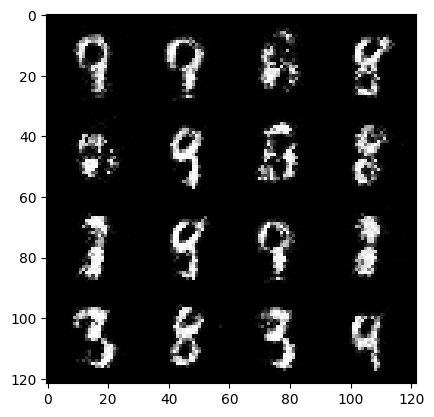

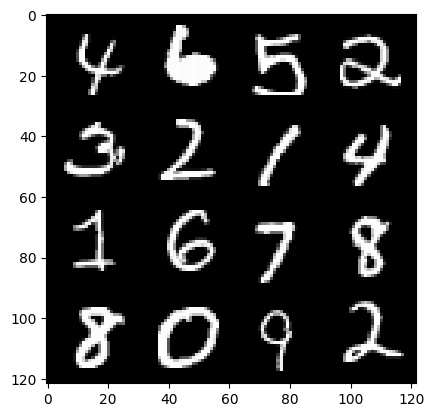

40: step 19200 / Gen loss: 5.58377060731252 / disc_loss: 0.03940144032550355


  0%|          | 0/469 [00:00<?, ?it/s]

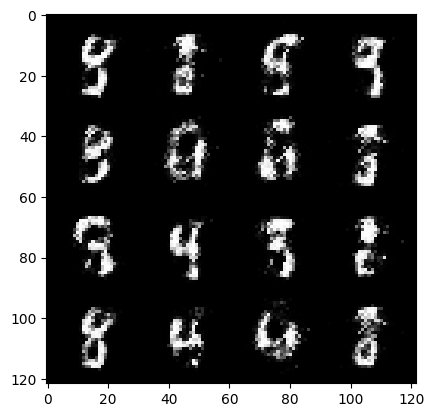

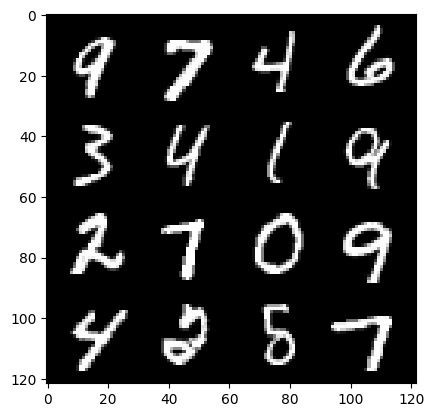

41: step 19500 / Gen loss: 5.494547317822772 / disc_loss: 0.045974413960551234


  0%|          | 0/469 [00:00<?, ?it/s]

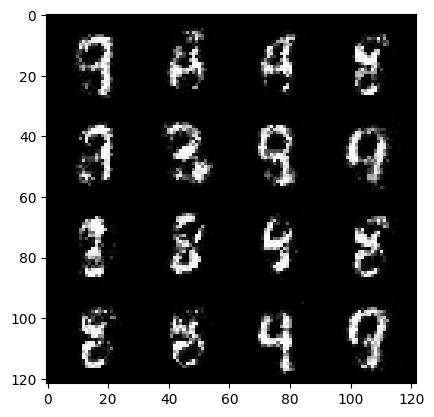

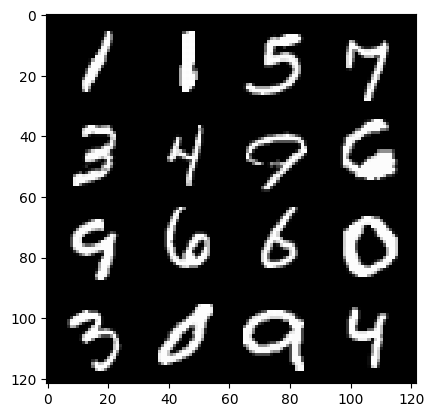

42: step 19800 / Gen loss: 5.311305540402729 / disc_loss: 0.04735808824499448


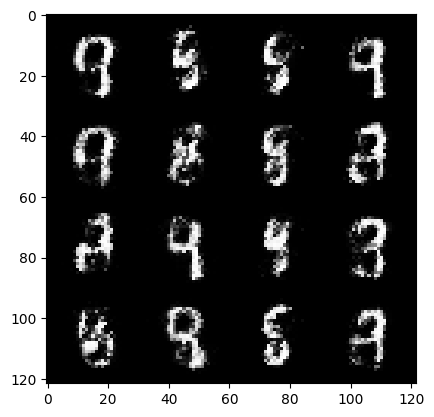

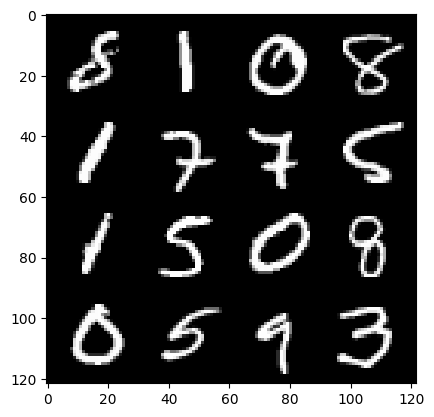

42: step 20100 / Gen loss: 5.148744756380716 / disc_loss: 0.05403702642458177


  0%|          | 0/469 [00:00<?, ?it/s]

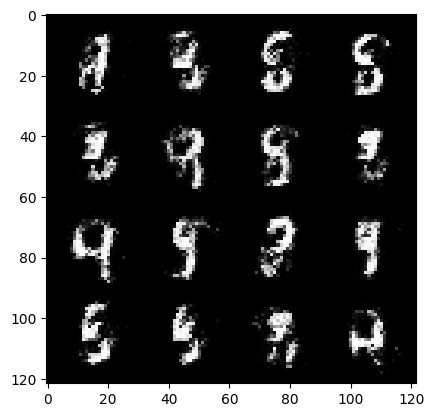

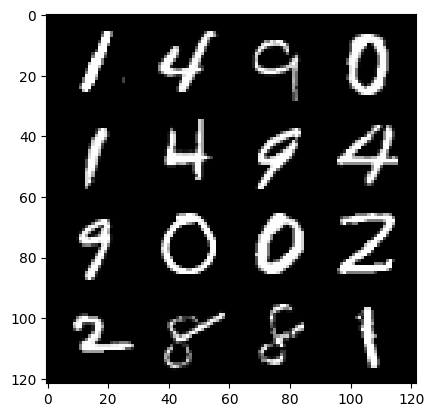

43: step 20400 / Gen loss: 5.405984048843386 / disc_loss: 0.05056663952146968


  0%|          | 0/469 [00:00<?, ?it/s]

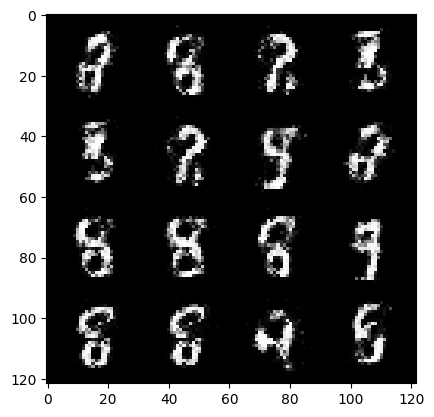

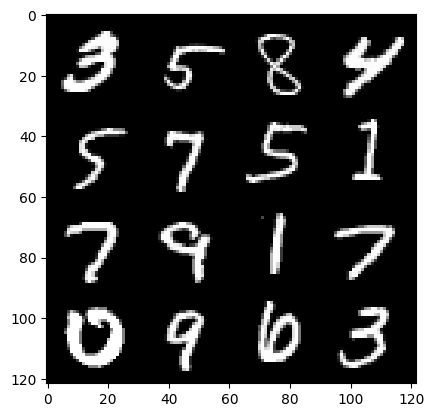

44: step 20700 / Gen loss: 5.348594517707826 / disc_loss: 0.050633126938094686


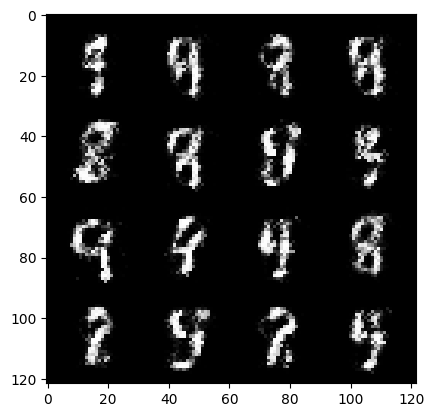

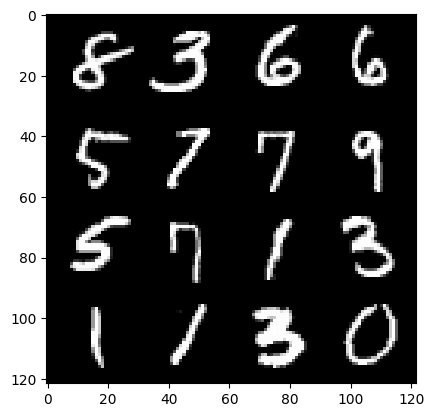

44: step 21000 / Gen loss: 5.2940203809738104 / disc_loss: 0.053668097574263794


  0%|          | 0/469 [00:00<?, ?it/s]

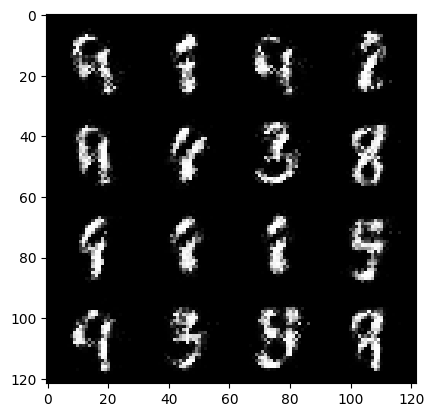

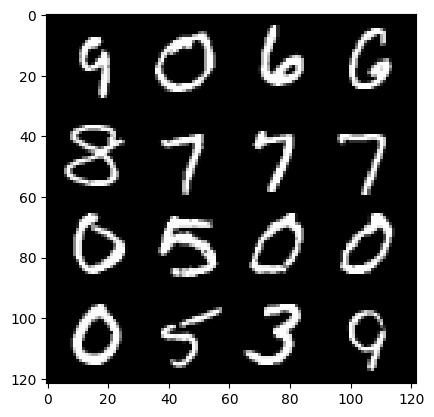

45: step 21300 / Gen loss: 5.153569706281023 / disc_loss: 0.05303557831483583


  0%|          | 0/469 [00:00<?, ?it/s]

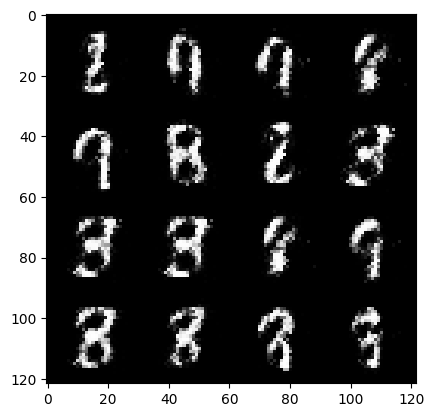

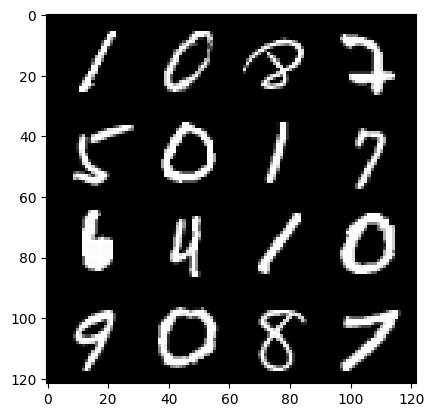

46: step 21600 / Gen loss: 5.0033961264292355 / disc_loss: 0.05456365941092372


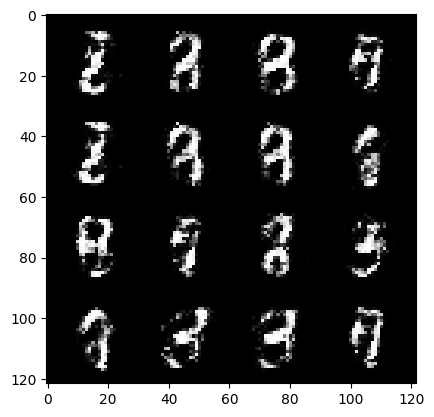

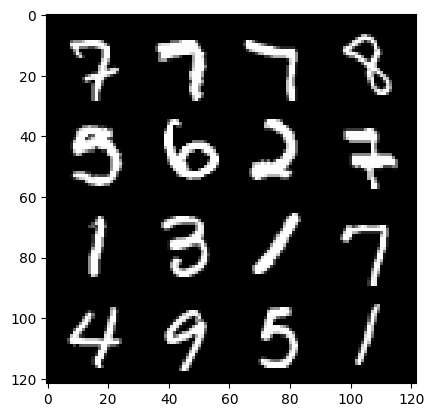

46: step 21900 / Gen loss: 4.991071357727052 / disc_loss: 0.05158293761933844


  0%|          | 0/469 [00:00<?, ?it/s]

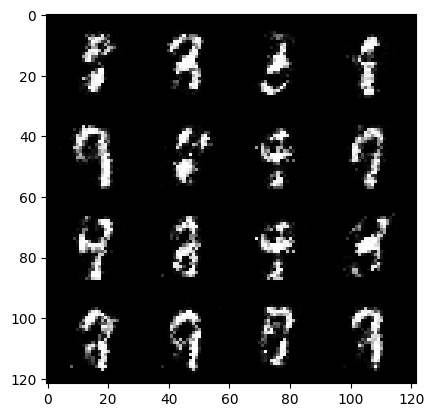

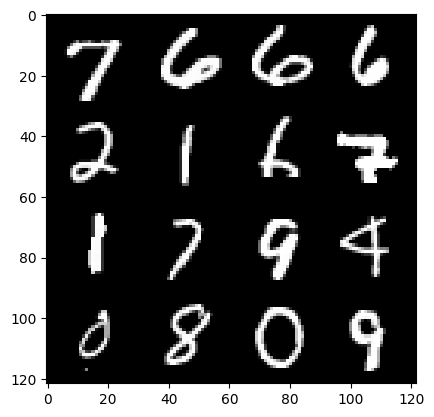

47: step 22200 / Gen loss: 5.090132228533425 / disc_loss: 0.052097487980499894


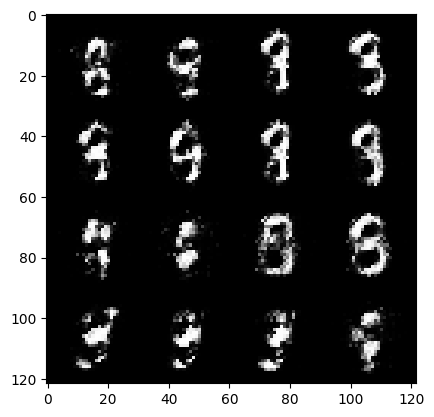

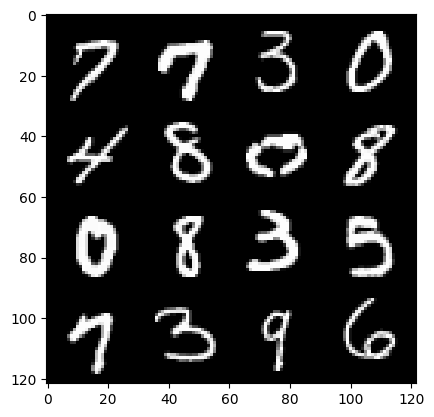

47: step 22500 / Gen loss: 5.3001792462666835 / disc_loss: 0.057190433988968566


  0%|          | 0/469 [00:00<?, ?it/s]

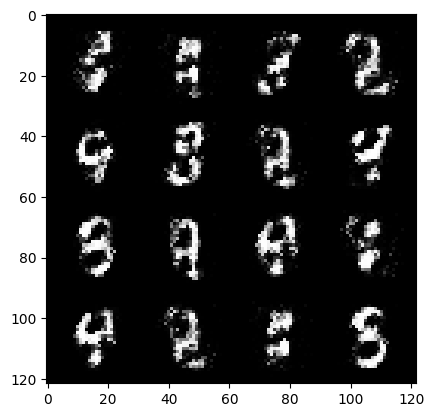

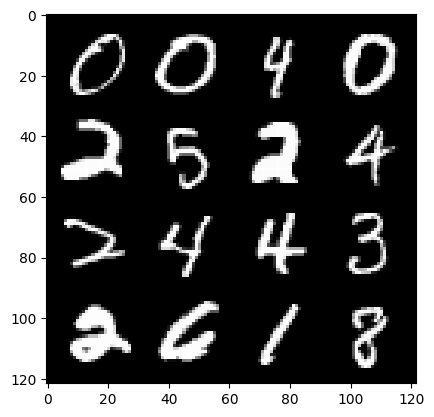

48: step 22800 / Gen loss: 5.334393091201786 / disc_loss: 0.05964967470616101


  0%|          | 0/469 [00:00<?, ?it/s]

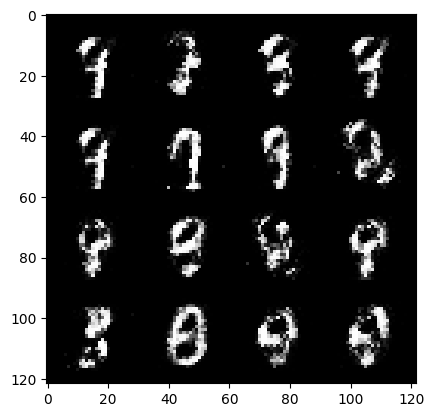

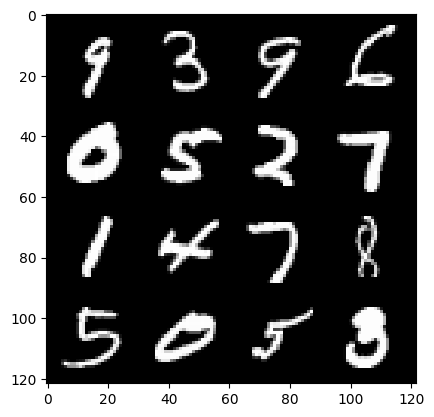

49: step 23100 / Gen loss: 5.337547491391501 / disc_loss: 0.05638985065122449


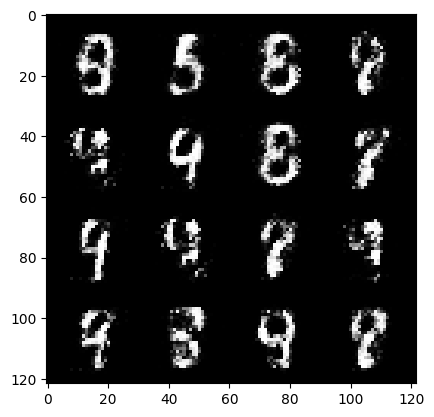

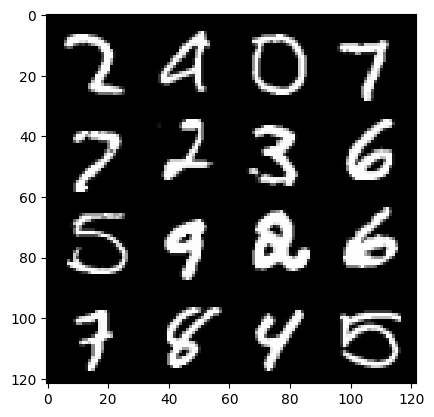

49: step 23400 / Gen loss: 5.211842659314471 / disc_loss: 0.05064607721753419


  0%|          | 0/469 [00:00<?, ?it/s]

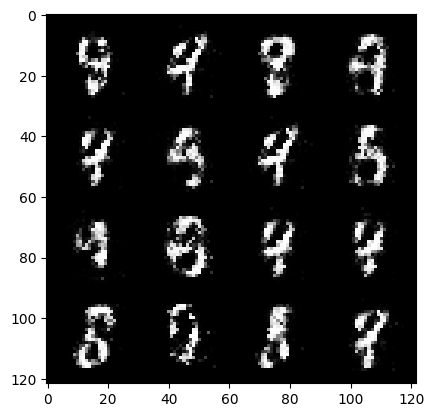

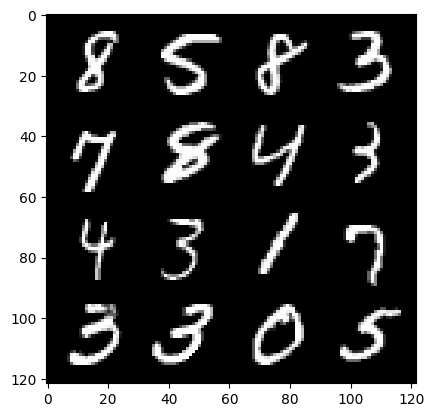

50: step 23700 / Gen loss: 5.022012125651041 / disc_loss: 0.05729069615093362


  0%|          | 0/469 [00:00<?, ?it/s]

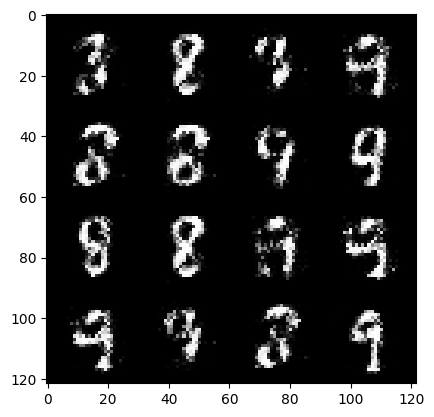

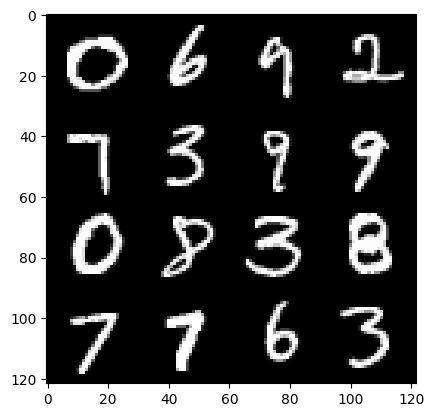

51: step 24000 / Gen loss: 4.979920078118642 / disc_loss: 0.059273867396016915


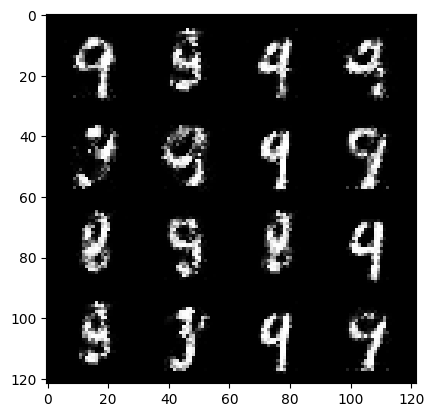

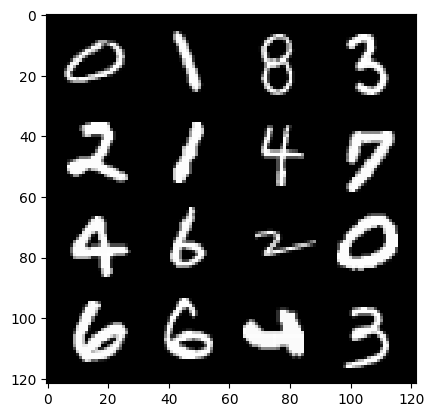

51: step 24300 / Gen loss: 4.950265351136524 / disc_loss: 0.06718649215064945


  0%|          | 0/469 [00:00<?, ?it/s]

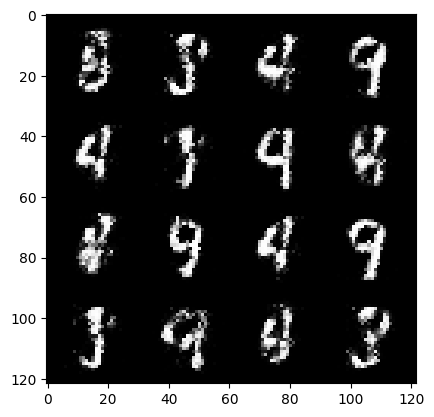

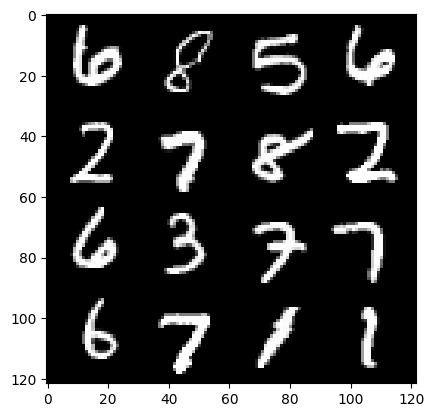

52: step 24600 / Gen loss: 4.824142858187357 / disc_loss: 0.08126405645161863


  0%|          | 0/469 [00:00<?, ?it/s]

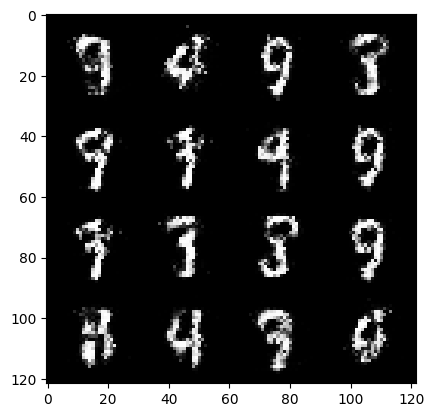

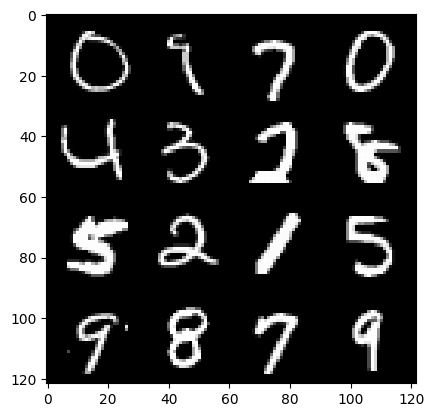

53: step 24900 / Gen loss: 4.726588630676272 / disc_loss: 0.06791401894763112


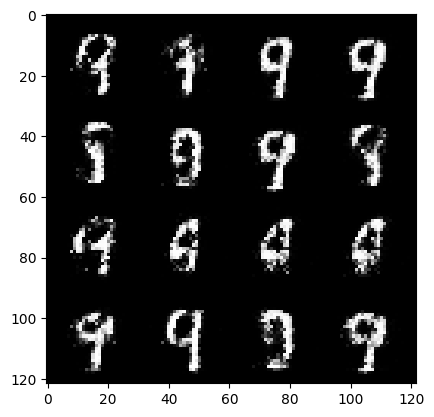

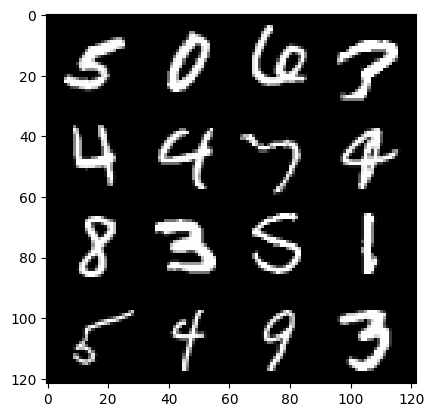

53: step 25200 / Gen loss: 4.611095869541168 / disc_loss: 0.08373299455270176


  0%|          | 0/469 [00:00<?, ?it/s]

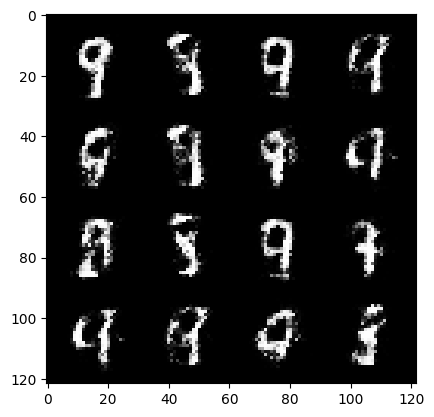

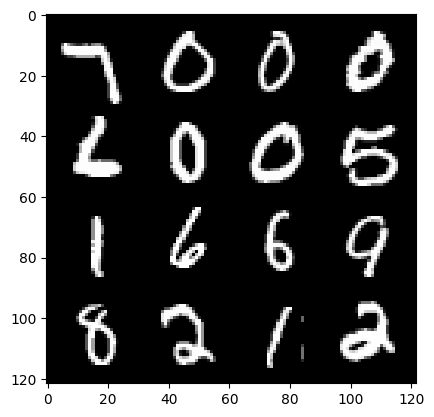

54: step 25500 / Gen loss: 4.7360857645670595 / disc_loss: 0.08220573843767244


  0%|          | 0/469 [00:00<?, ?it/s]

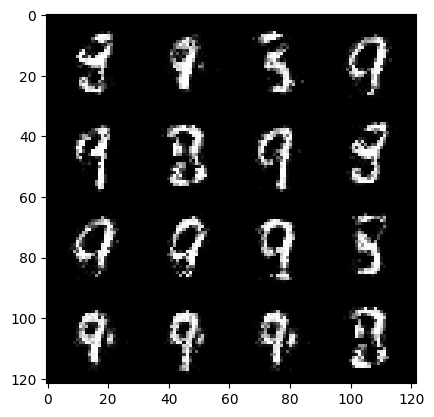

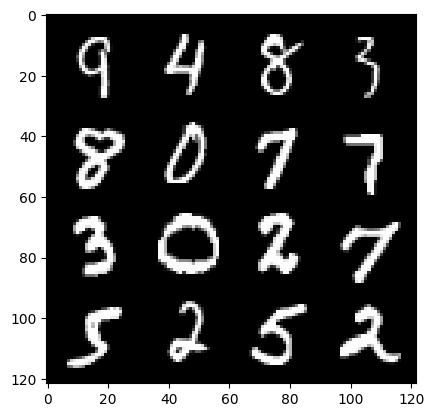

55: step 25800 / Gen loss: 4.690092445214588 / disc_loss: 0.09551068322733038


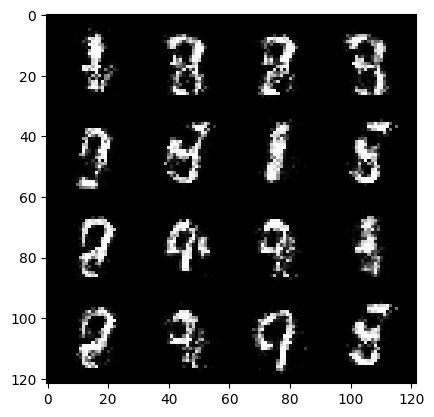

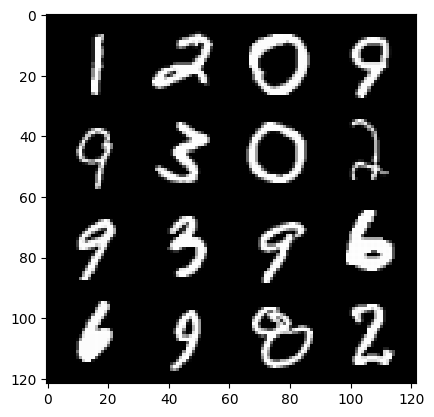

55: step 26100 / Gen loss: 4.540959825515748 / disc_loss: 0.08863563568020856


  0%|          | 0/469 [00:00<?, ?it/s]

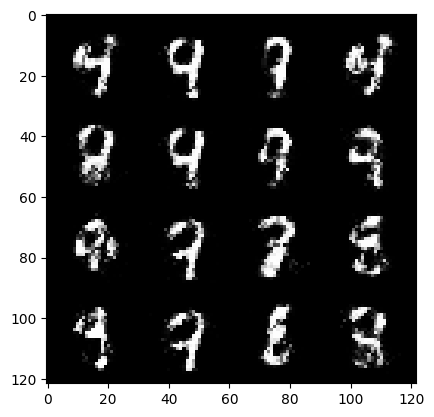

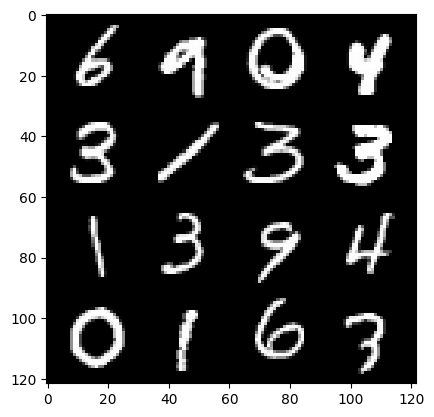

56: step 26400 / Gen loss: 4.5180298598607385 / disc_loss: 0.07959096606820826


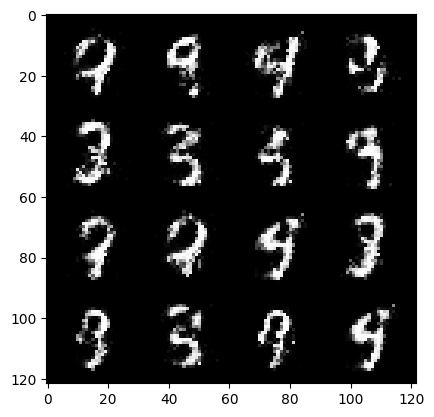

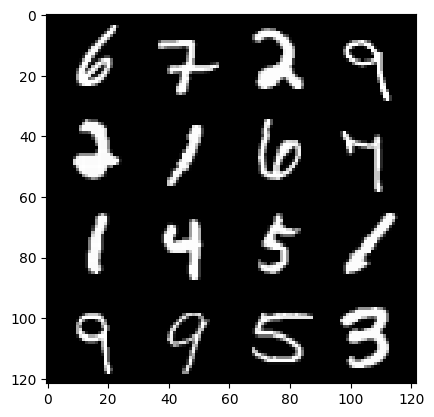

56: step 26700 / Gen loss: 4.524067404270171 / disc_loss: 0.08343101615707083


  0%|          | 0/469 [00:00<?, ?it/s]

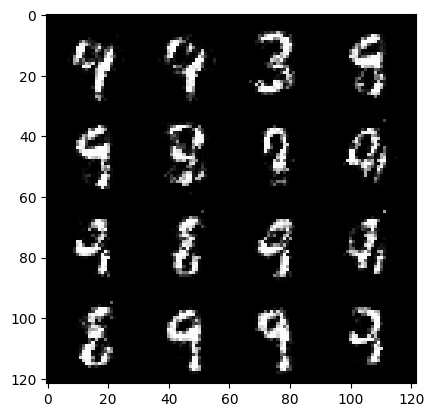

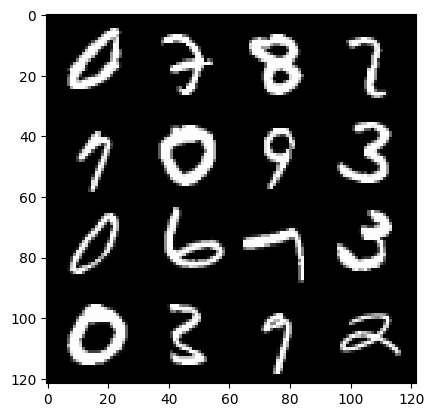

57: step 27000 / Gen loss: 4.595163008371988 / disc_loss: 0.0876526055671275


  0%|          | 0/469 [00:00<?, ?it/s]

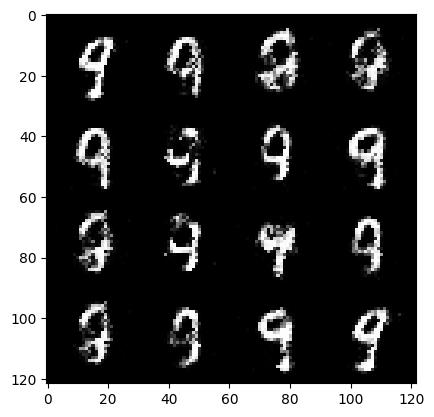

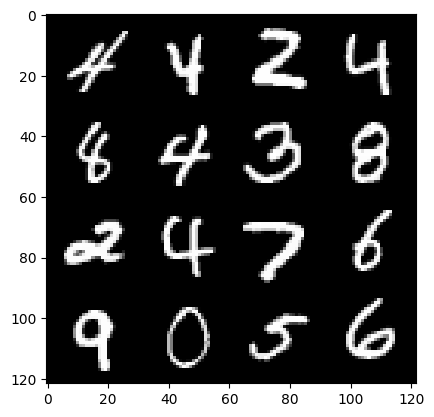

58: step 27300 / Gen loss: 4.494014212290445 / disc_loss: 0.08571939488252006


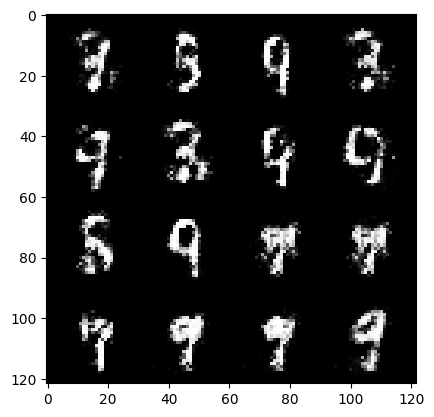

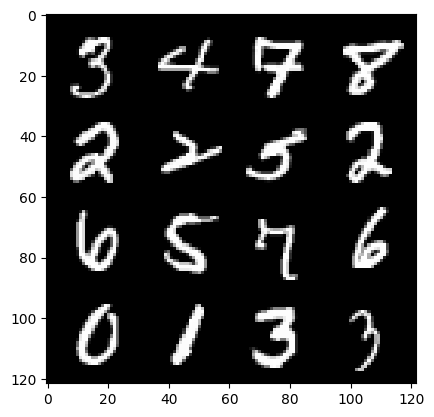

58: step 27600 / Gen loss: 4.413773020108539 / disc_loss: 0.0961199591557185


  0%|          | 0/469 [00:00<?, ?it/s]

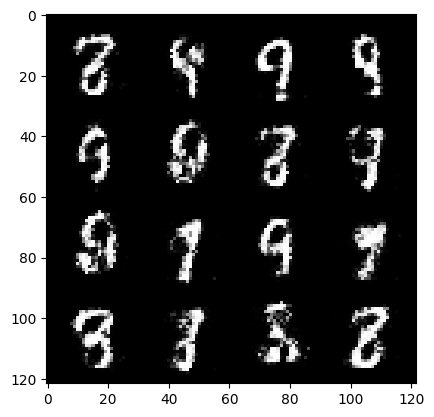

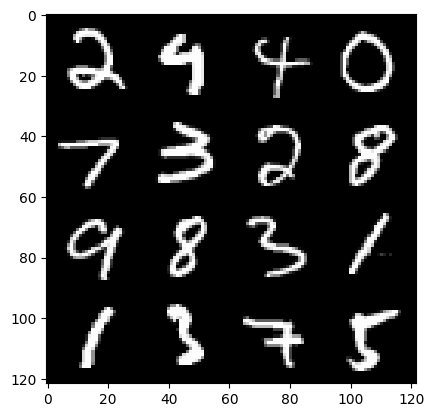

59: step 27900 / Gen loss: 4.531126735210418 / disc_loss: 0.08446660342315834


  0%|          | 0/469 [00:00<?, ?it/s]

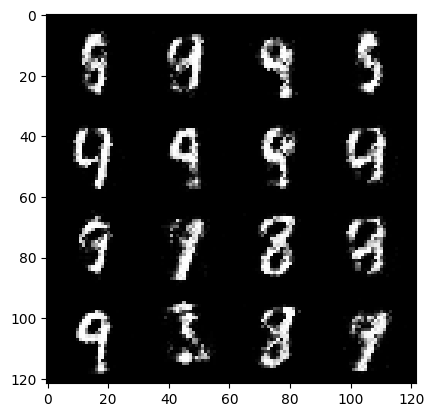

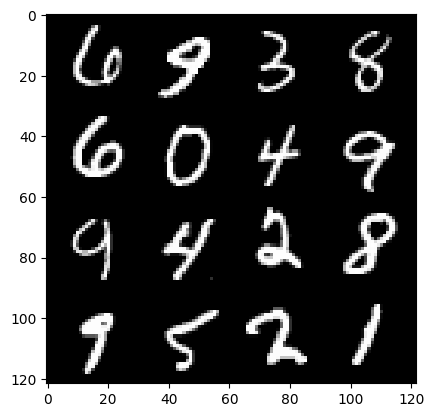

60: step 28200 / Gen loss: 4.3226988180478445 / disc_loss: 0.10148222595453273


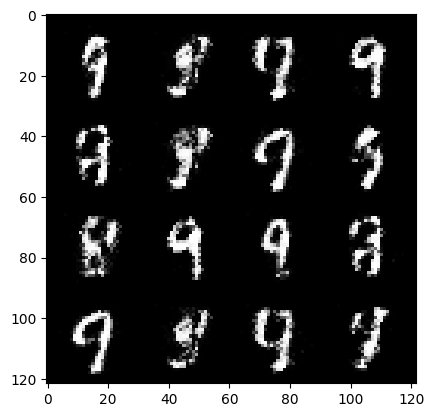

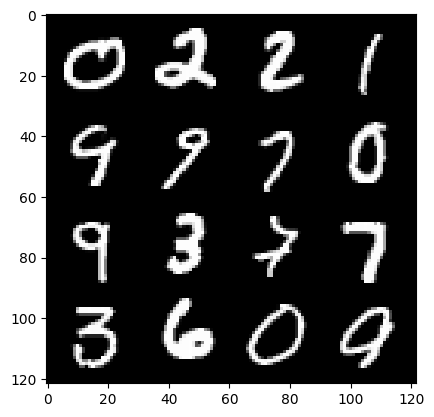

60: step 28500 / Gen loss: 4.3967017102241535 / disc_loss: 0.10080411914736029


  0%|          | 0/469 [00:00<?, ?it/s]

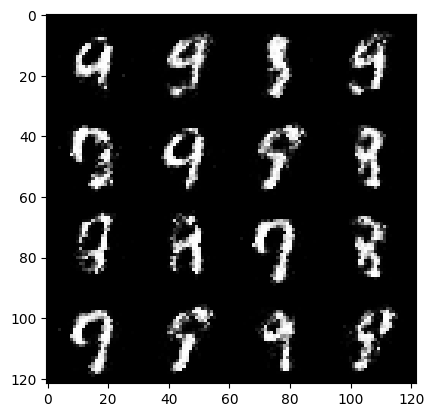

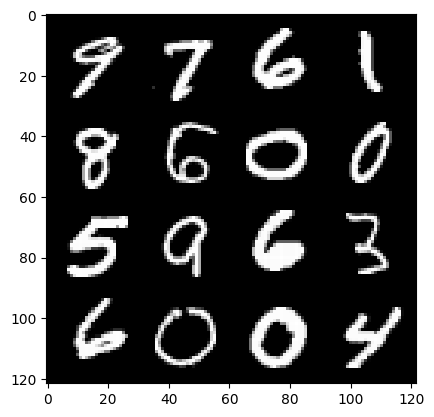

61: step 28800 / Gen loss: 4.237548961639405 / disc_loss: 0.10053521137684589


  0%|          | 0/469 [00:00<?, ?it/s]

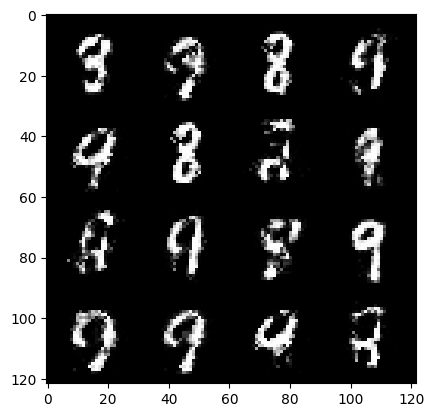

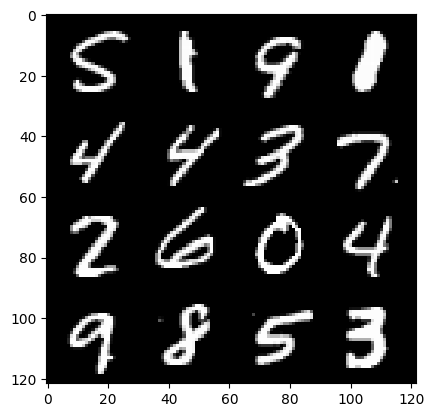

62: step 29100 / Gen loss: 4.062679204940794 / disc_loss: 0.11763100303709507


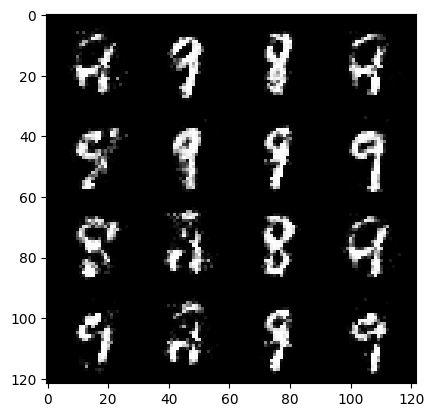

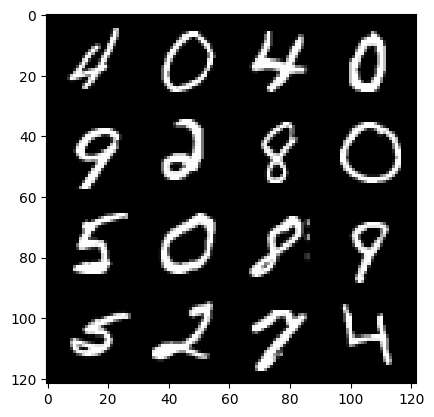

62: step 29400 / Gen loss: 4.063081003030138 / disc_loss: 0.09812086544930937


  0%|          | 0/469 [00:00<?, ?it/s]

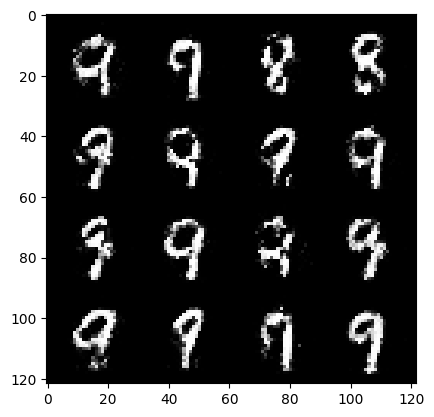

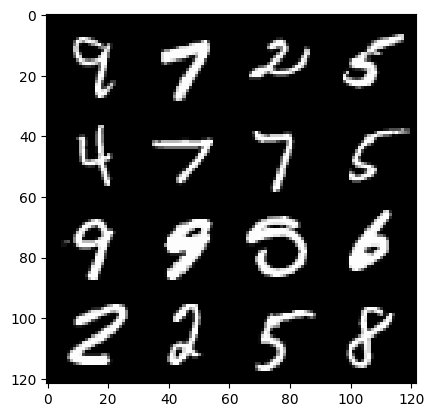

63: step 29700 / Gen loss: 4.06702046394348 / disc_loss: 0.10184845442573226


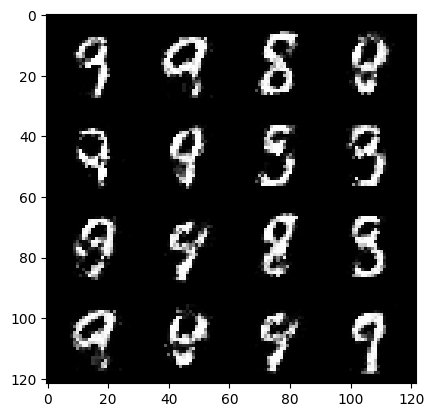

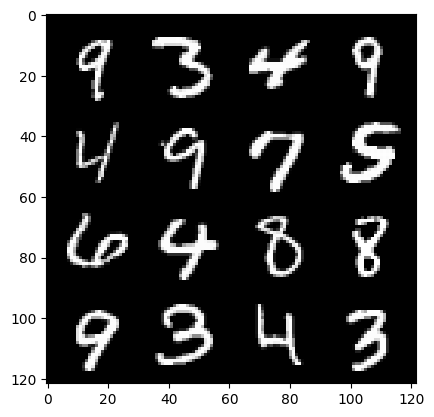

63: step 30000 / Gen loss: 4.090545460383094 / disc_loss: 0.09536655309299628


  0%|          | 0/469 [00:00<?, ?it/s]

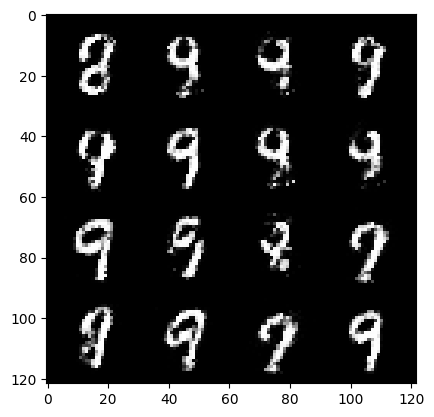

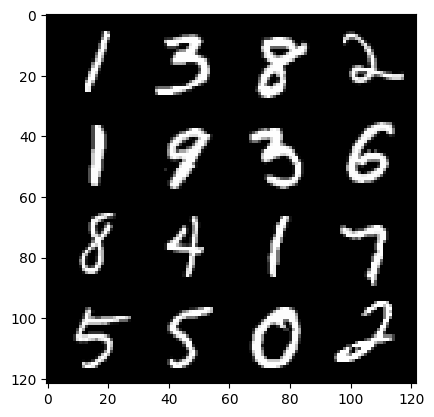

64: step 30300 / Gen loss: 4.080535668532055 / disc_loss: 0.10662905784944691


  0%|          | 0/469 [00:00<?, ?it/s]

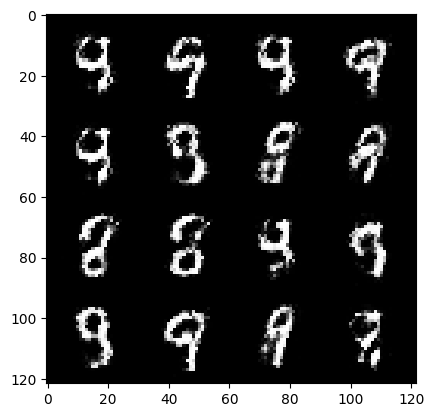

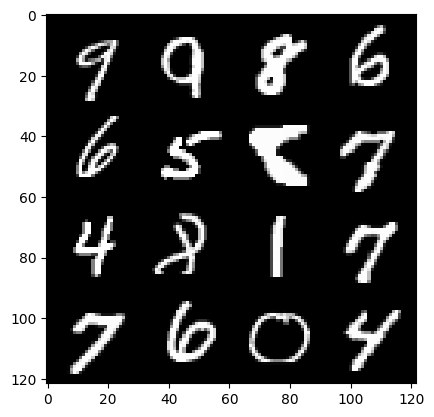

65: step 30600 / Gen loss: 3.933907656669615 / disc_loss: 0.10535051026692005


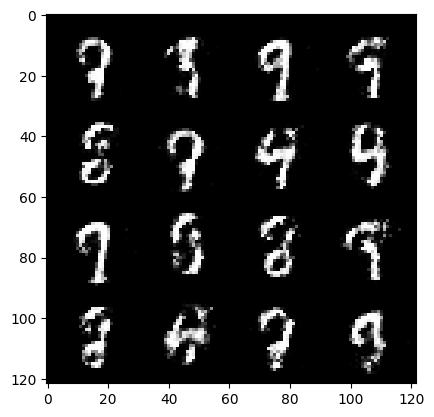

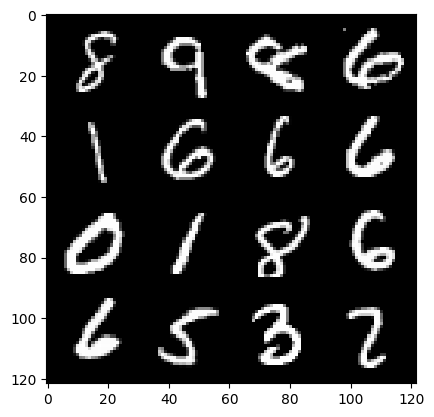

65: step 30900 / Gen loss: 3.9114987699190777 / disc_loss: 0.11262166583289696


  0%|          | 0/469 [00:00<?, ?it/s]

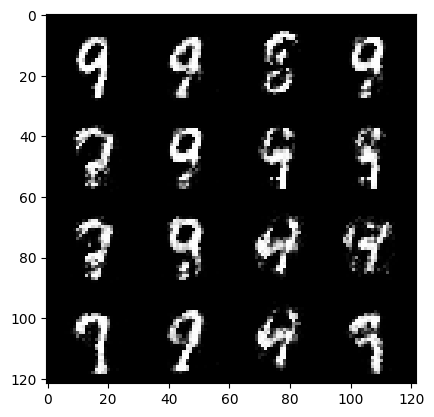

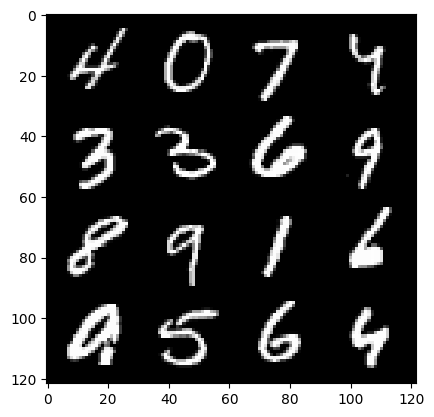

66: step 31200 / Gen loss: 3.800657893021903 / disc_loss: 0.10947347000241277


  0%|          | 0/469 [00:00<?, ?it/s]

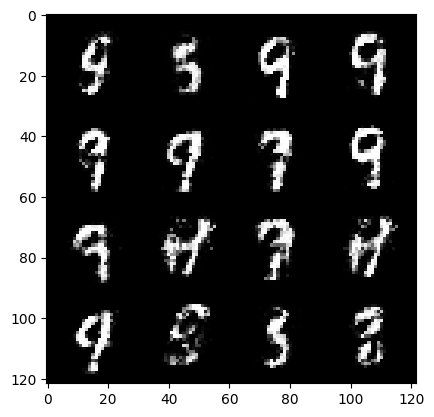

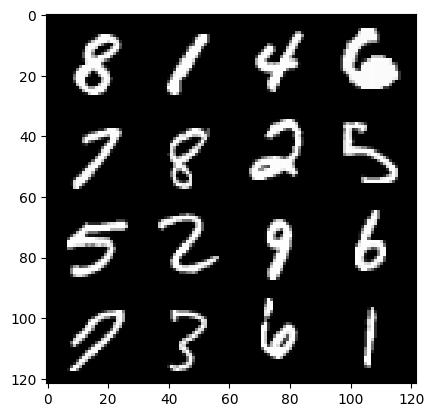

67: step 31500 / Gen loss: 3.9473232952753725 / disc_loss: 0.11653514980028078


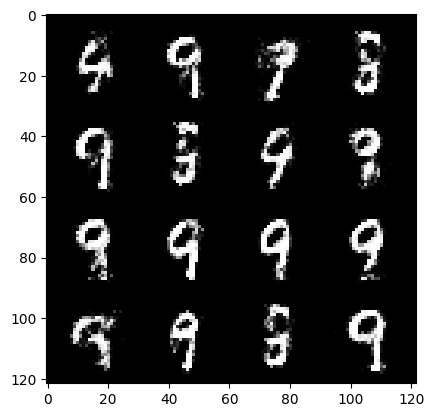

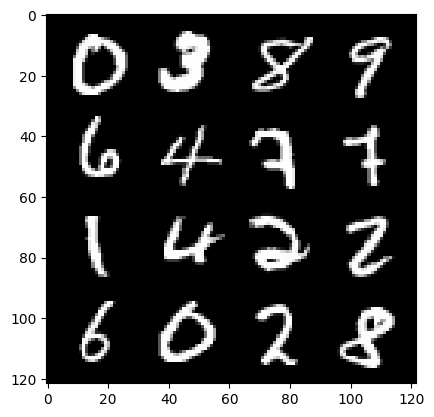

67: step 31800 / Gen loss: 3.777128616174062 / disc_loss: 0.11658102349688612


  0%|          | 0/469 [00:00<?, ?it/s]

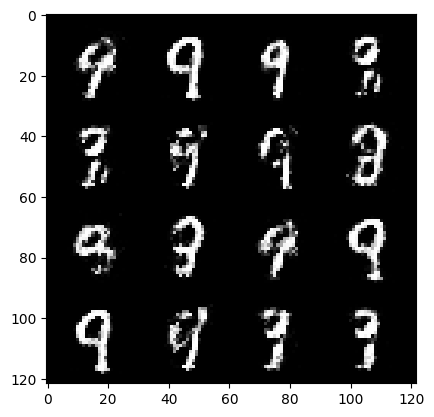

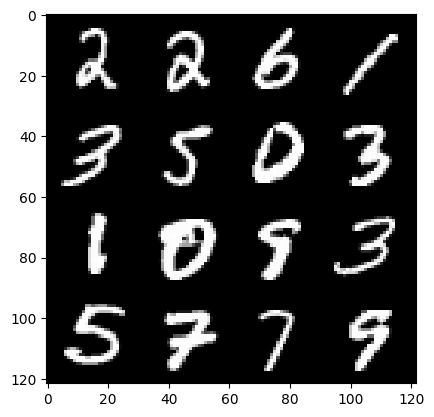

68: step 32100 / Gen loss: 3.762309369246167 / disc_loss: 0.12630788819243505


  0%|          | 0/469 [00:00<?, ?it/s]

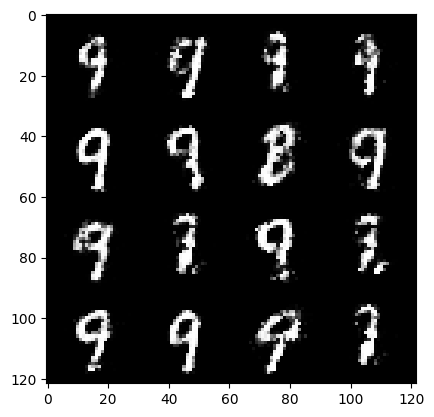

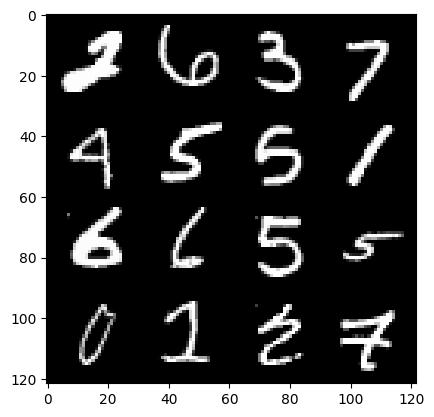

69: step 32400 / Gen loss: 3.6587346275647485 / disc_loss: 0.13637498884151386


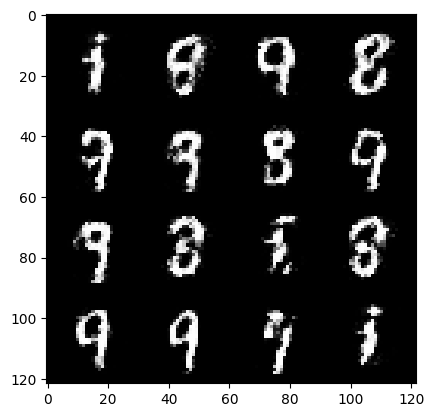

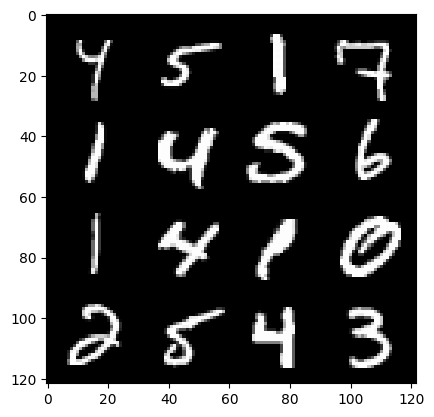

69: step 32700 / Gen loss: 3.5973509478569023 / disc_loss: 0.13172303725033985


  0%|          | 0/469 [00:00<?, ?it/s]

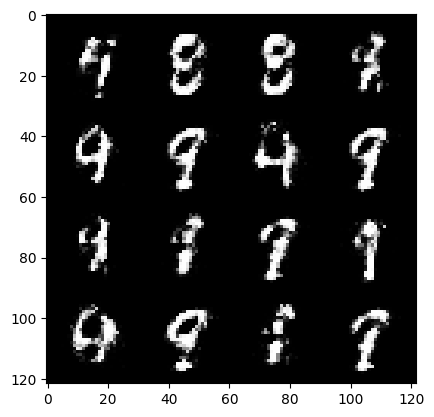

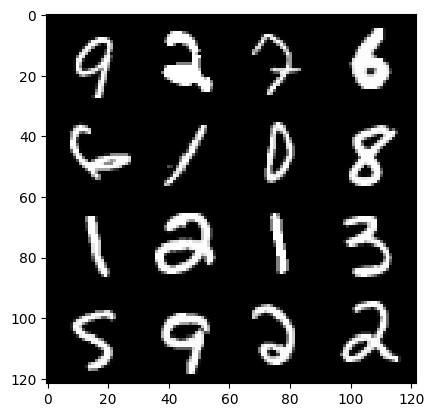

70: step 33000 / Gen loss: 3.655361615816753 / disc_loss: 0.13323194754620396


  0%|          | 0/469 [00:00<?, ?it/s]

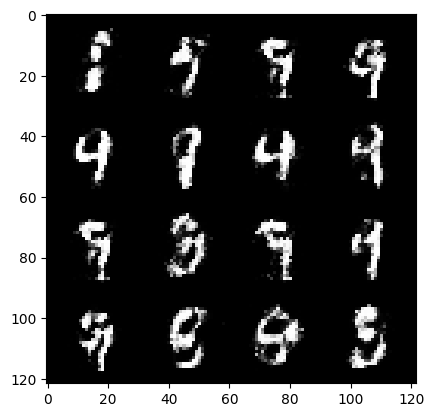

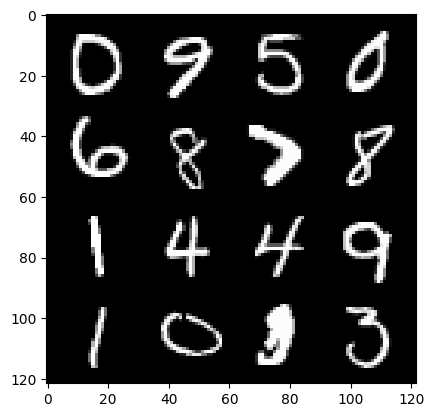

71: step 33300 / Gen loss: 3.861436353524527 / disc_loss: 0.11419040850053233


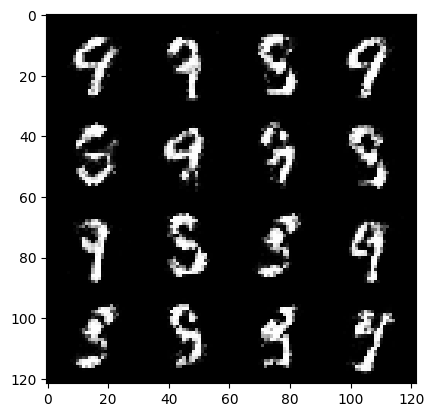

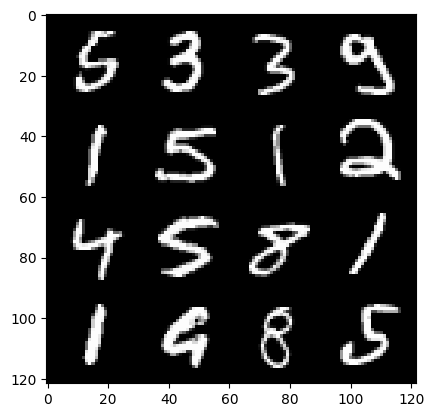

71: step 33600 / Gen loss: 3.724185492992402 / disc_loss: 0.11265028987079855


  0%|          | 0/469 [00:00<?, ?it/s]

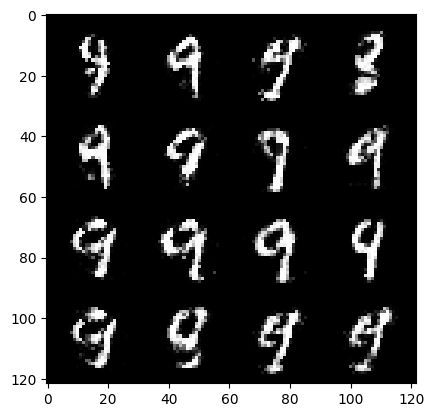

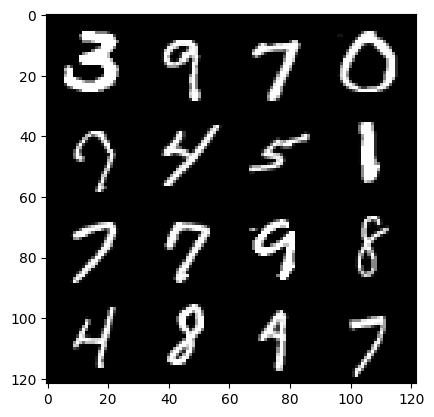

72: step 33900 / Gen loss: 3.654836851755777 / disc_loss: 0.12501265987753873


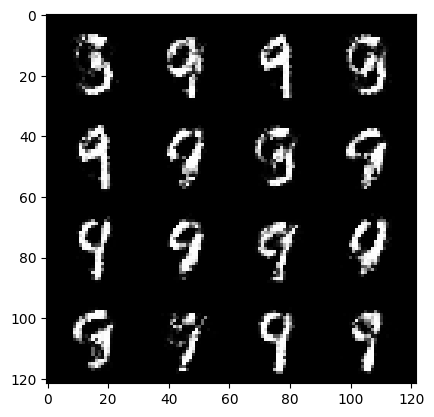

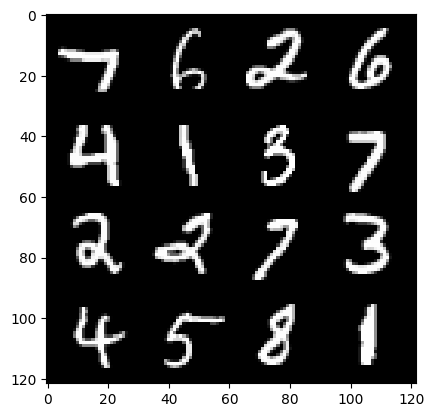

72: step 34200 / Gen loss: 3.7083611122767146 / disc_loss: 0.12417886169006431


  0%|          | 0/469 [00:00<?, ?it/s]

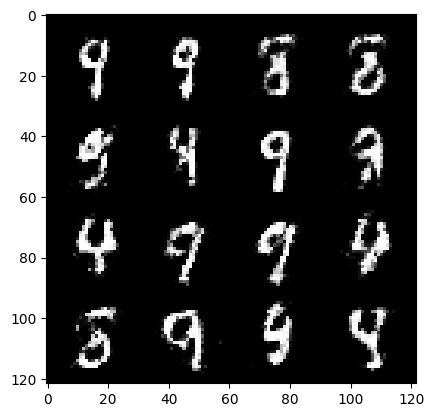

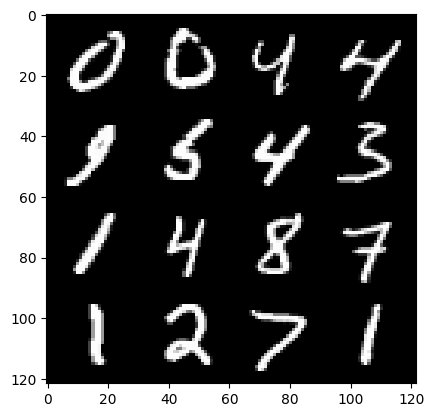

73: step 34500 / Gen loss: 3.735543408393859 / disc_loss: 0.1317063440382481


  0%|          | 0/469 [00:00<?, ?it/s]

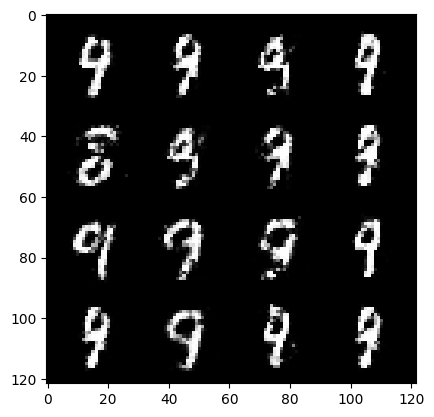

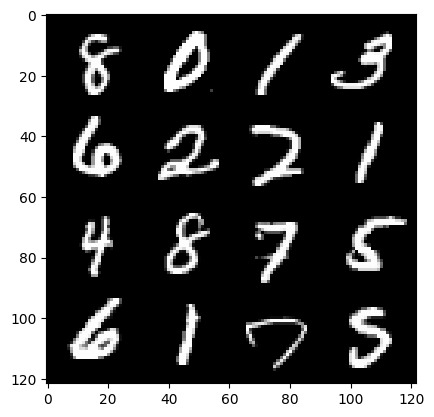

74: step 34800 / Gen loss: 3.545863853295647 / disc_loss: 0.13469638317823412


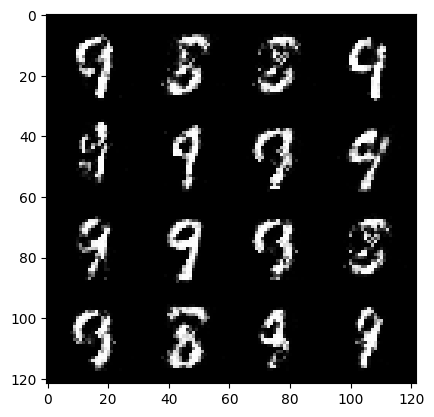

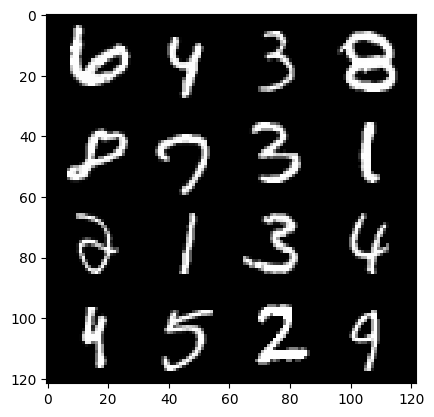

74: step 35100 / Gen loss: 3.6041963791847227 / disc_loss: 0.13192848155895864


  0%|          | 0/469 [00:00<?, ?it/s]

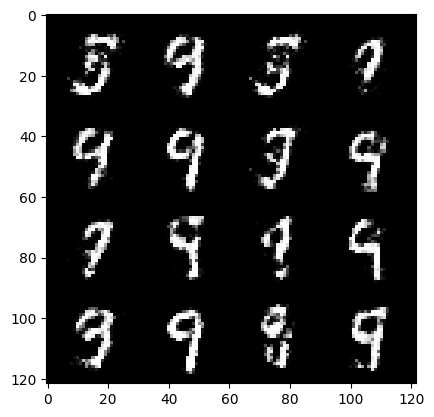

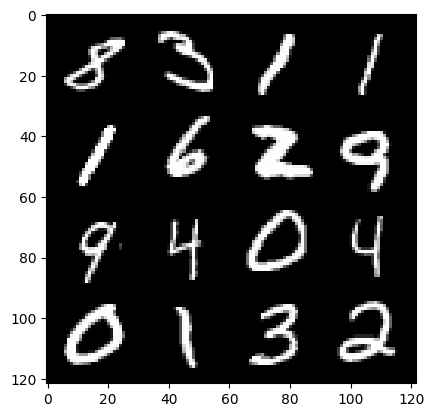

75: step 35400 / Gen loss: 3.438738491535189 / disc_loss: 0.13687766397992768


  0%|          | 0/469 [00:00<?, ?it/s]

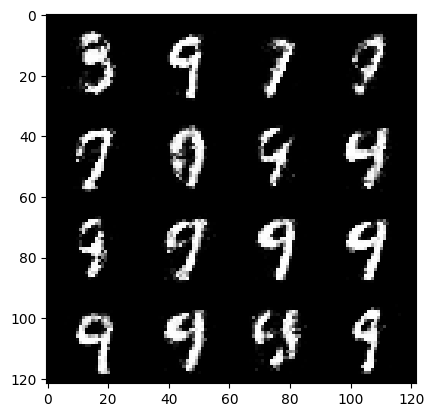

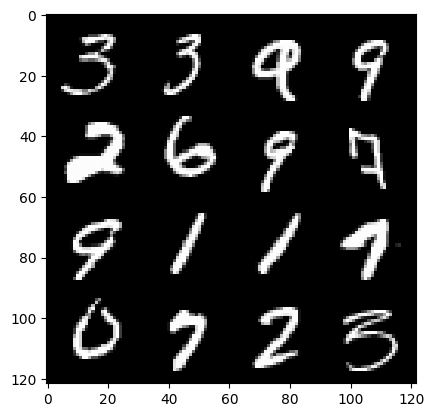

76: step 35700 / Gen loss: 3.5512568434079497 / disc_loss: 0.13314862402776867


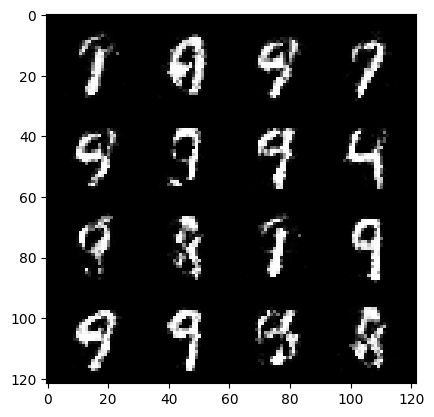

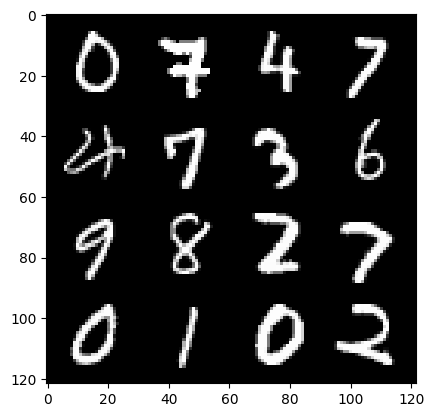

76: step 36000 / Gen loss: 3.4740211129188534 / disc_loss: 0.1449665676057339


  0%|          | 0/469 [00:00<?, ?it/s]

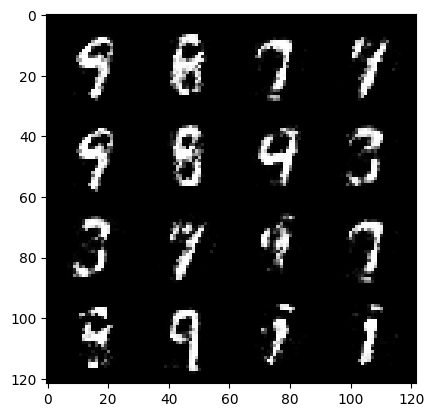

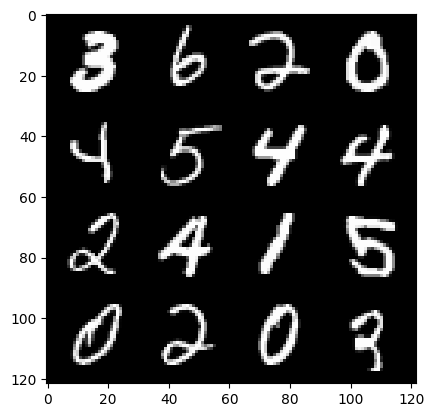

77: step 36300 / Gen loss: 3.3835110362370804 / disc_loss: 0.13929207039376107


  0%|          | 0/469 [00:00<?, ?it/s]

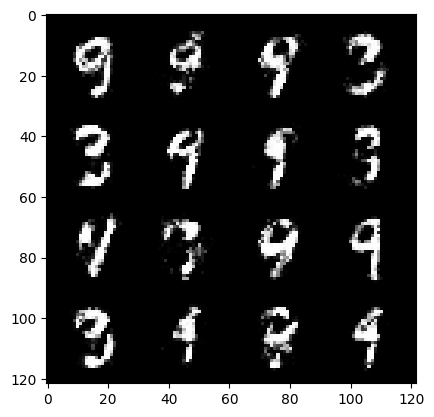

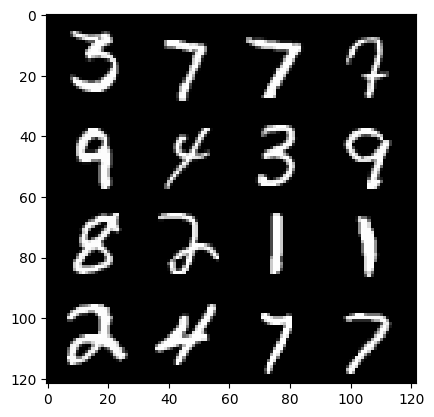

78: step 36600 / Gen loss: 3.5442485491434734 / disc_loss: 0.13961444694548847


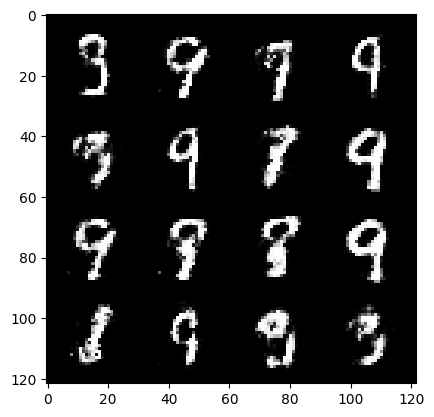

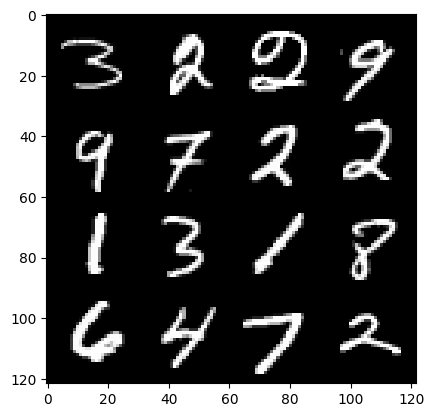

78: step 36900 / Gen loss: 3.405926997661591 / disc_loss: 0.14766094552973894


  0%|          | 0/469 [00:00<?, ?it/s]

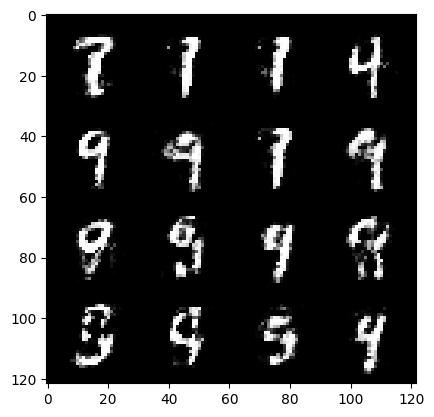

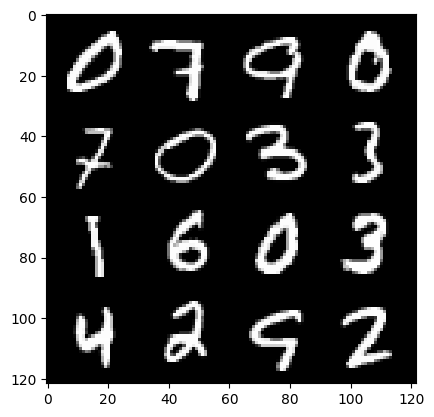

79: step 37200 / Gen loss: 3.1283988165855408 / disc_loss: 0.1847794310500223


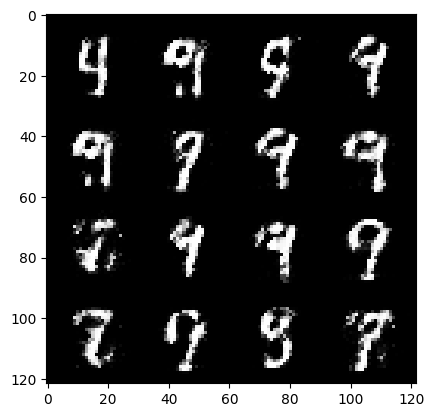

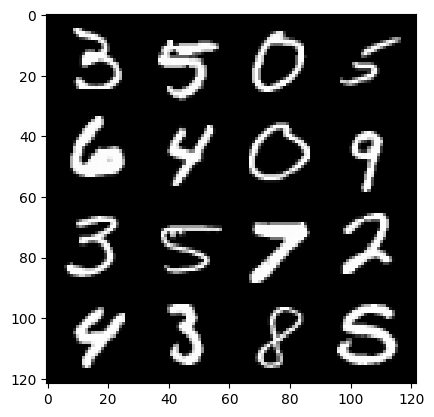

79: step 37500 / Gen loss: 3.197220536867778 / disc_loss: 0.15883696995675556


  0%|          | 0/469 [00:00<?, ?it/s]

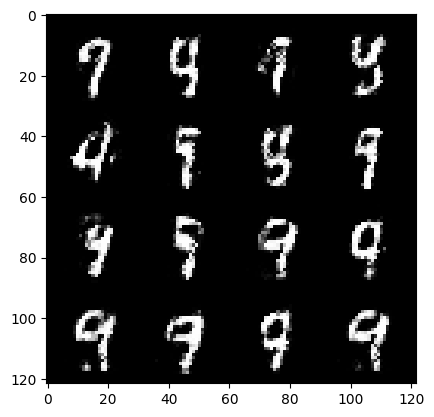

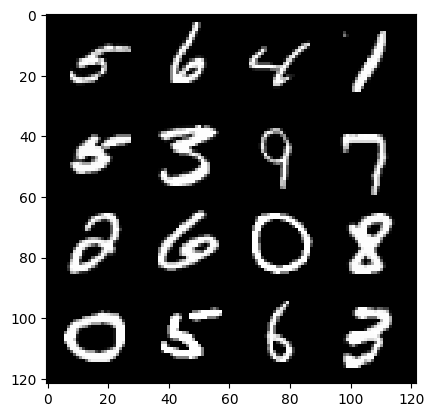

80: step 37800 / Gen loss: 3.4146002165476483 / disc_loss: 0.1301704949264725


  0%|          | 0/469 [00:00<?, ?it/s]

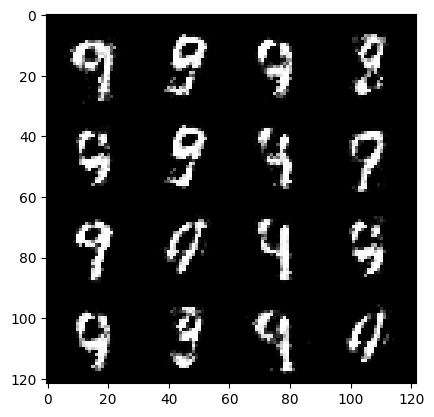

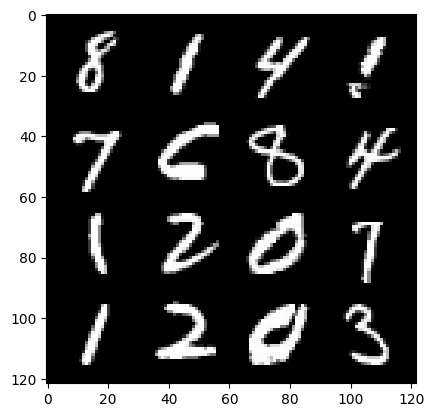

81: step 38100 / Gen loss: 3.4356400148073845 / disc_loss: 0.13995772674679752


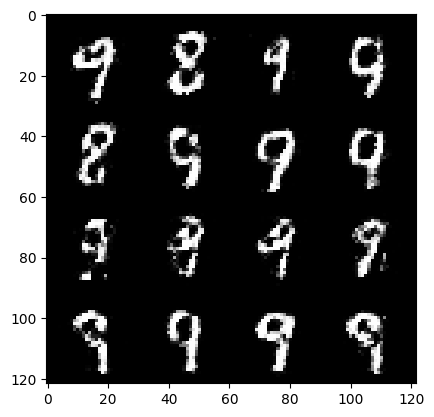

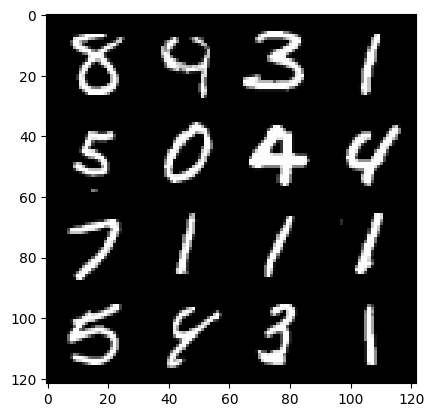

81: step 38400 / Gen loss: 3.3645483811696377 / disc_loss: 0.1406037619958321


  0%|          | 0/469 [00:00<?, ?it/s]

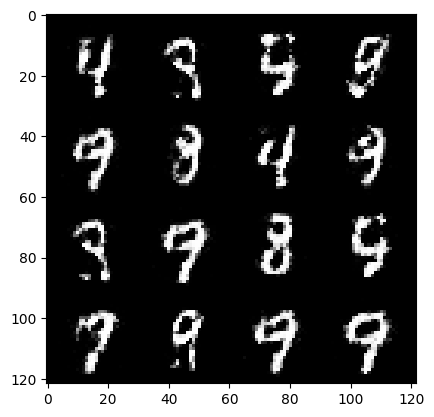

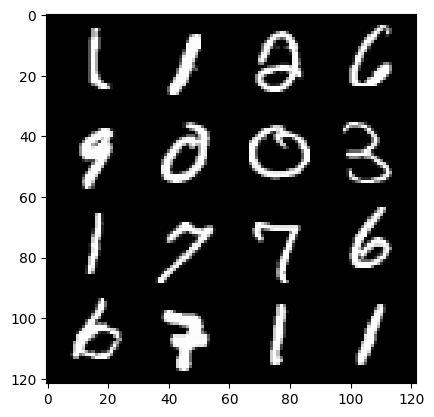

82: step 38700 / Gen loss: 3.382086660861968 / disc_loss: 0.13866209495812648


  0%|          | 0/469 [00:00<?, ?it/s]

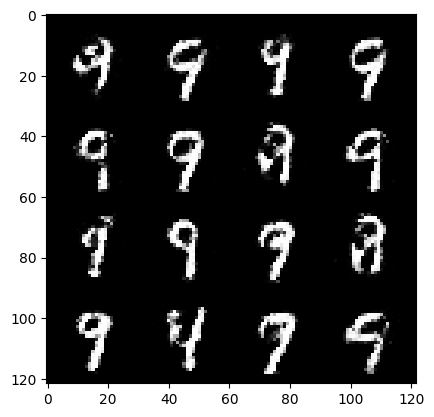

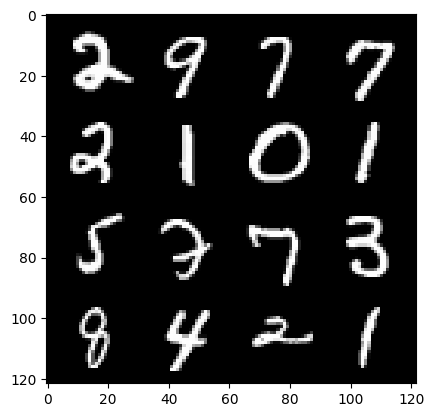

83: step 39000 / Gen loss: 3.3074662272135398 / disc_loss: 0.1509456666186451


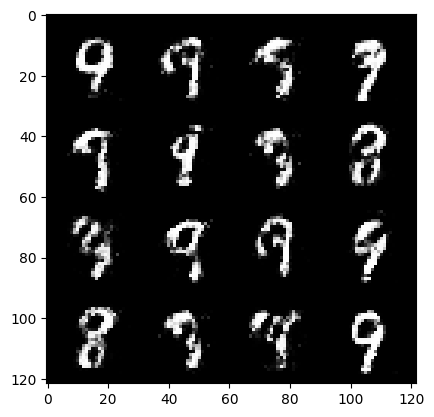

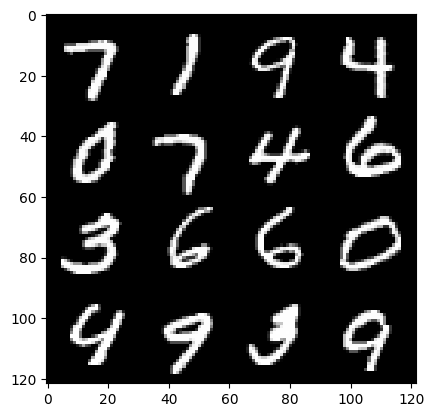

83: step 39300 / Gen loss: 3.271660556793213 / disc_loss: 0.16572073837121318


  0%|          | 0/469 [00:00<?, ?it/s]

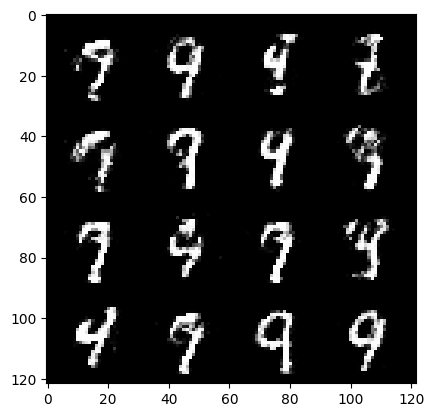

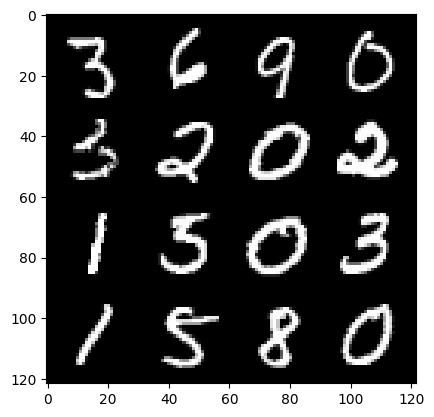

84: step 39600 / Gen loss: 3.1453630026181547 / disc_loss: 0.1646511336664358


  0%|          | 0/469 [00:00<?, ?it/s]

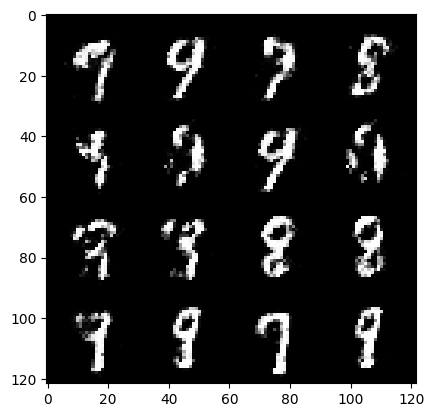

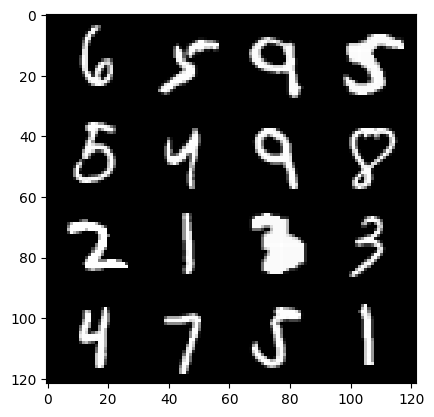

85: step 39900 / Gen loss: 3.244052352110544 / disc_loss: 0.14523103235910342


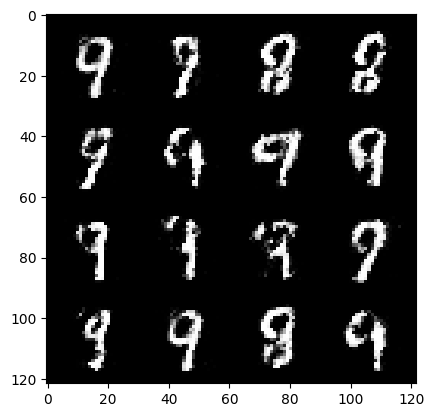

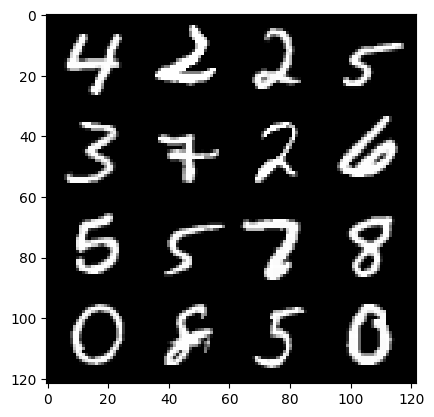

85: step 40200 / Gen loss: 3.302715690135954 / disc_loss: 0.13379785500466818


  0%|          | 0/469 [00:00<?, ?it/s]

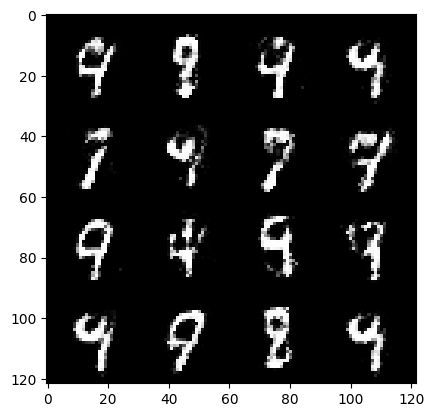

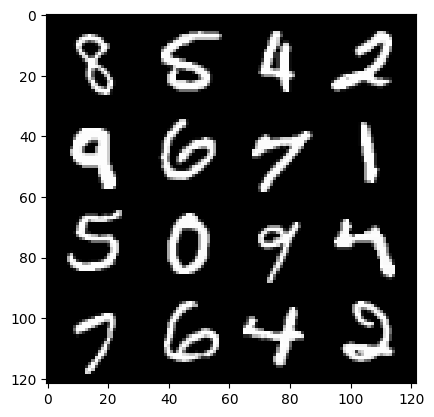

86: step 40500 / Gen loss: 3.179586557547255 / disc_loss: 0.16347322031855582


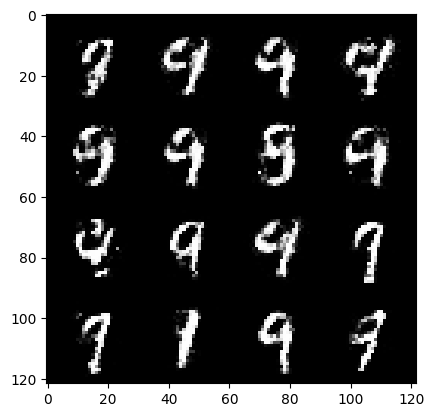

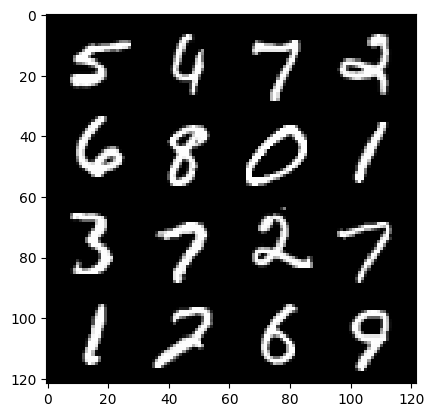

86: step 40800 / Gen loss: 3.1266244522730524 / disc_loss: 0.16156698505083708


  0%|          | 0/469 [00:00<?, ?it/s]

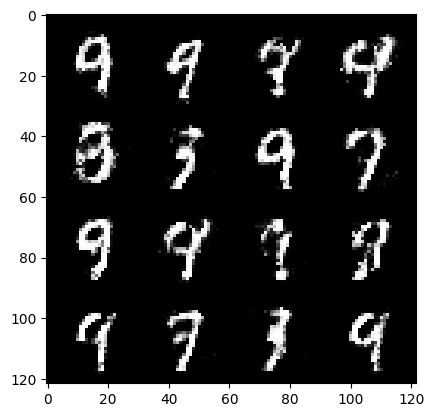

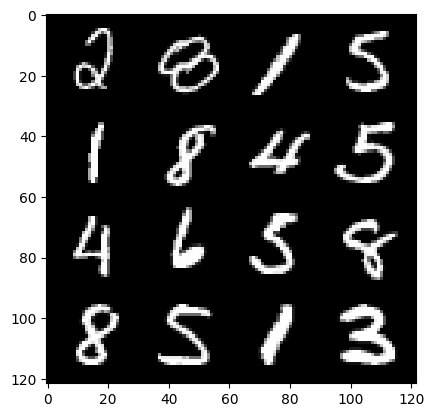

87: step 41100 / Gen loss: 3.1074164946873966 / disc_loss: 0.1554720383385819


  0%|          | 0/469 [00:00<?, ?it/s]

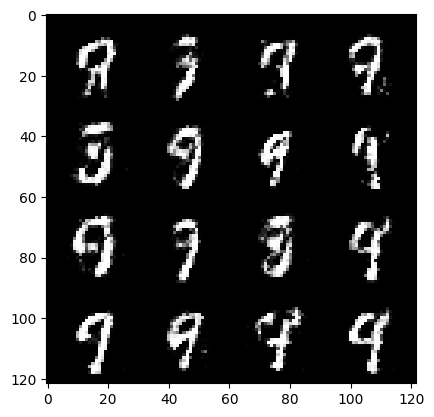

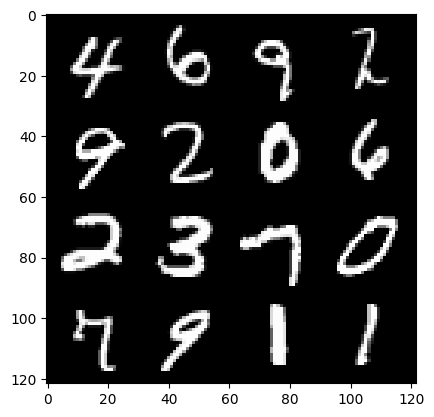

88: step 41400 / Gen loss: 3.1810984722773243 / disc_loss: 0.15830699354410166


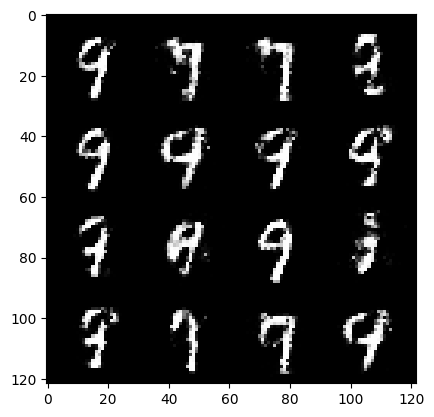

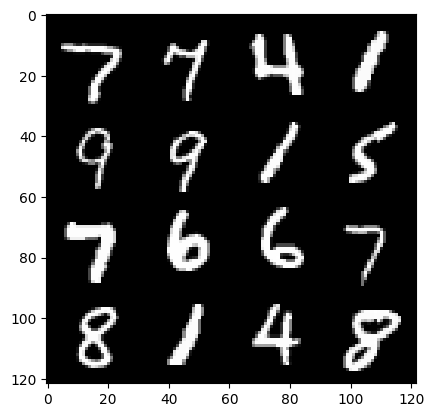

88: step 41700 / Gen loss: 3.0956467247009276 / disc_loss: 0.16452015062173217


  0%|          | 0/469 [00:00<?, ?it/s]

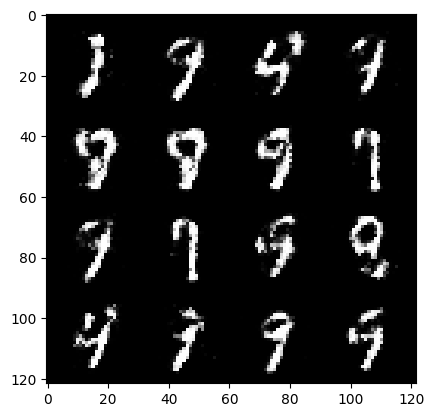

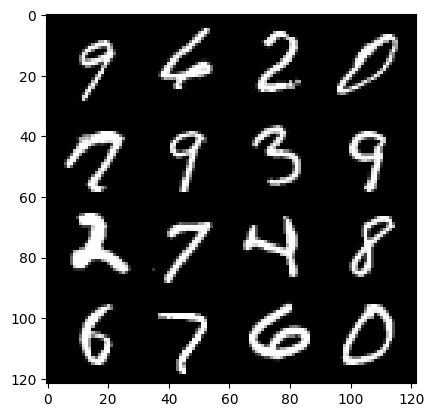

89: step 42000 / Gen loss: 3.1425677243868524 / disc_loss: 0.16781398678819343


  0%|          | 0/469 [00:00<?, ?it/s]

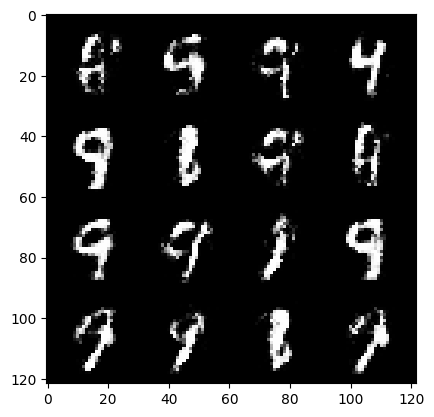

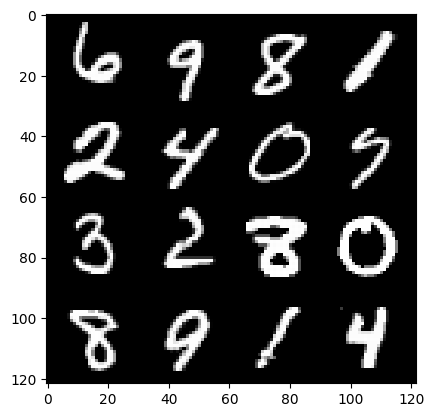

90: step 42300 / Gen loss: 2.9313357925415042 / disc_loss: 0.18703473779062435


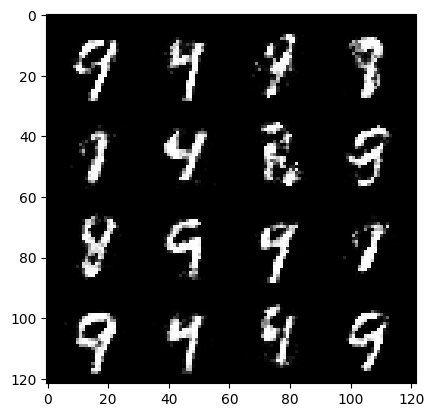

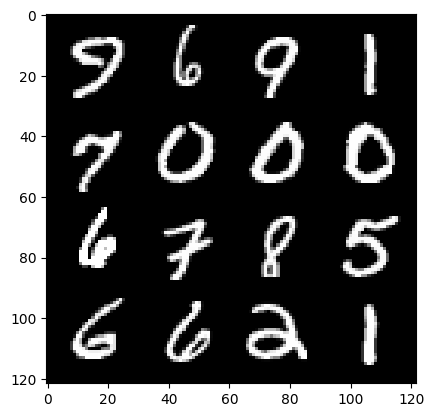

90: step 42600 / Gen loss: 3.028474357922875 / disc_loss: 0.17423209798832728


  0%|          | 0/469 [00:00<?, ?it/s]

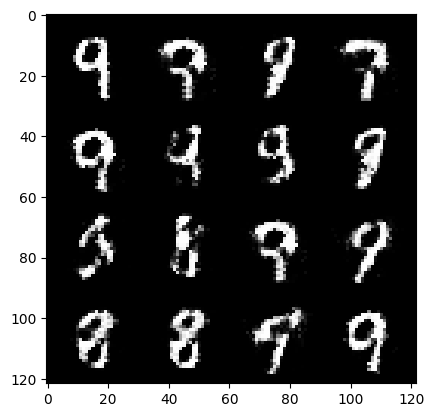

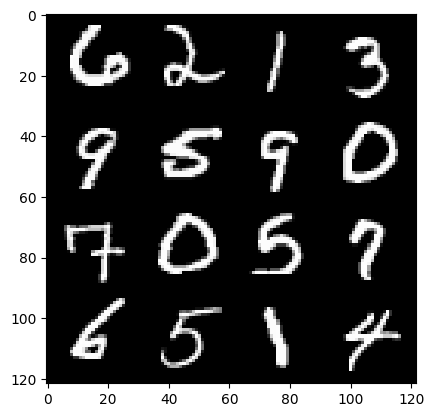

91: step 42900 / Gen loss: 3.0862317125002554 / disc_loss: 0.1715476952741543


  0%|          | 0/469 [00:00<?, ?it/s]

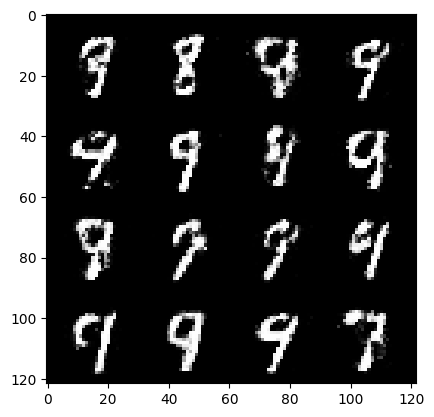

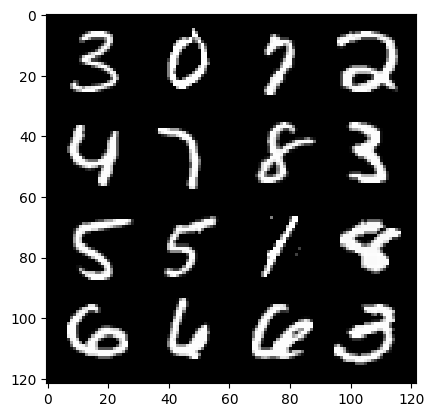

92: step 43200 / Gen loss: 2.984241803487144 / disc_loss: 0.1706204093247652


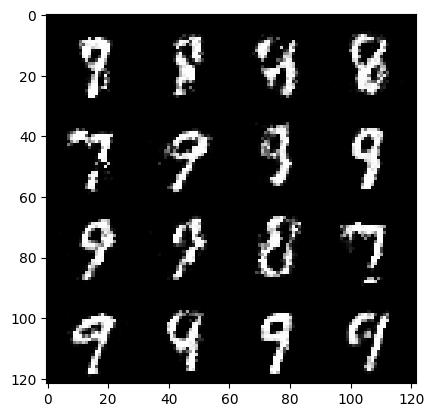

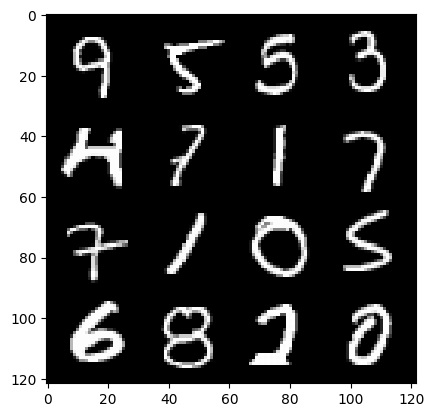

92: step 43500 / Gen loss: 2.964953672885895 / disc_loss: 0.17303196442623928


  0%|          | 0/469 [00:00<?, ?it/s]

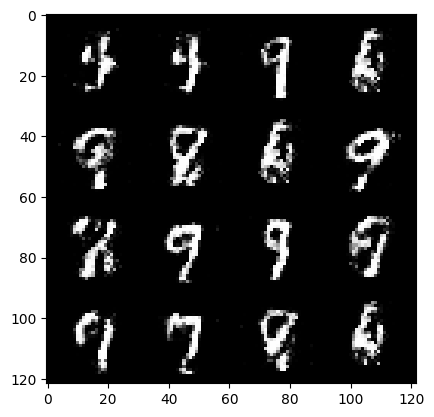

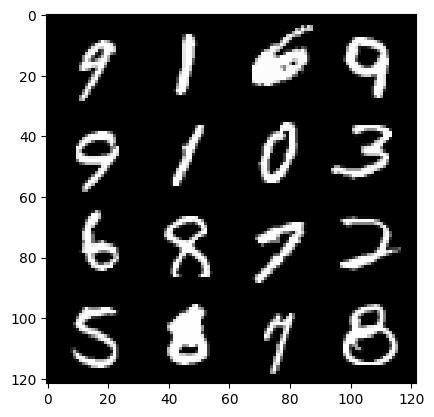

93: step 43800 / Gen loss: 3.1291784024238583 / disc_loss: 0.15533027919630213


  0%|          | 0/469 [00:00<?, ?it/s]

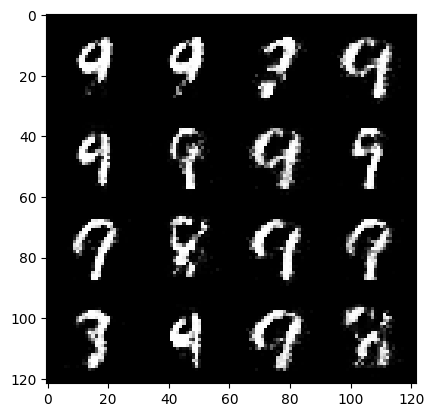

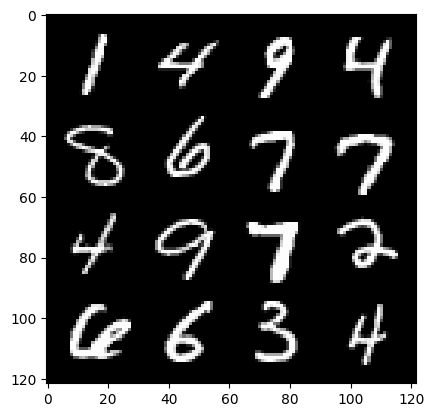

94: step 44100 / Gen loss: 3.0373610663413997 / disc_loss: 0.17743843662242087


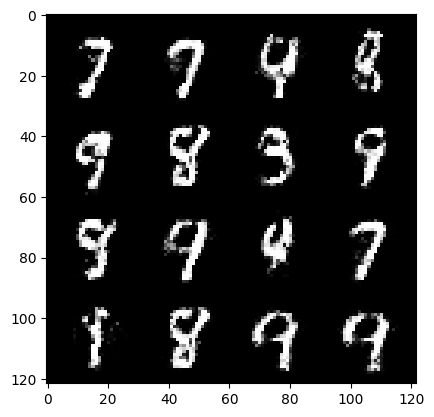

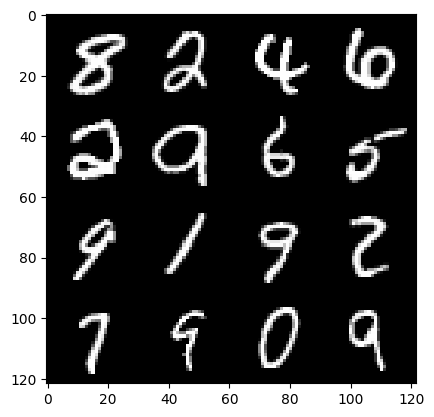

94: step 44400 / Gen loss: 2.939062492847441 / disc_loss: 0.18681100755929927


  0%|          | 0/469 [00:00<?, ?it/s]

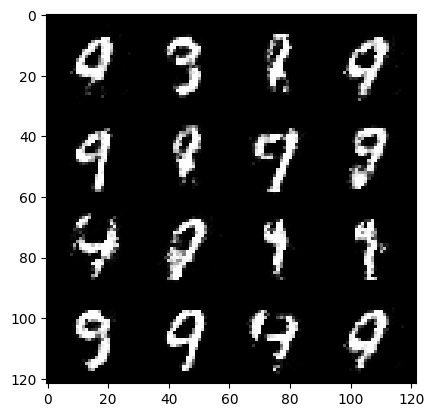

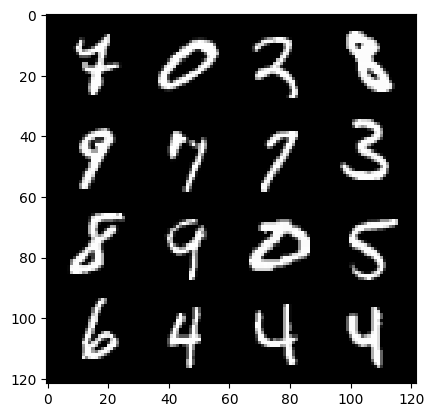

95: step 44700 / Gen loss: 2.9138729206720964 / disc_loss: 0.19072607768078645


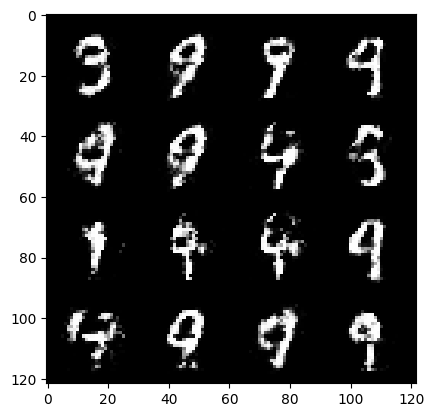

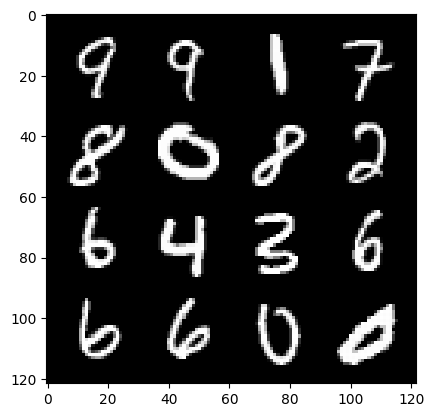

95: step 45000 / Gen loss: 2.876229359308878 / disc_loss: 0.19118478688100976


  0%|          | 0/469 [00:00<?, ?it/s]

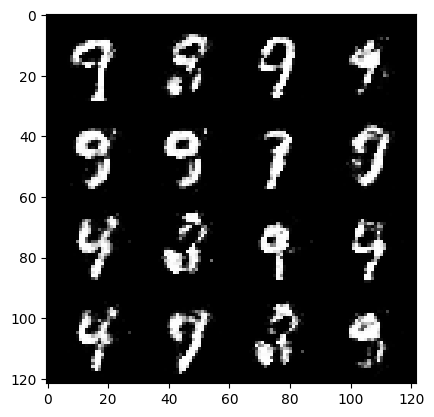

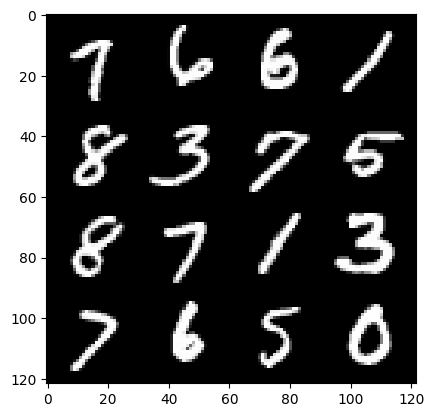

96: step 45300 / Gen loss: 2.8951595878601073 / disc_loss: 0.17616605761150514


  0%|          | 0/469 [00:00<?, ?it/s]

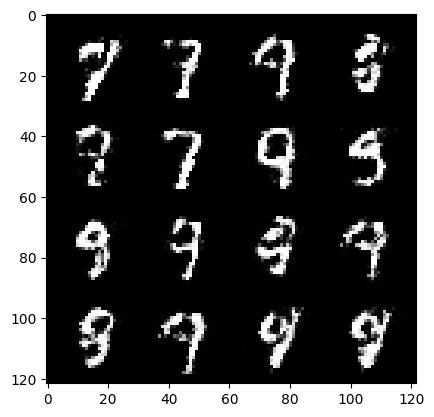

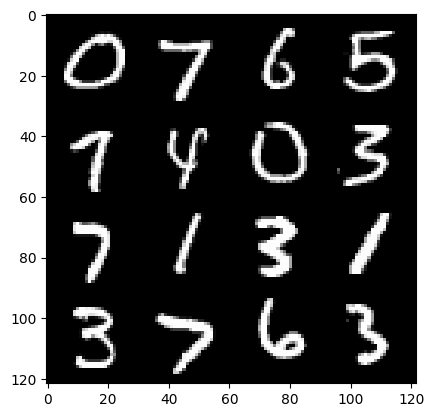

97: step 45600 / Gen loss: 2.987703441778818 / disc_loss: 0.16066578517357502


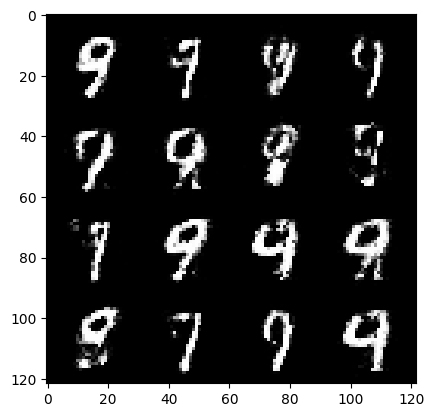

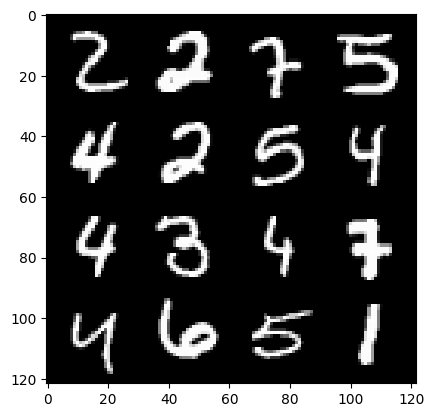

97: step 45900 / Gen loss: 3.0057289369901 / disc_loss: 0.1665533083677292


  0%|          | 0/469 [00:00<?, ?it/s]

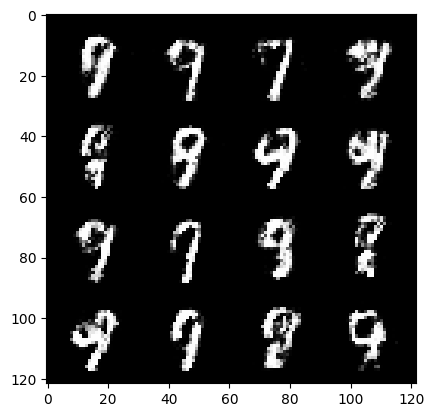

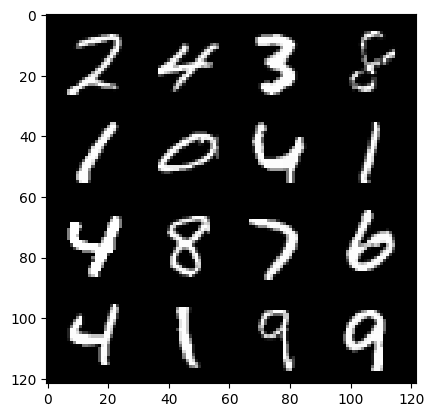

98: step 46200 / Gen loss: 2.8628056192398077 / disc_loss: 0.18353347460428887


  0%|          | 0/469 [00:00<?, ?it/s]

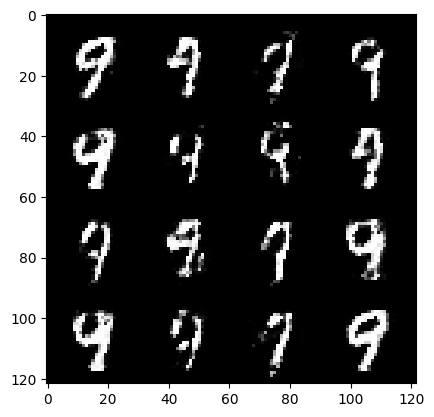

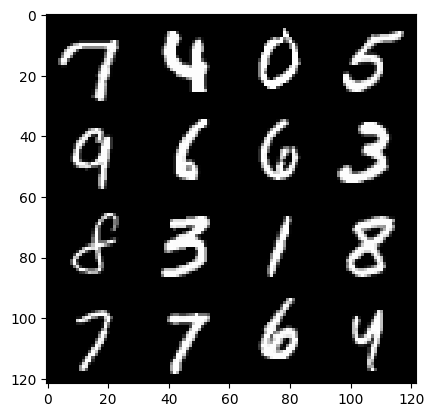

99: step 46500 / Gen loss: 2.857620436350505 / disc_loss: 0.18225741068522142


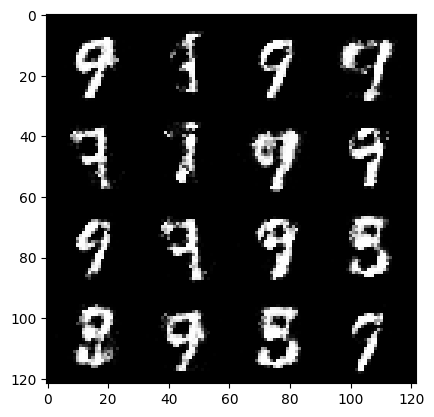

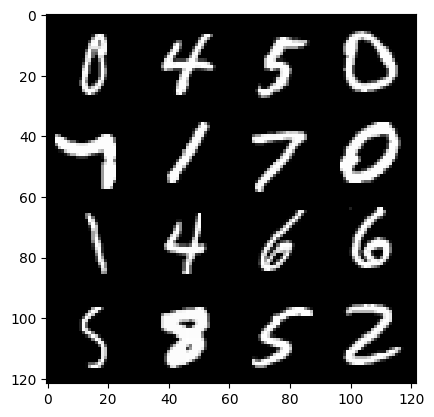

99: step 46800 / Gen loss: 2.8419890705744457 / disc_loss: 0.18470417998731145


  0%|          | 0/469 [00:00<?, ?it/s]

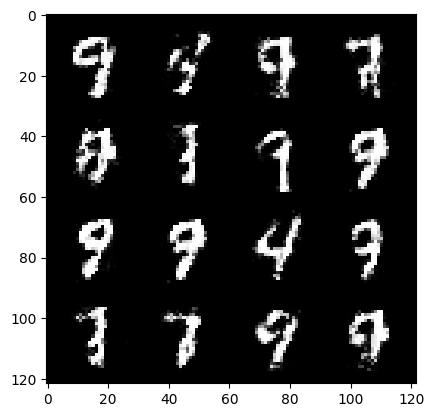

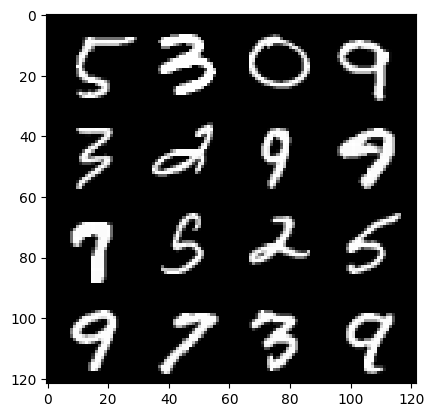

100: step 47100 / Gen loss: 2.8474773224194836 / disc_loss: 0.18629079761604467


  0%|          | 0/469 [00:00<?, ?it/s]

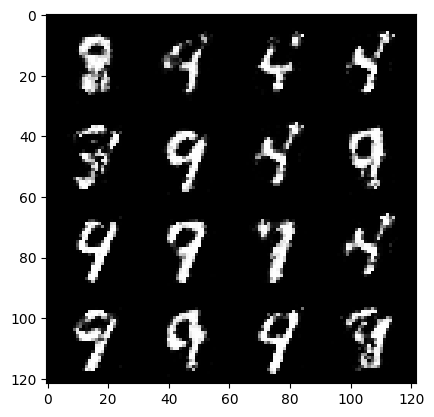

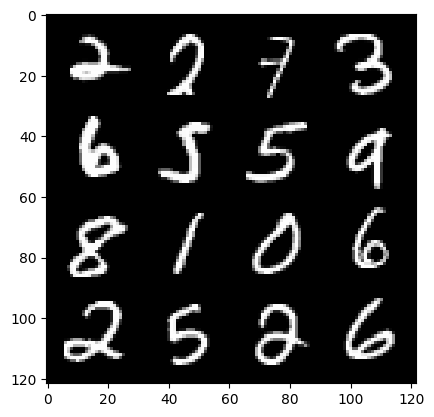

101: step 47400 / Gen loss: 2.9214733997980753 / disc_loss: 0.1778981158385674


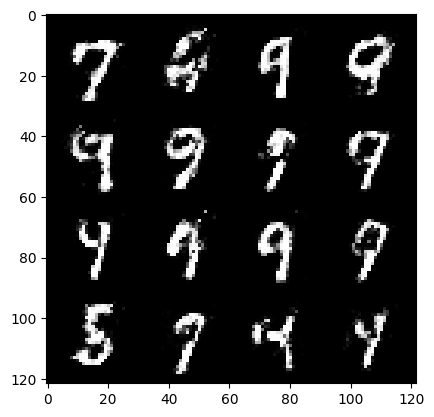

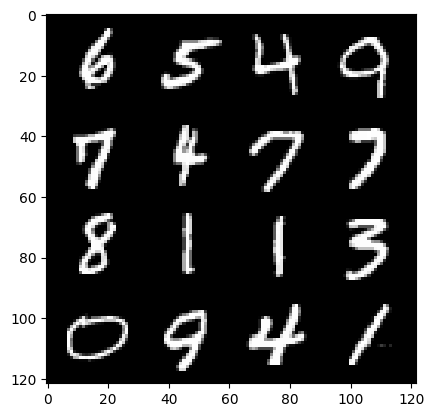

101: step 47700 / Gen loss: 2.7768438474337236 / disc_loss: 0.19538611258069674


  0%|          | 0/469 [00:00<?, ?it/s]

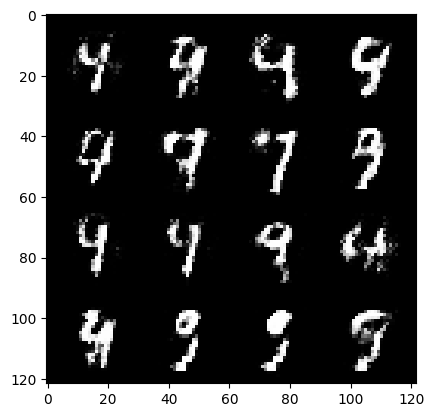

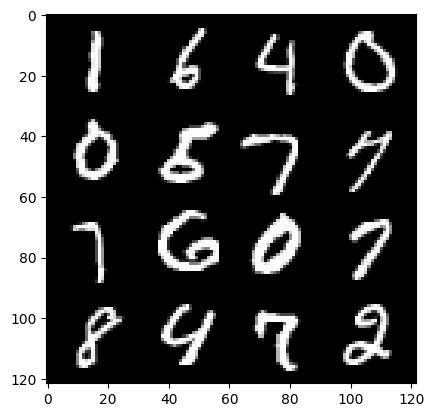

102: step 48000 / Gen loss: 2.8692901738484684 / disc_loss: 0.18279030819733944


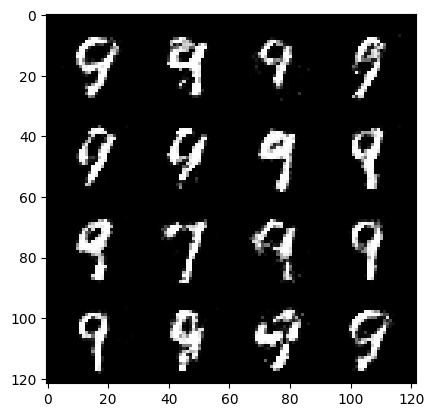

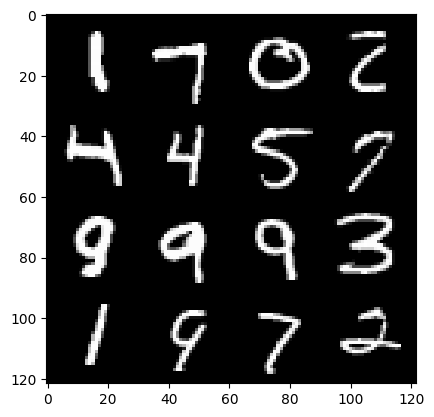

102: step 48300 / Gen loss: 2.955957971413928 / disc_loss: 0.17525259800255288


  0%|          | 0/469 [00:00<?, ?it/s]

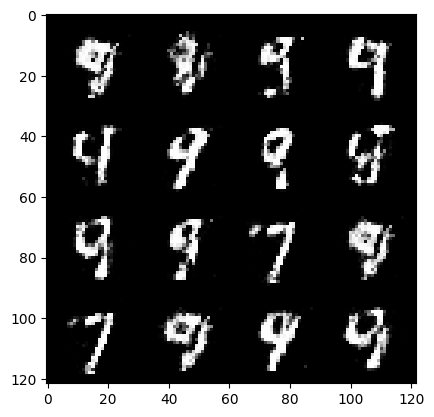

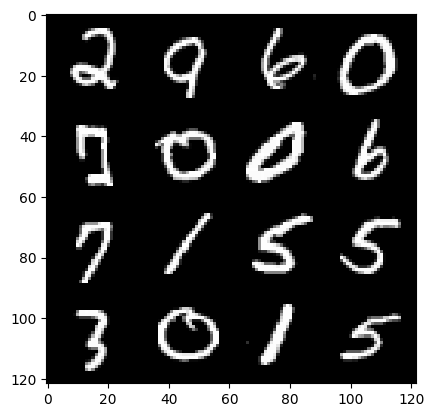

103: step 48600 / Gen loss: 2.8740499933560706 / disc_loss: 0.19007376641035087


  0%|          | 0/469 [00:00<?, ?it/s]

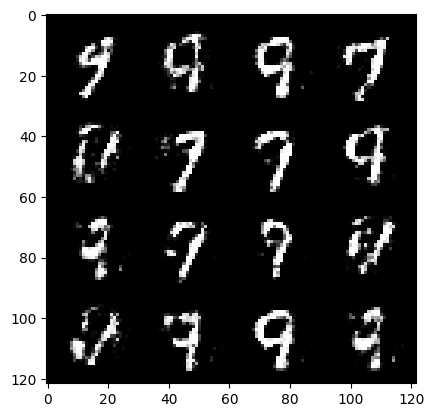

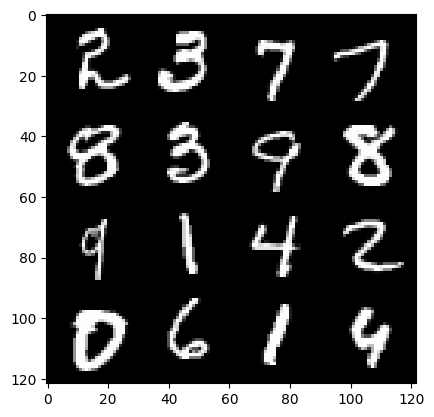

104: step 48900 / Gen loss: 2.7906265608469654 / disc_loss: 0.1891511736065149


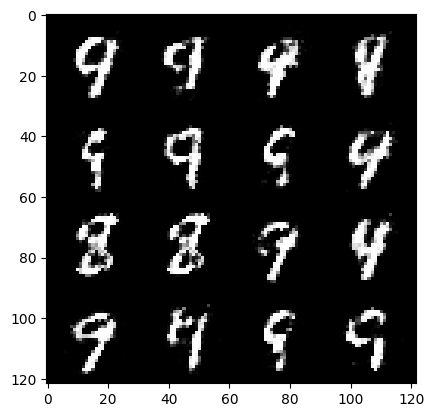

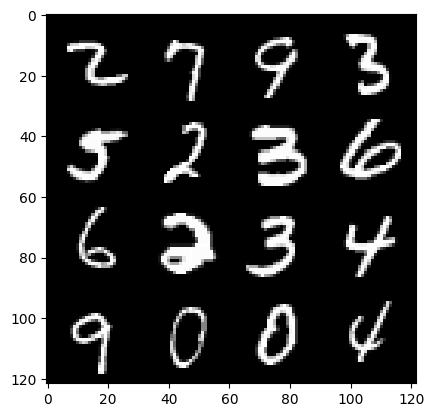

104: step 49200 / Gen loss: 2.7890347774823527 / disc_loss: 0.17849388413131237


  0%|          | 0/469 [00:00<?, ?it/s]

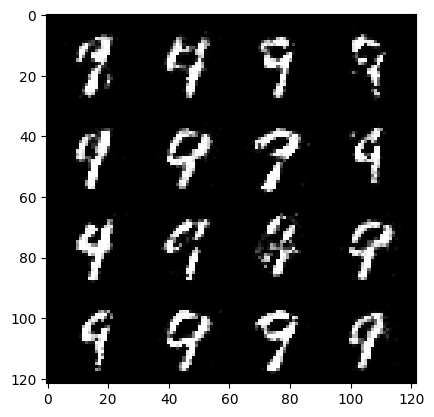

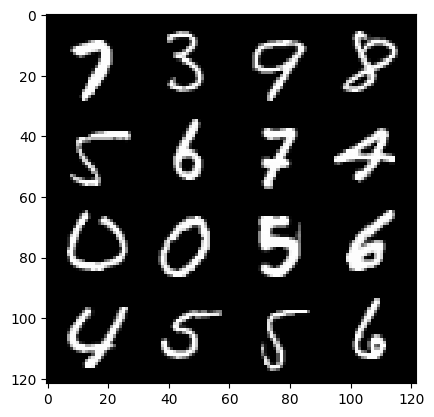

105: step 49500 / Gen loss: 2.891345329284667 / disc_loss: 0.17776523930331087


  0%|          | 0/469 [00:00<?, ?it/s]

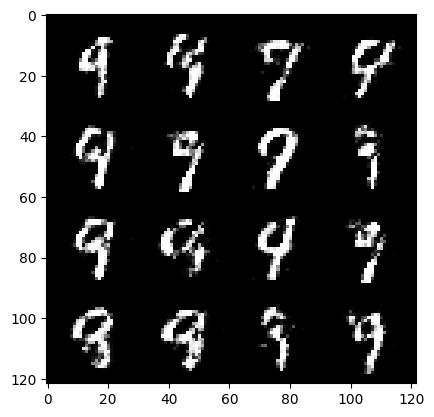

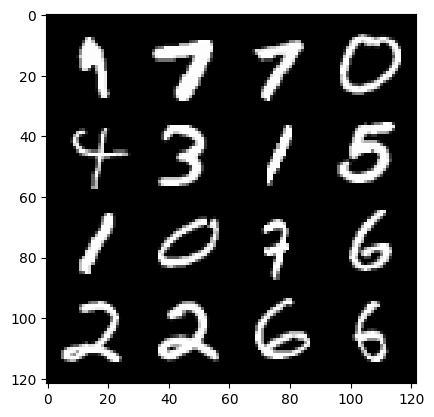

106: step 49800 / Gen loss: 2.8441929777463284 / disc_loss: 0.18897829242050646


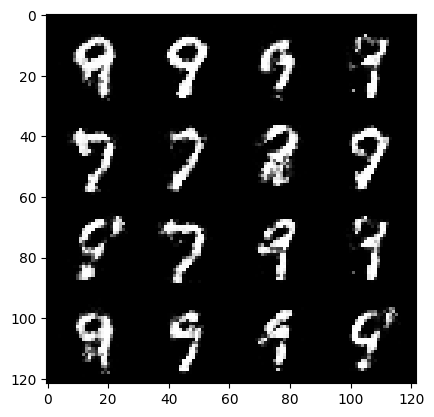

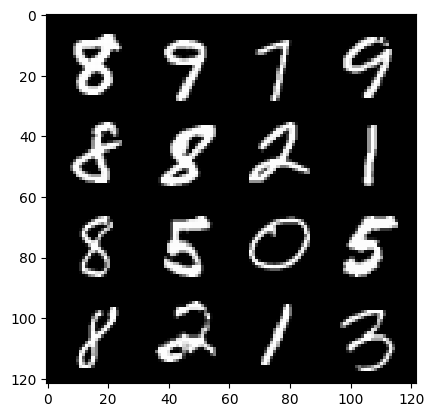

106: step 50100 / Gen loss: 2.7952853075663233 / disc_loss: 0.19619922973215576


  0%|          | 0/469 [00:00<?, ?it/s]

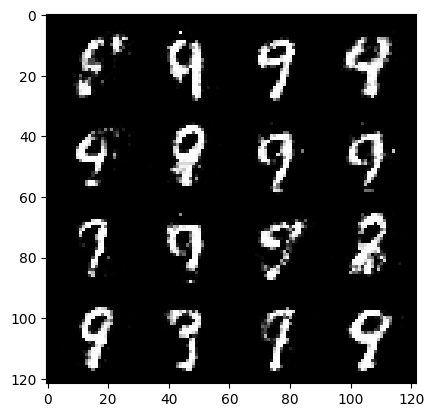

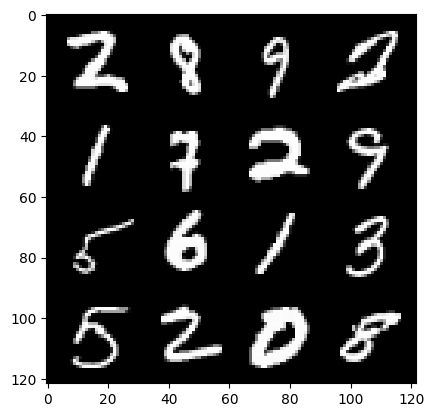

107: step 50400 / Gen loss: 2.7388768808046975 / disc_loss: 0.20017674870789068


  0%|          | 0/469 [00:00<?, ?it/s]

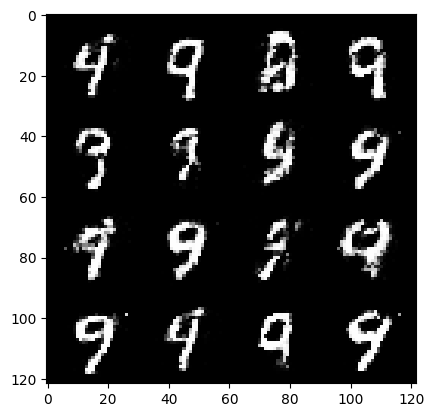

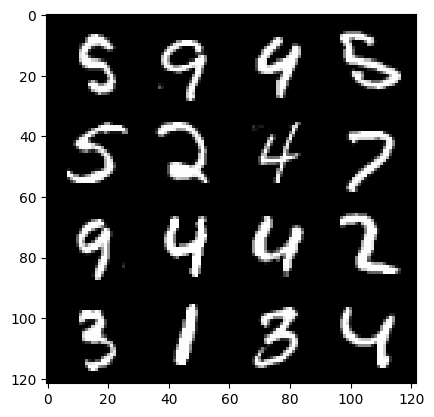

108: step 50700 / Gen loss: 2.794906035264335 / disc_loss: 0.19134450659155827


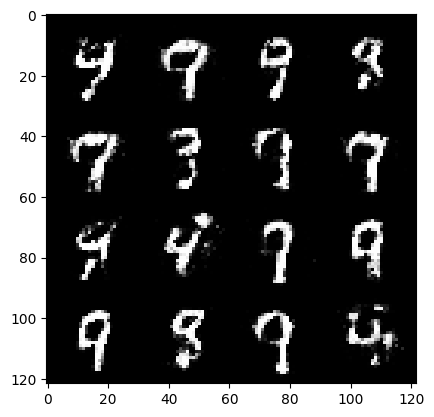

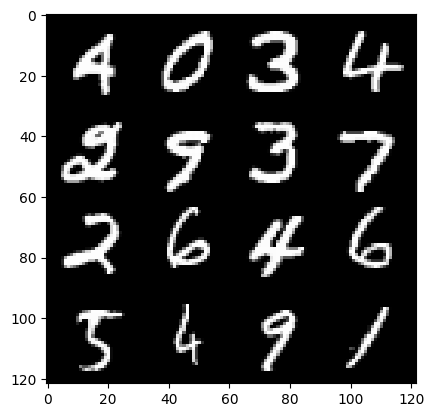

108: step 51000 / Gen loss: 2.7713192598025036 / disc_loss: 0.19661709621548656


  0%|          | 0/469 [00:00<?, ?it/s]

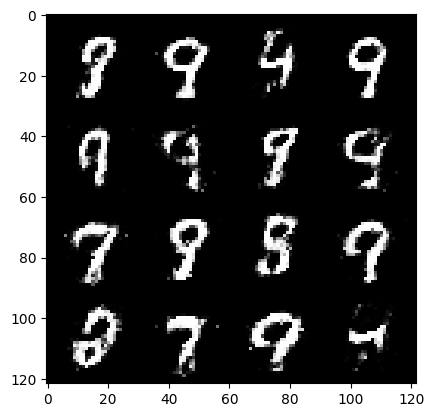

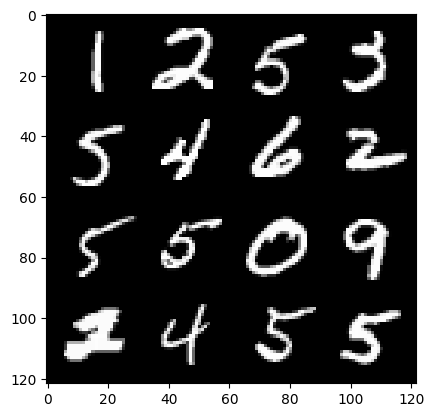

109: step 51300 / Gen loss: 2.7120378899574282 / disc_loss: 0.1980440300454695


  0%|          | 0/469 [00:00<?, ?it/s]

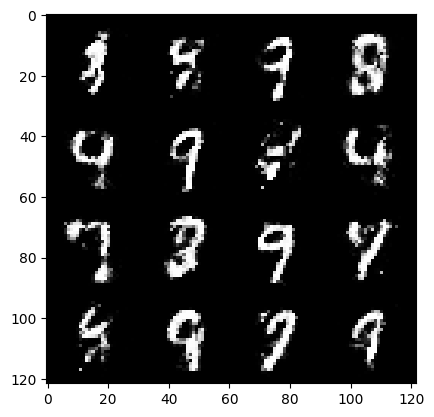

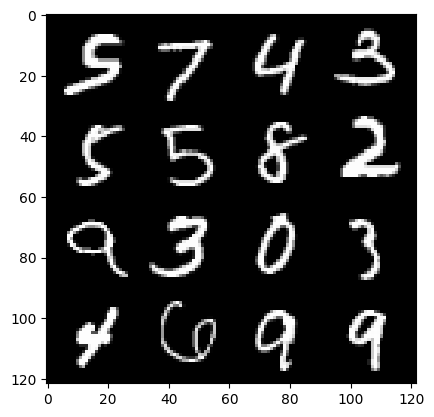

110: step 51600 / Gen loss: 2.774510362943012 / disc_loss: 0.19218458920717238


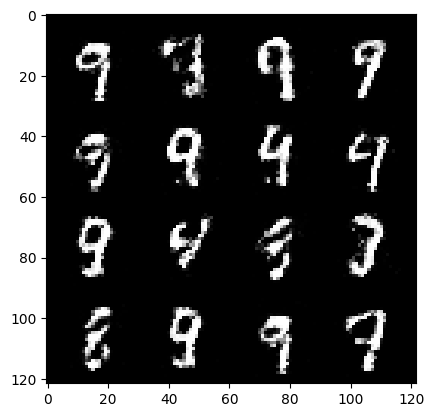

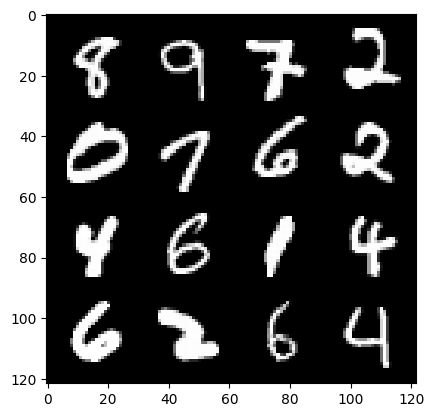

110: step 51900 / Gen loss: 2.882966844240824 / disc_loss: 0.18046663078169023


  0%|          | 0/469 [00:00<?, ?it/s]

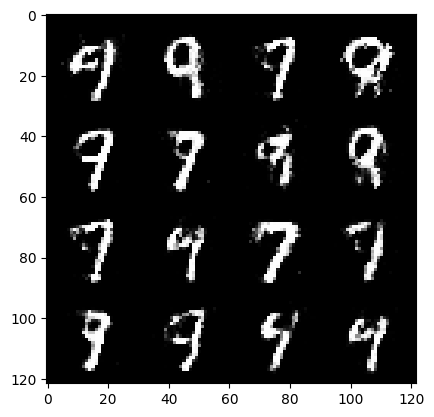

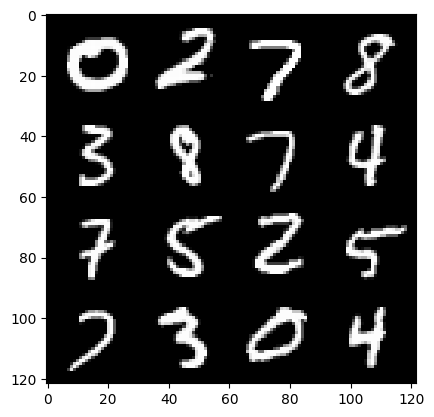

111: step 52200 / Gen loss: 2.7059217031796763 / disc_loss: 0.19542920497556537


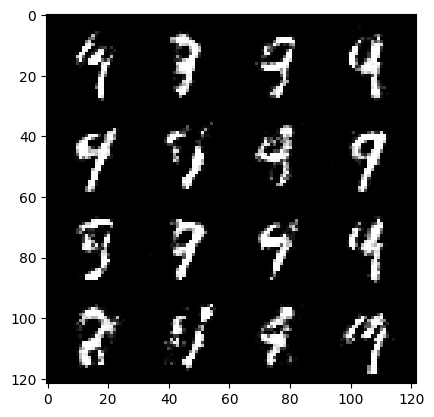

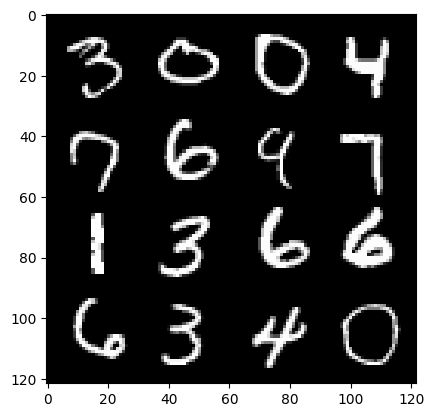

111: step 52500 / Gen loss: 2.816460258960725 / disc_loss: 0.1782849510510763


  0%|          | 0/469 [00:00<?, ?it/s]

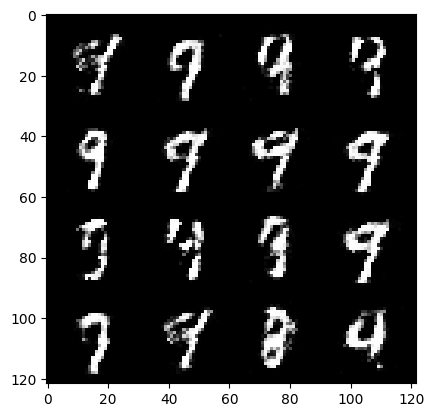

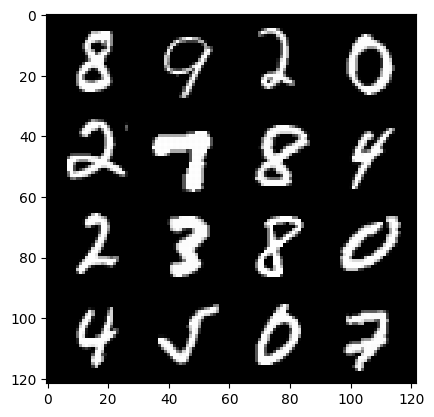

112: step 52800 / Gen loss: 2.8378922382990512 / disc_loss: 0.19287020084758602


  0%|          | 0/469 [00:00<?, ?it/s]

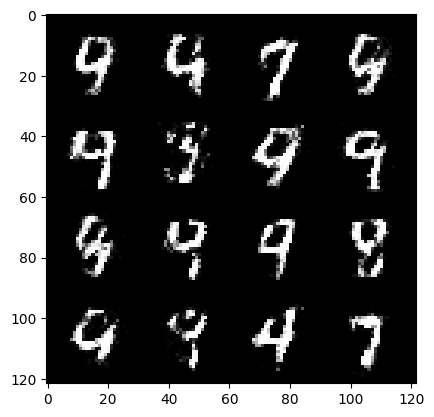

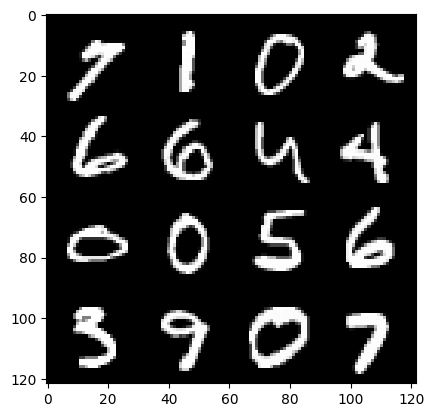

113: step 53100 / Gen loss: 2.721123065153758 / disc_loss: 0.19499631283183902


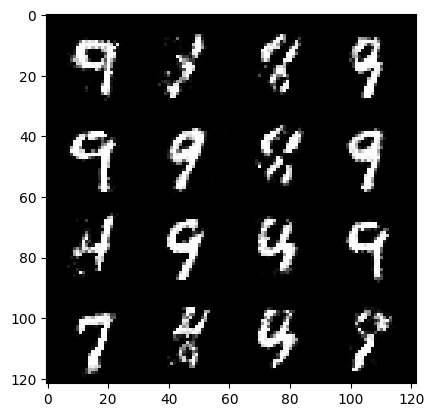

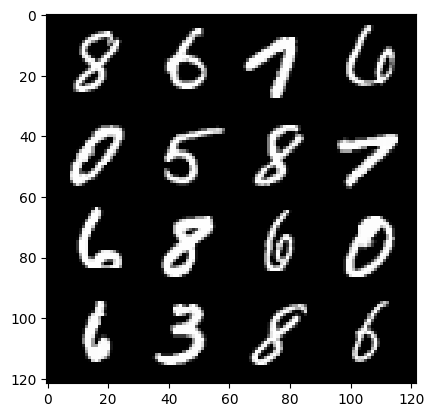

113: step 53400 / Gen loss: 2.741516780058542 / disc_loss: 0.19840602065126095


  0%|          | 0/469 [00:00<?, ?it/s]

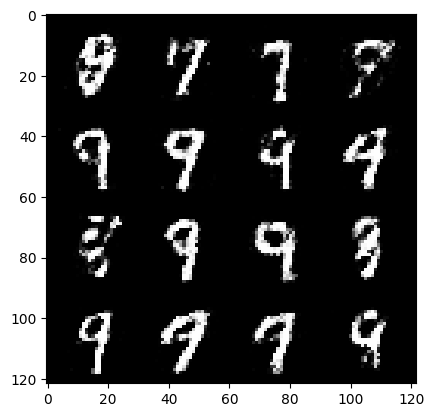

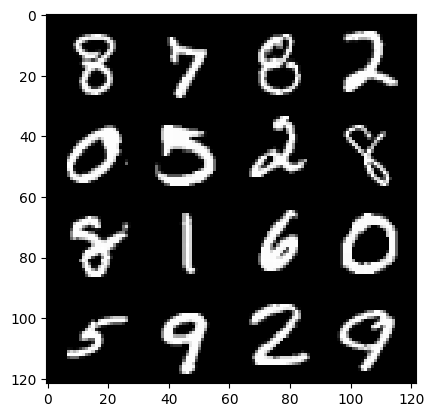

114: step 53700 / Gen loss: 2.763282229105633 / disc_loss: 0.20667582963903747


  0%|          | 0/469 [00:00<?, ?it/s]

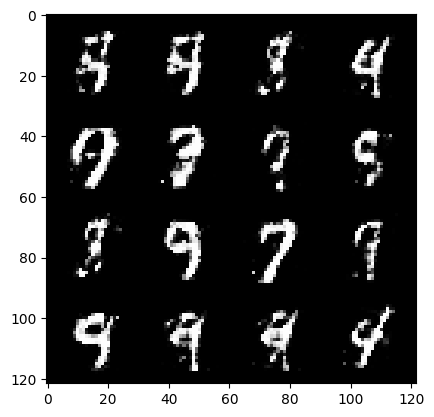

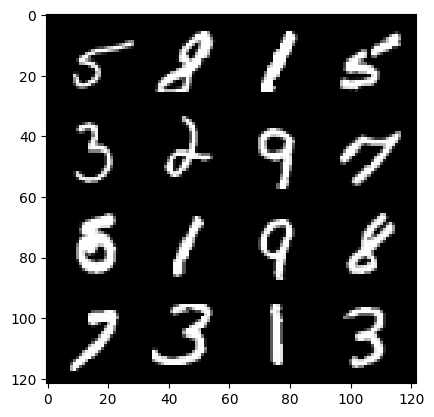

115: step 54000 / Gen loss: 2.7714435529708883 / disc_loss: 0.18561919413506986


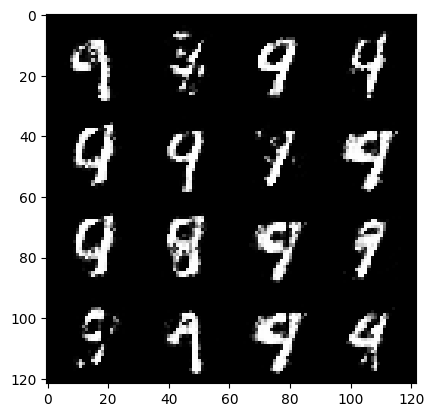

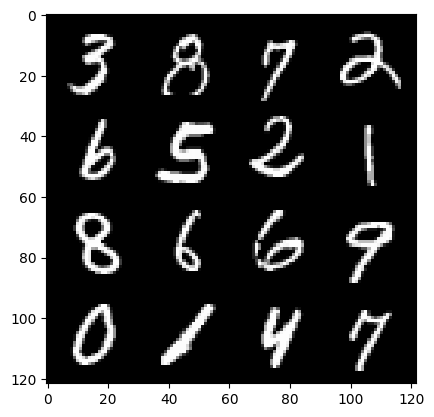

115: step 54300 / Gen loss: 2.8432203467686983 / disc_loss: 0.1784838097790876


  0%|          | 0/469 [00:00<?, ?it/s]

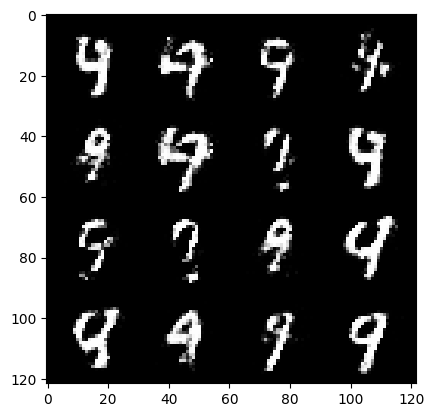

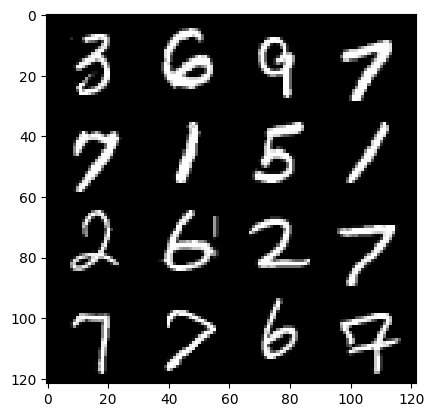

116: step 54600 / Gen loss: 2.7014735352993005 / disc_loss: 0.2050585154195625


  0%|          | 0/469 [00:00<?, ?it/s]

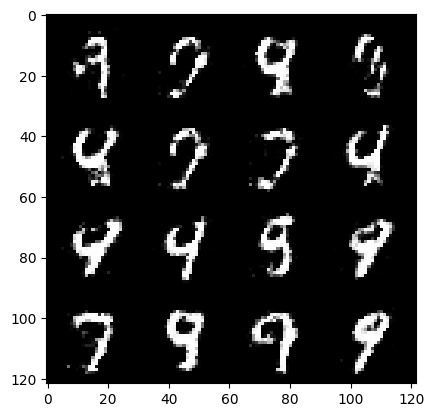

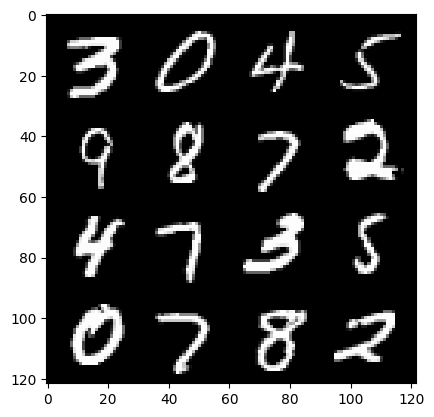

117: step 54900 / Gen loss: 2.7115318433443716 / disc_loss: 0.1934764627118906


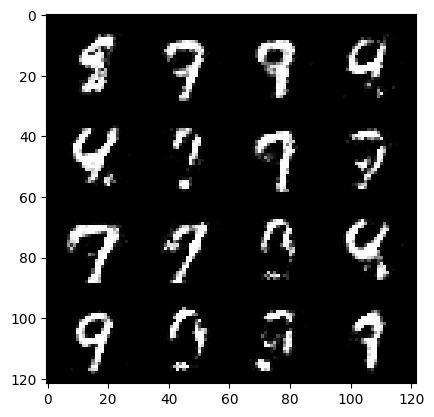

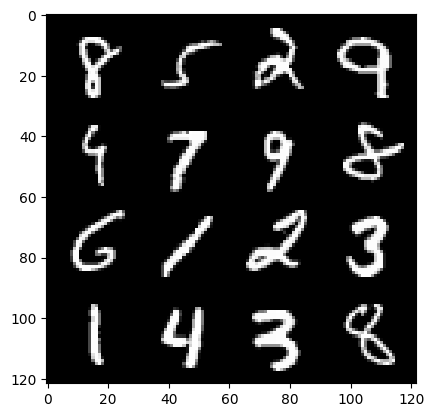

117: step 55200 / Gen loss: 2.644912494023639 / disc_loss: 0.2054811822623014


  0%|          | 0/469 [00:00<?, ?it/s]

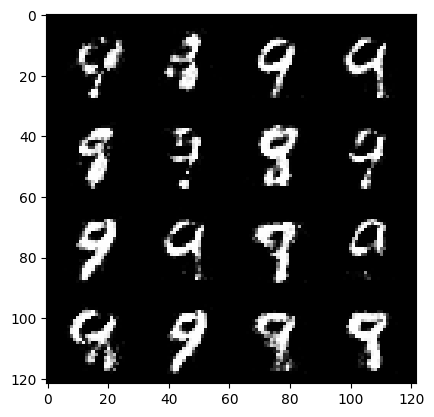

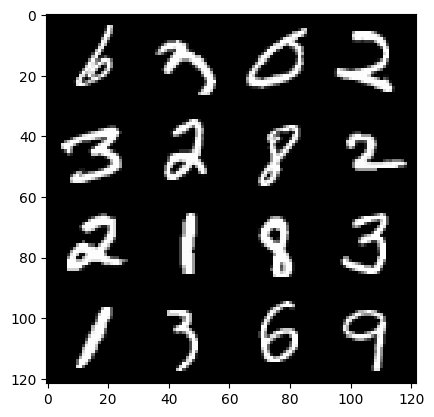

118: step 55500 / Gen loss: 2.605989414850872 / disc_loss: 0.21159784135719142


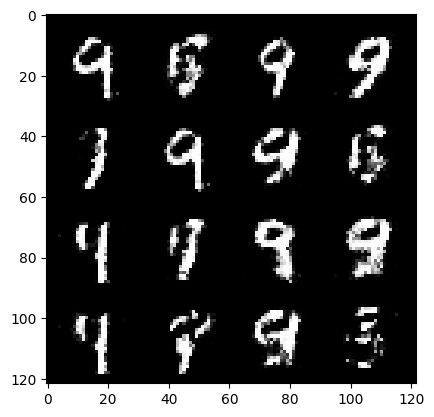

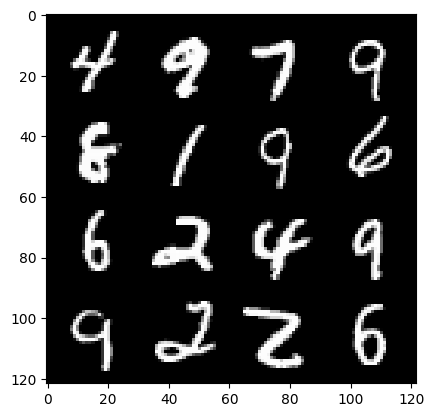

118: step 55800 / Gen loss: 2.5587694422403966 / disc_loss: 0.2042102060963711


  0%|          | 0/469 [00:00<?, ?it/s]

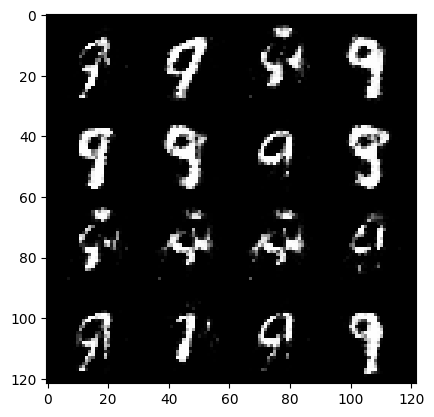

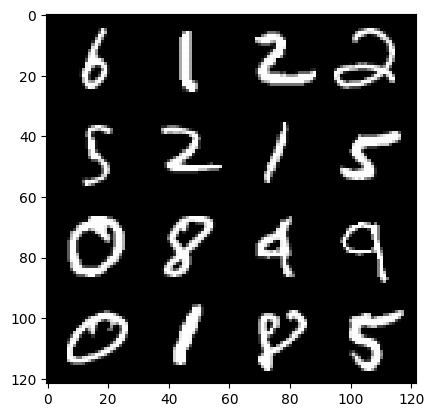

119: step 56100 / Gen loss: 2.659208188851674 / disc_loss: 0.1991741196811199


  0%|          | 0/469 [00:00<?, ?it/s]

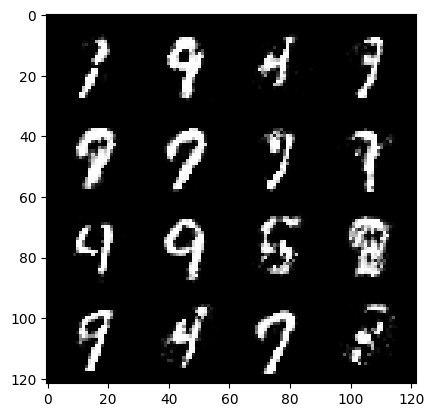

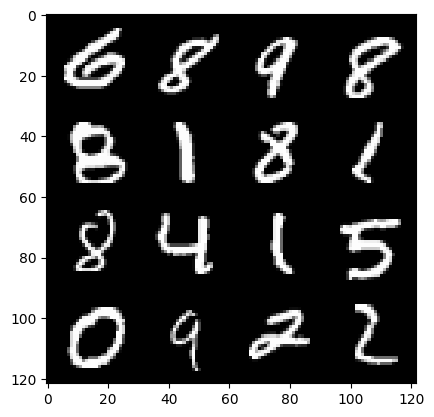

120: step 56400 / Gen loss: 2.566105473041532 / disc_loss: 0.21148076626161721


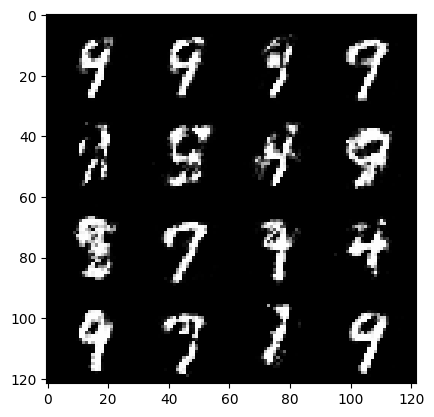

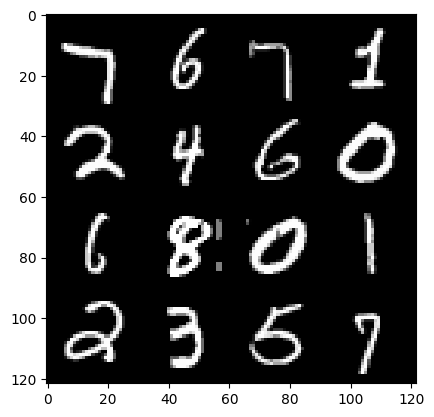

120: step 56700 / Gen loss: 2.5509118398030592 / disc_loss: 0.21976913521687189


  0%|          | 0/469 [00:00<?, ?it/s]

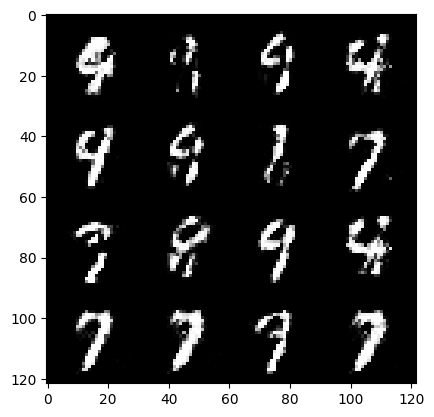

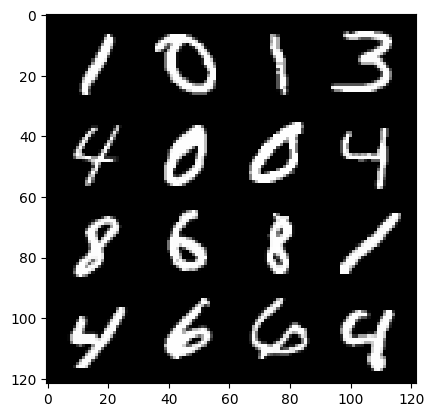

121: step 57000 / Gen loss: 2.571442651748657 / disc_loss: 0.22358875592549624


  0%|          | 0/469 [00:00<?, ?it/s]

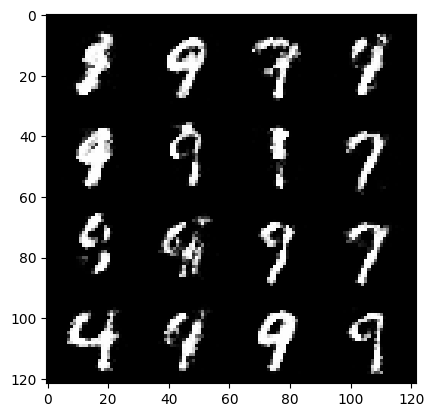

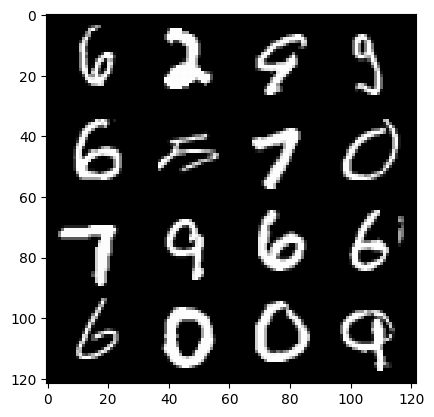

122: step 57300 / Gen loss: 2.5500947093963626 / disc_loss: 0.21979804597795013


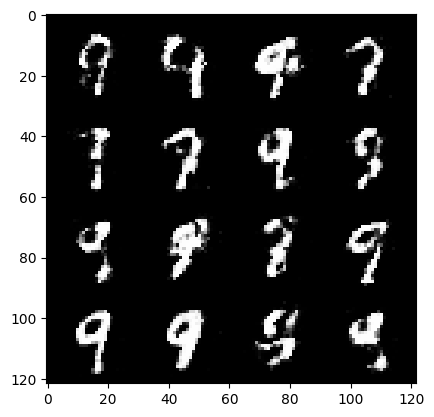

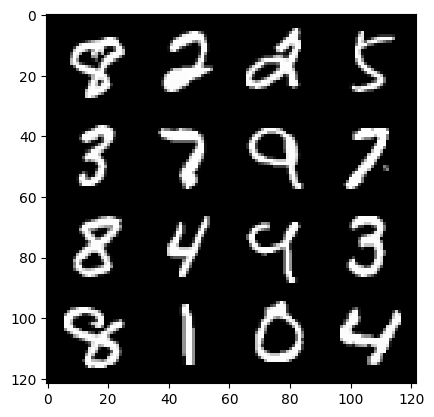

122: step 57600 / Gen loss: 2.4675489552815737 / disc_loss: 0.23114494800567617


  0%|          | 0/469 [00:00<?, ?it/s]

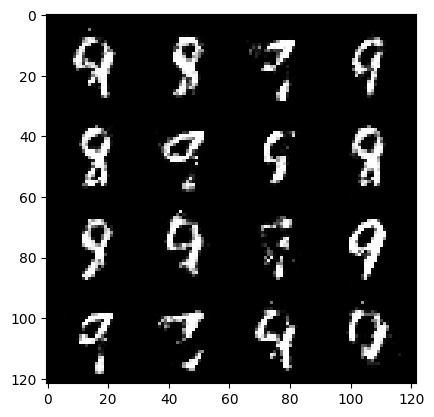

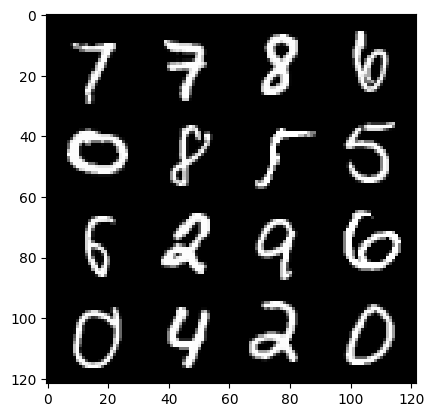

123: step 57900 / Gen loss: 2.379446161190668 / disc_loss: 0.2498691802223523


  0%|          | 0/469 [00:00<?, ?it/s]

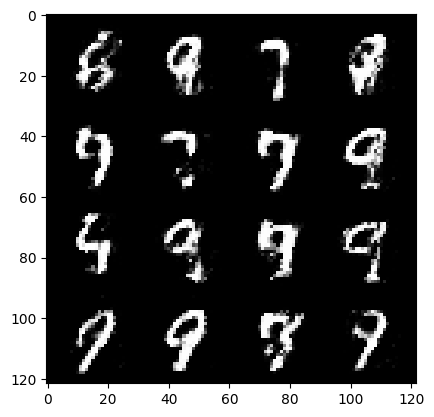

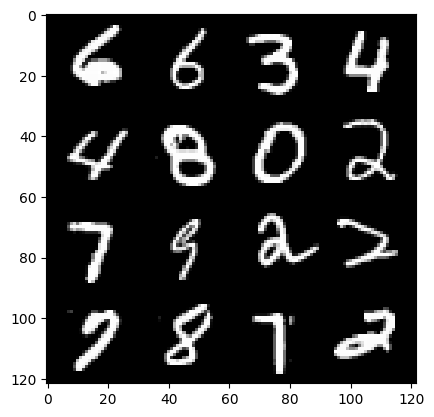

124: step 58200 / Gen loss: 2.51297802845637 / disc_loss: 0.2174163272976875


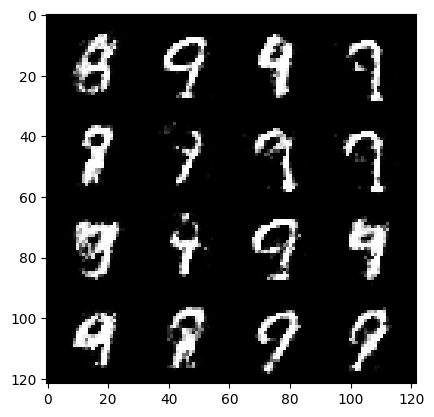

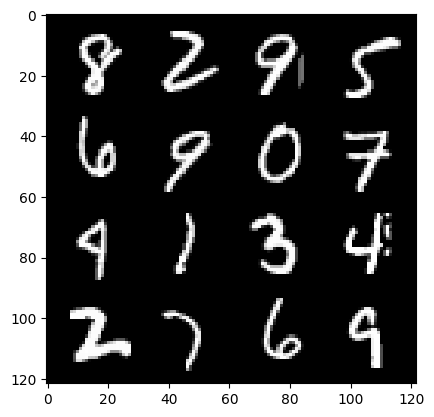

124: step 58500 / Gen loss: 2.385252888997394 / disc_loss: 0.24740056534608193


  0%|          | 0/469 [00:00<?, ?it/s]

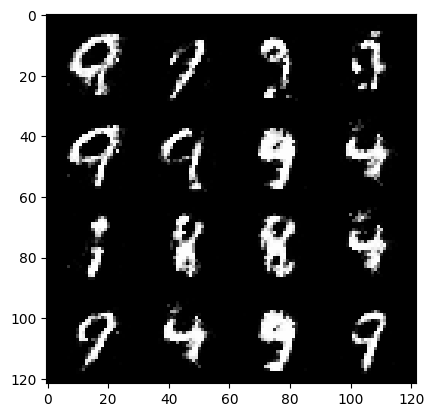

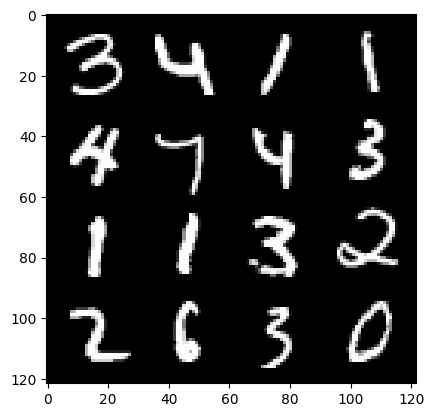

125: step 58800 / Gen loss: 2.3981944108009343 / disc_loss: 0.2306667758524418


  0%|          | 0/469 [00:00<?, ?it/s]

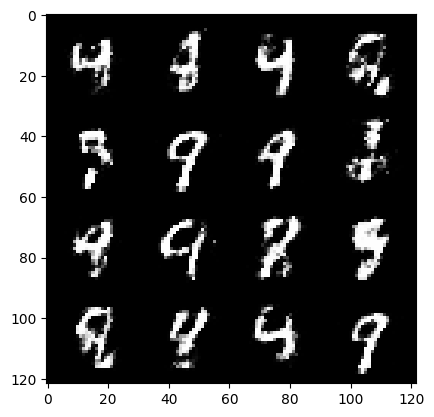

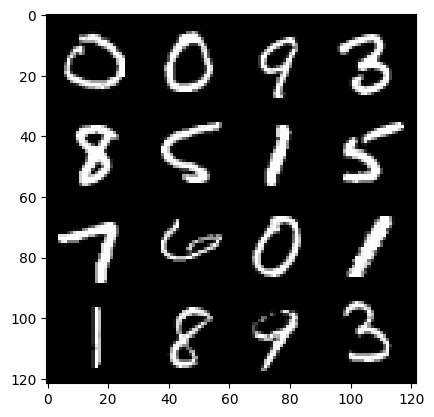

126: step 59100 / Gen loss: 2.4937511944770825 / disc_loss: 0.21792836656173079


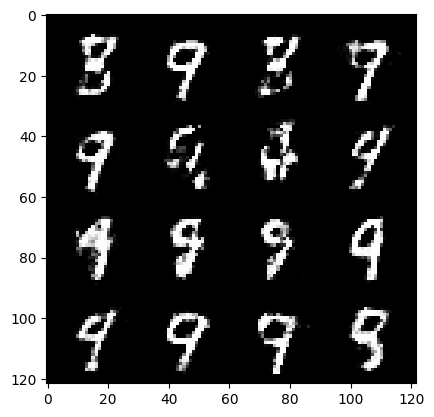

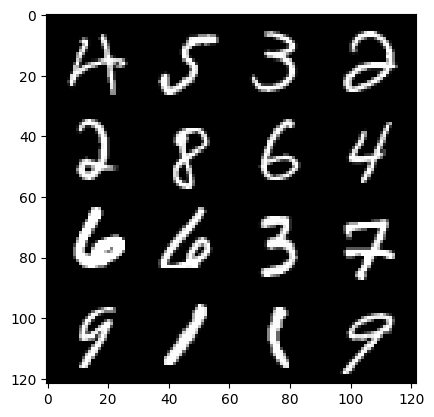

126: step 59400 / Gen loss: 2.400542606115342 / disc_loss: 0.23565939635038377


  0%|          | 0/469 [00:00<?, ?it/s]

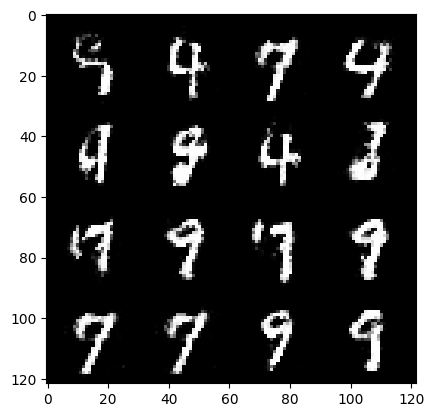

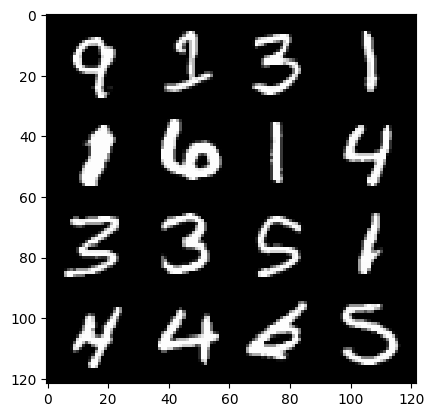

127: step 59700 / Gen loss: 2.4647136910756426 / disc_loss: 0.22484712267915402


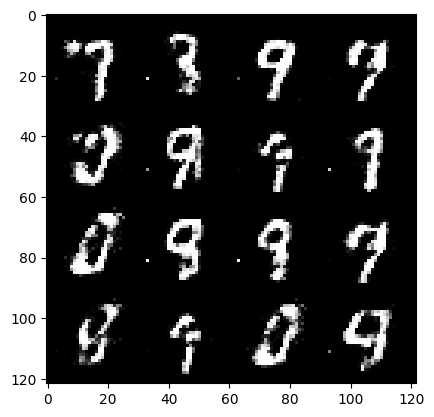

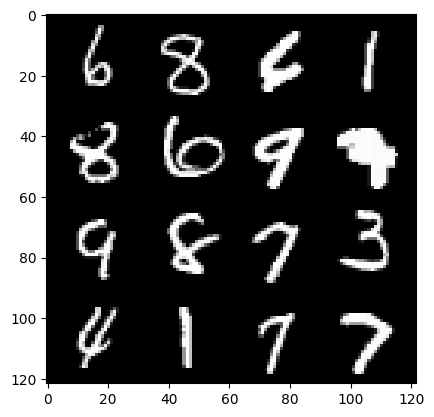

127: step 60000 / Gen loss: 2.379792942603426 / disc_loss: 0.24596744919816663


  0%|          | 0/469 [00:00<?, ?it/s]

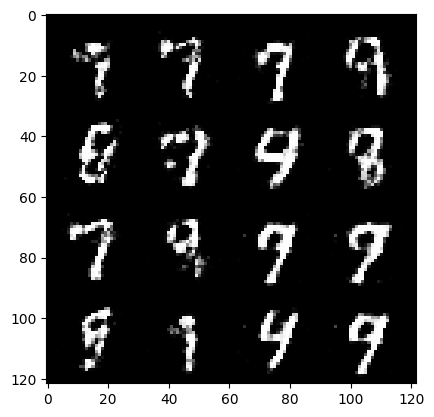

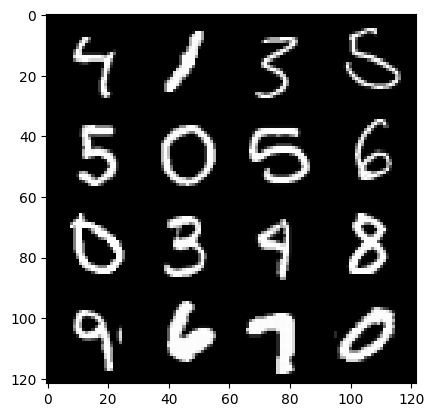

128: step 60300 / Gen loss: 2.4138337655862174 / disc_loss: 0.23364642282327022


  0%|          | 0/469 [00:00<?, ?it/s]

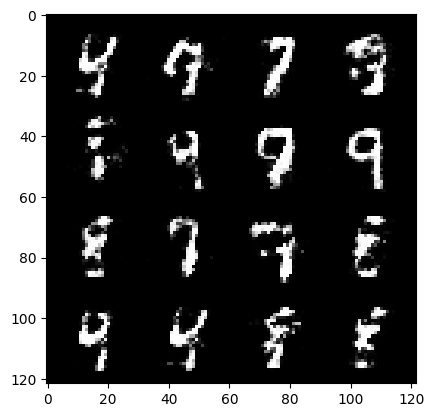

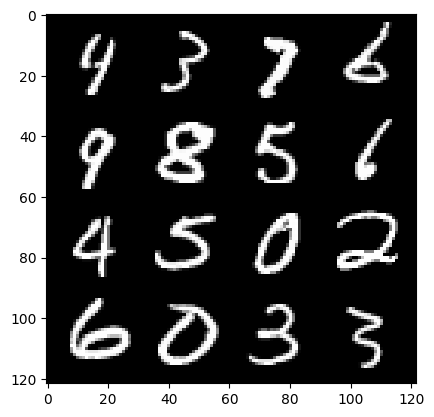

129: step 60600 / Gen loss: 2.4425542577107726 / disc_loss: 0.223933642009894


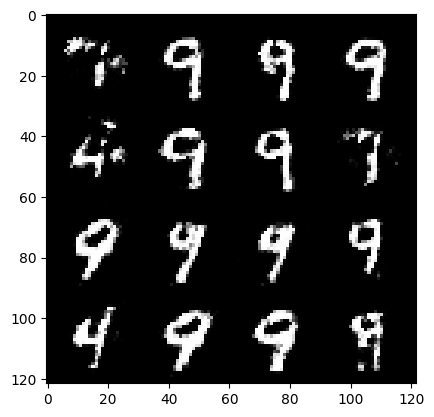

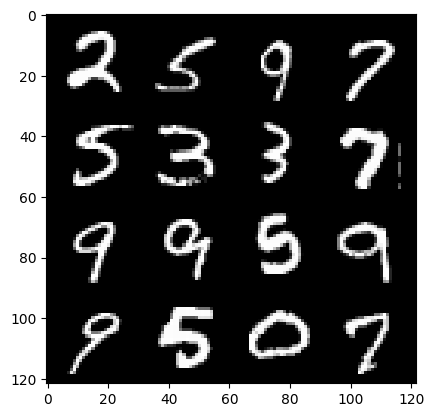

129: step 60900 / Gen loss: 2.391563302278519 / disc_loss: 0.24090603644649206


  0%|          | 0/469 [00:00<?, ?it/s]

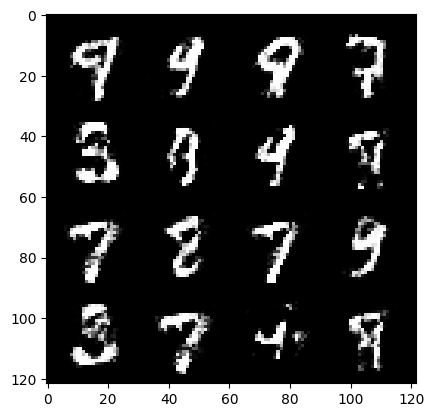

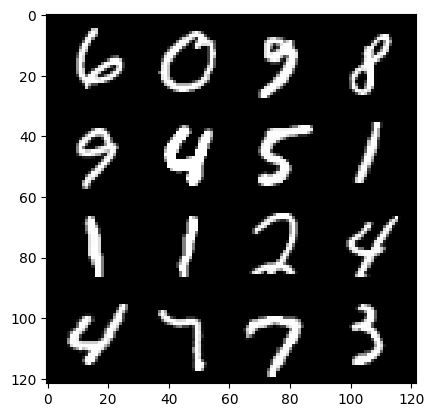

130: step 61200 / Gen loss: 2.4443573029836023 / disc_loss: 0.2311129819850129


  0%|          | 0/469 [00:00<?, ?it/s]

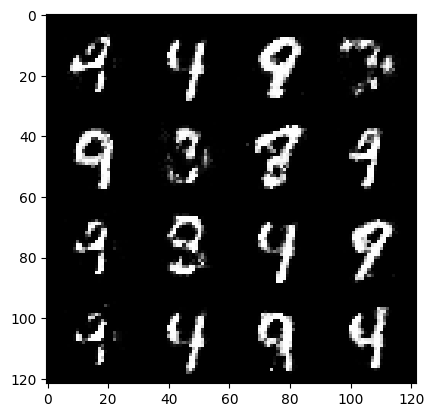

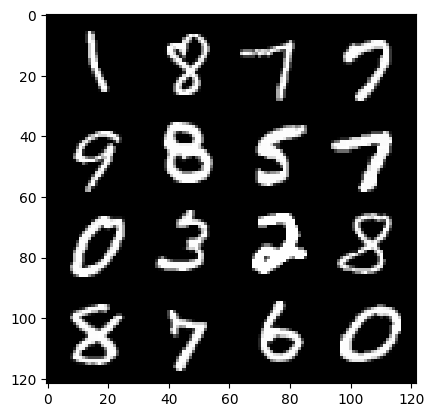

131: step 61500 / Gen loss: 2.512572047710417 / disc_loss: 0.22202725162108755


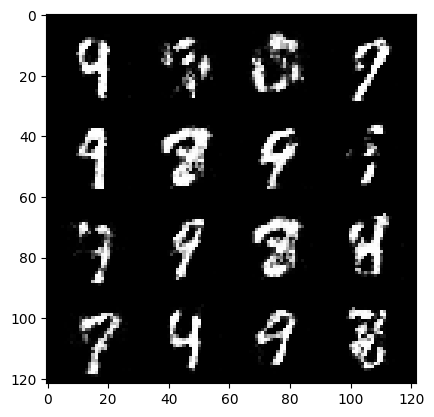

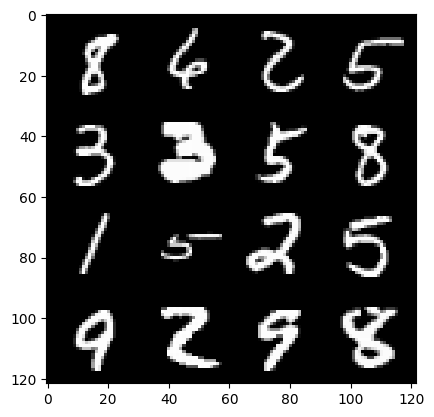

131: step 61800 / Gen loss: 2.3926142231623335 / disc_loss: 0.24560333843032525


  0%|          | 0/469 [00:00<?, ?it/s]

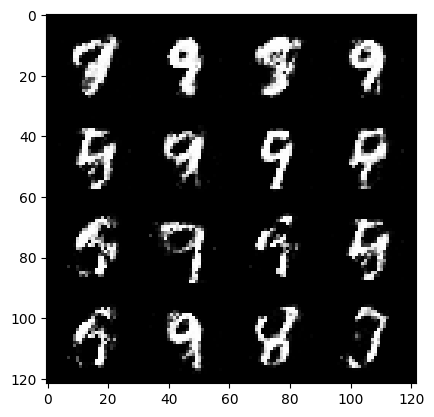

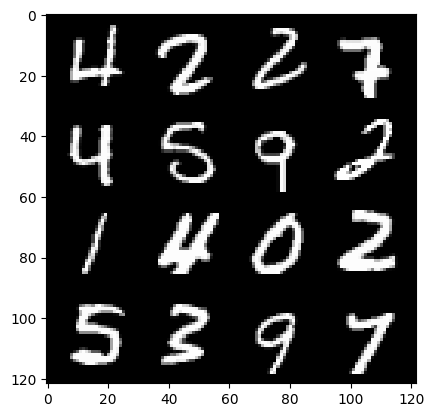

132: step 62100 / Gen loss: 2.3938787861665096 / disc_loss: 0.23743246754010502


  0%|          | 0/469 [00:00<?, ?it/s]

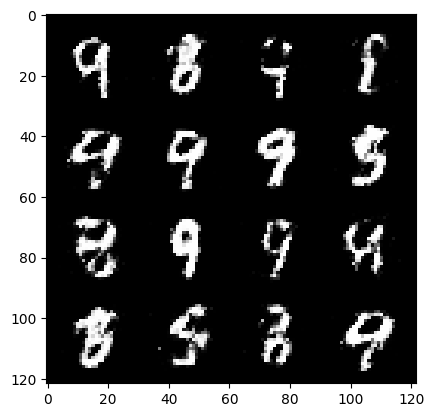

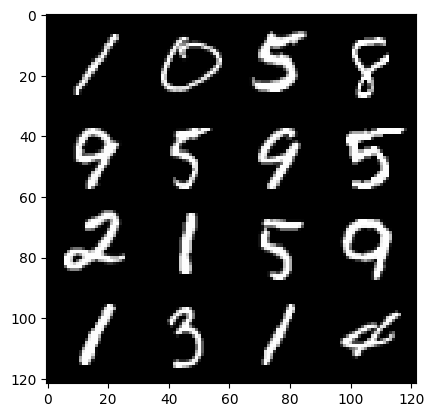

133: step 62400 / Gen loss: 2.3696639438470197 / disc_loss: 0.2393171702325345


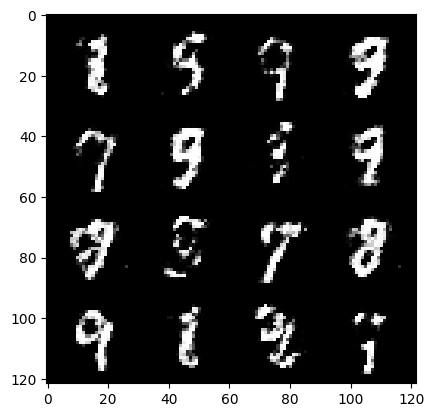

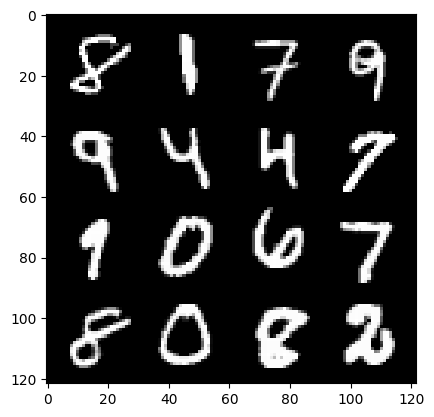

133: step 62700 / Gen loss: 2.4064659865697204 / disc_loss: 0.22551465128858889


  0%|          | 0/469 [00:00<?, ?it/s]

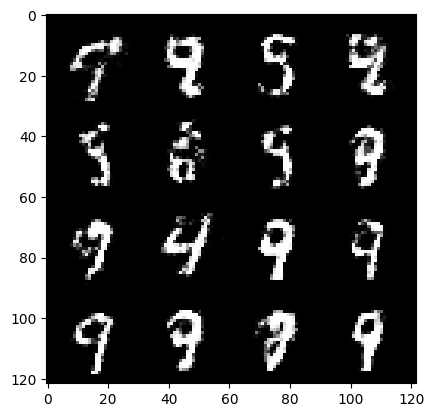

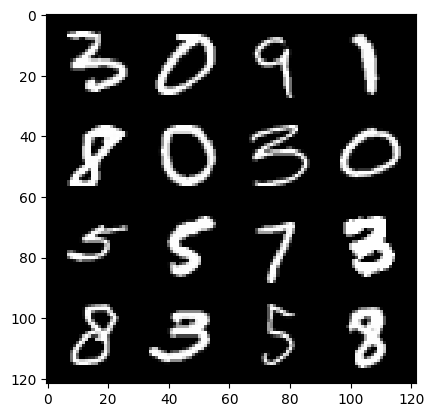

134: step 63000 / Gen loss: 2.4414732921123514 / disc_loss: 0.22468554377555847


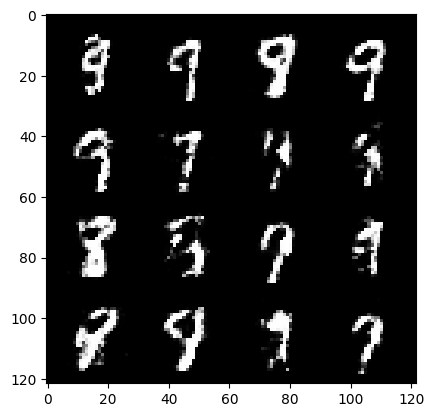

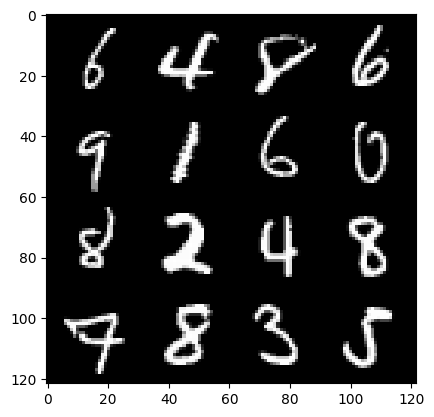

134: step 63300 / Gen loss: 2.5156901971499113 / disc_loss: 0.21844702502091728


  0%|          | 0/469 [00:00<?, ?it/s]

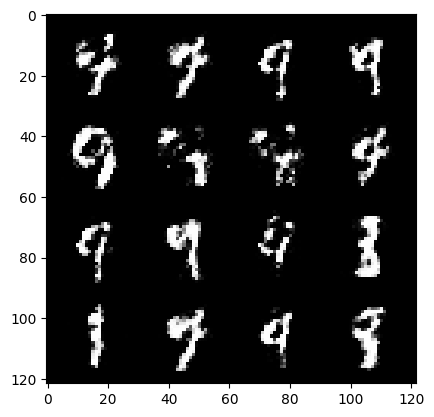

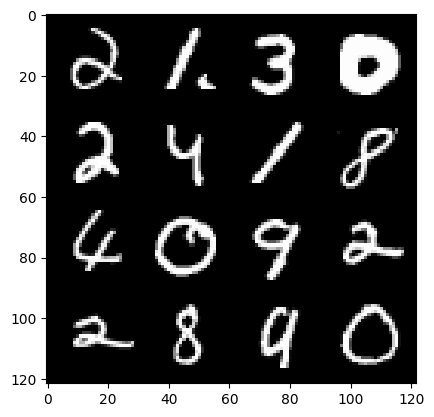

135: step 63600 / Gen loss: 2.3089059313138325 / disc_loss: 0.24843056862552965


  0%|          | 0/469 [00:00<?, ?it/s]

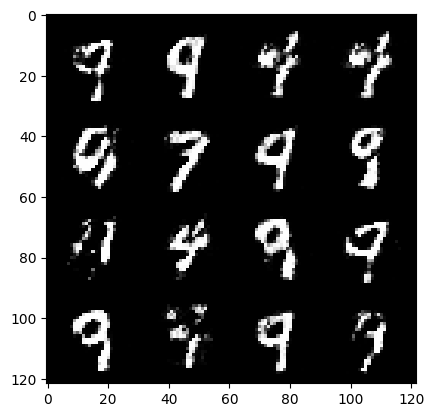

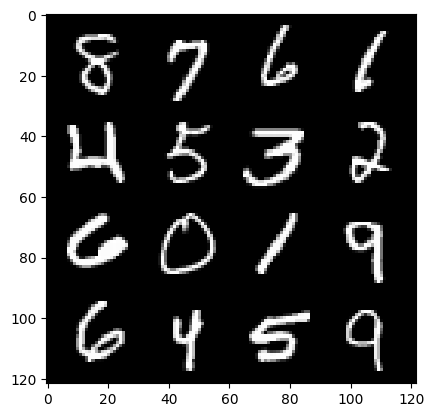

136: step 63900 / Gen loss: 2.3079725031058 / disc_loss: 0.23683868447939566


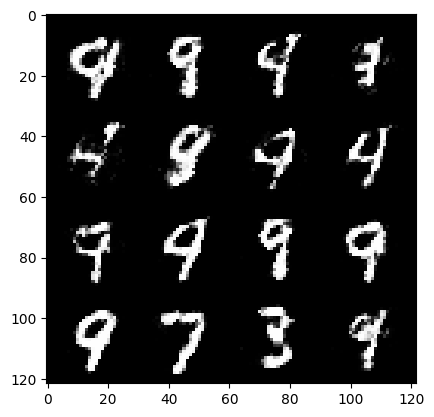

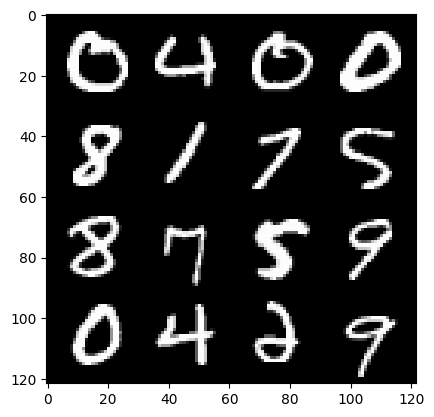

136: step 64200 / Gen loss: 2.4027680667241413 / disc_loss: 0.22121280834078777


  0%|          | 0/469 [00:00<?, ?it/s]

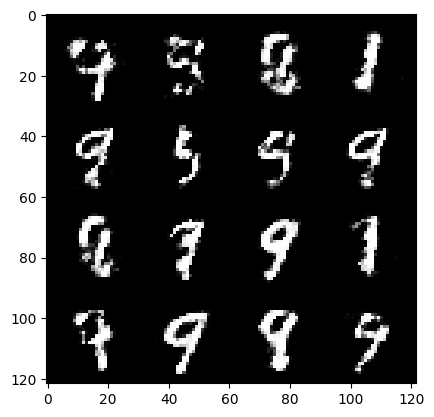

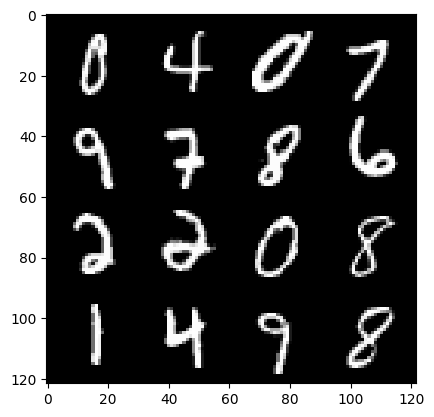

137: step 64500 / Gen loss: 2.3076561117172227 / disc_loss: 0.24659283831715592


  0%|          | 0/469 [00:00<?, ?it/s]

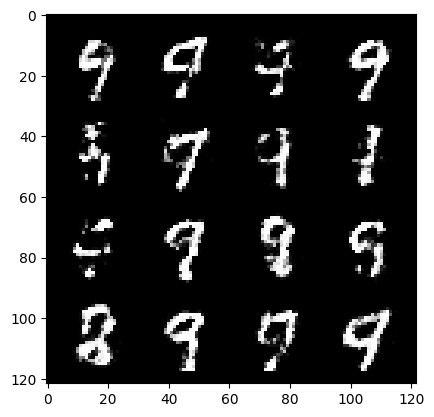

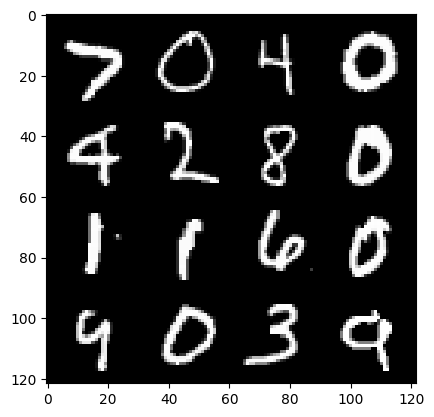

138: step 64800 / Gen loss: 2.236481881936392 / disc_loss: 0.25809534028172515


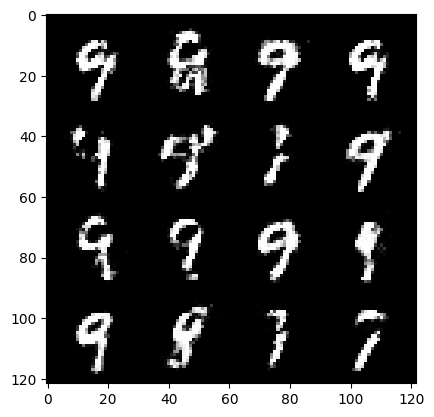

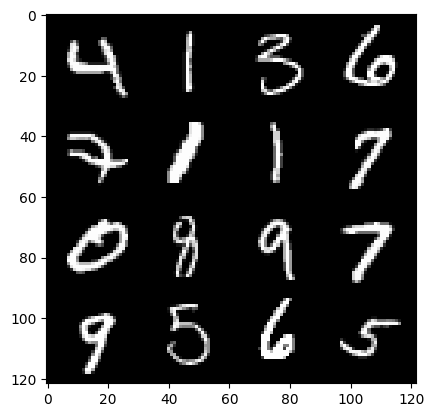

138: step 65100 / Gen loss: 2.2553640592098256 / disc_loss: 0.26077636510133756


  0%|          | 0/469 [00:00<?, ?it/s]

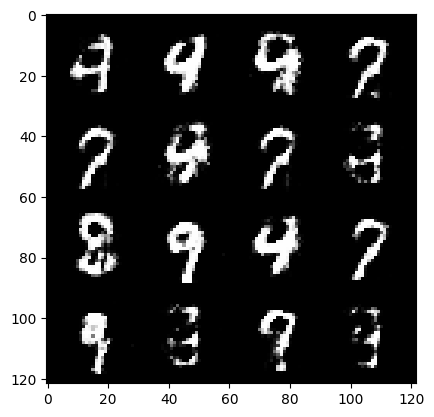

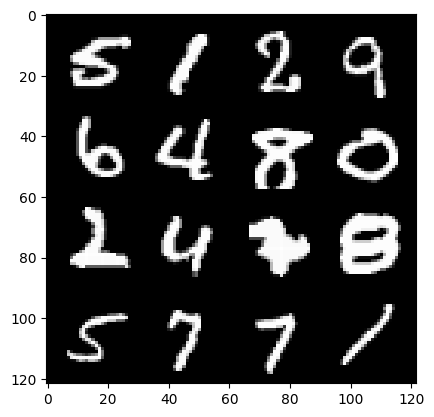

139: step 65400 / Gen loss: 2.219643001159031 / disc_loss: 0.25873483995596547


  0%|          | 0/469 [00:00<?, ?it/s]

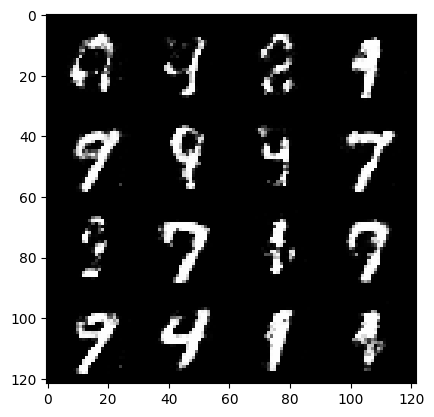

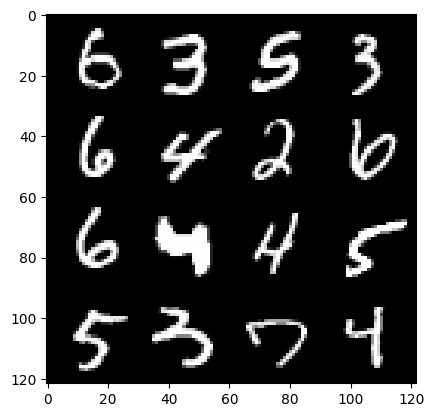

140: step 65700 / Gen loss: 2.1472327999273935 / disc_loss: 0.26444616412123056


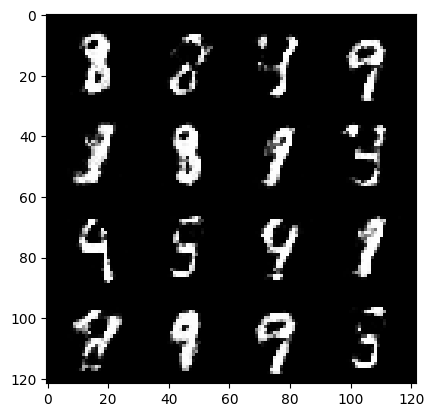

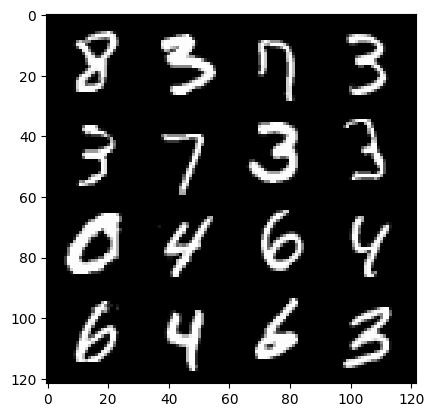

140: step 66000 / Gen loss: 2.1576189756393434 / disc_loss: 0.265320918162664


  0%|          | 0/469 [00:00<?, ?it/s]

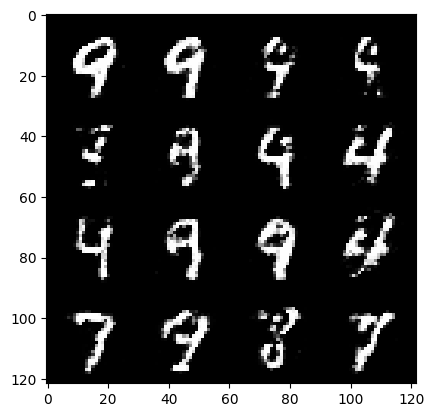

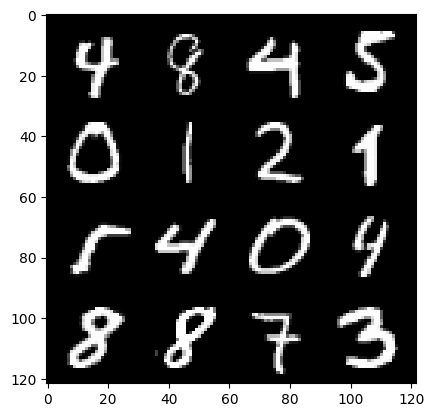

141: step 66300 / Gen loss: 2.2223235205809275 / disc_loss: 0.2546772979696591


  0%|          | 0/469 [00:00<?, ?it/s]

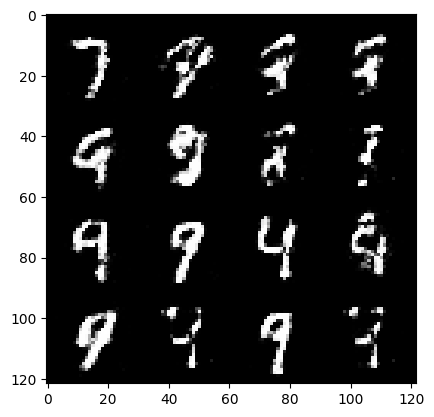

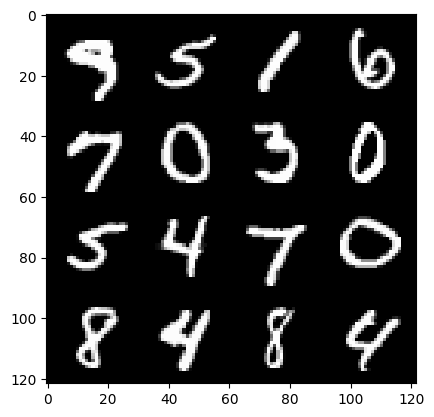

142: step 66600 / Gen loss: 2.1102082041899366 / disc_loss: 0.2868424476683139


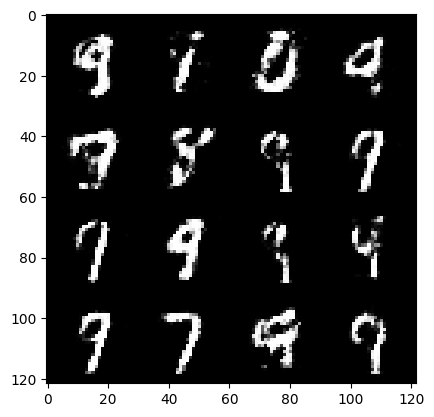

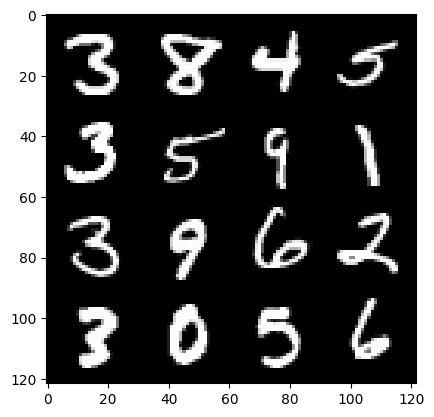

142: step 66900 / Gen loss: 2.0834352648258214 / disc_loss: 0.28629107957084965


  0%|          | 0/469 [00:00<?, ?it/s]

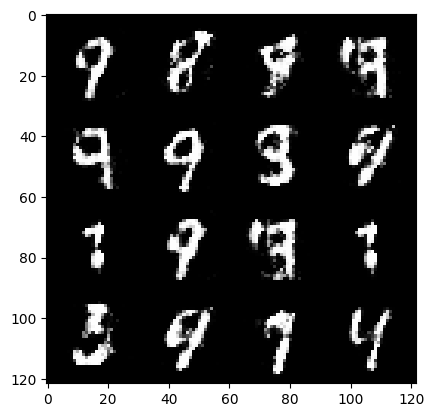

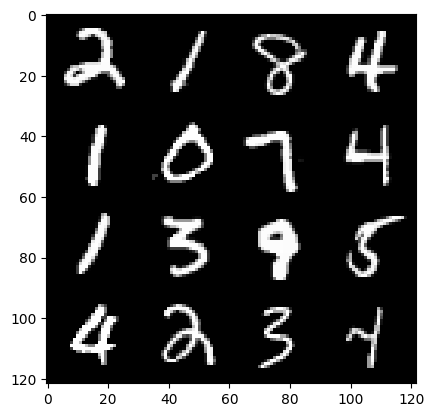

143: step 67200 / Gen loss: 2.0679610800743116 / disc_loss: 0.2920670169095197


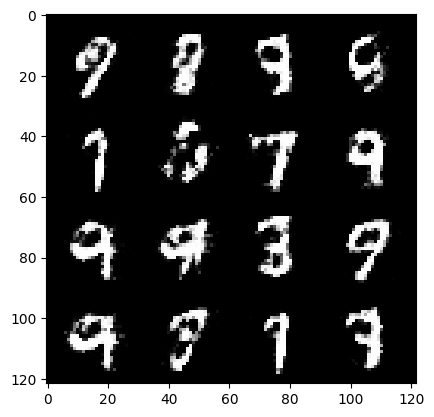

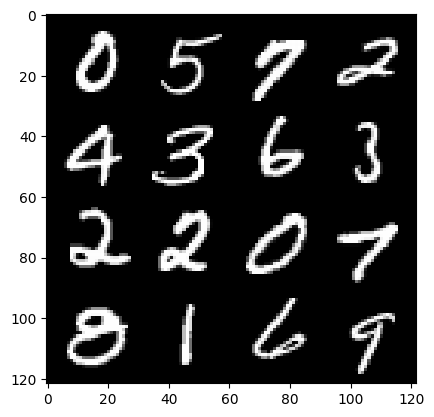

143: step 67500 / Gen loss: 2.041462055047352 / disc_loss: 0.28396321540077535


  0%|          | 0/469 [00:00<?, ?it/s]

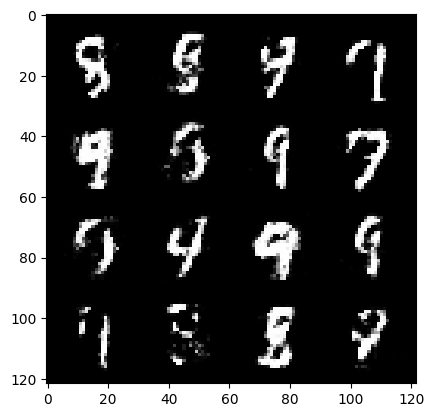

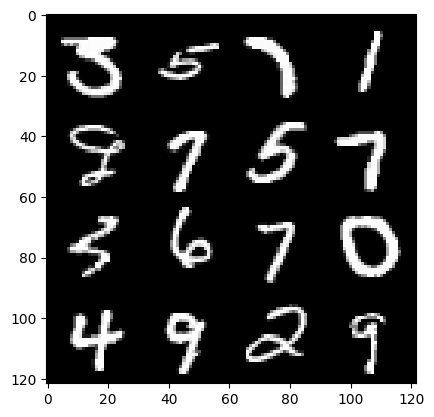

144: step 67800 / Gen loss: 2.154162431557975 / disc_loss: 0.25211728473504397


  0%|          | 0/469 [00:00<?, ?it/s]

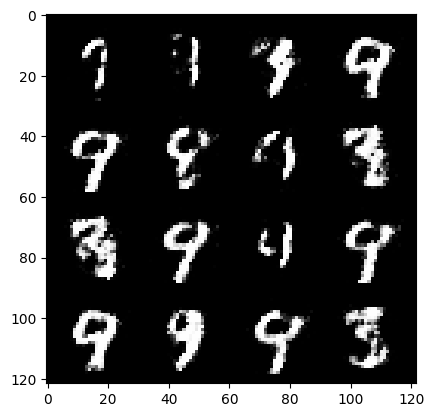

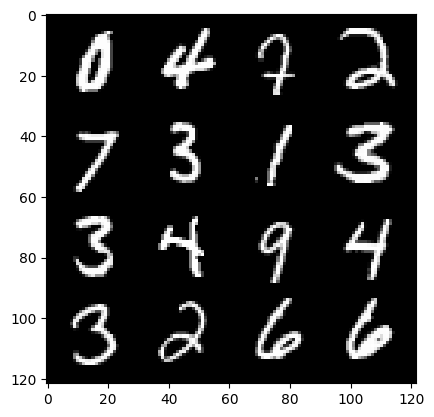

145: step 68100 / Gen loss: 2.1242444320519778 / disc_loss: 0.2703937268753843


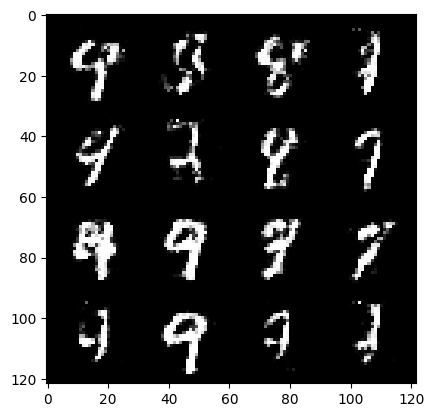

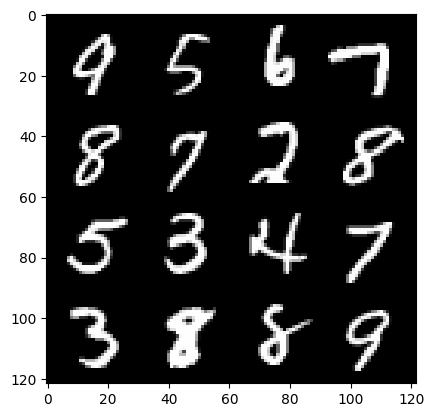

145: step 68400 / Gen loss: 2.05572442293167 / disc_loss: 0.2861257499456406


  0%|          | 0/469 [00:00<?, ?it/s]

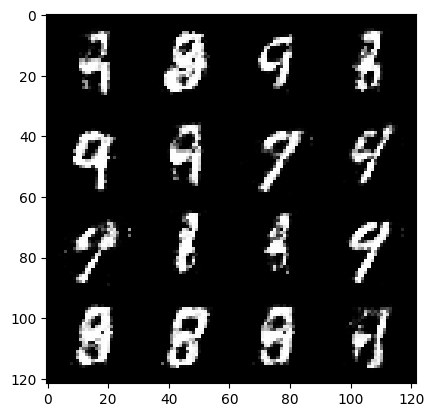

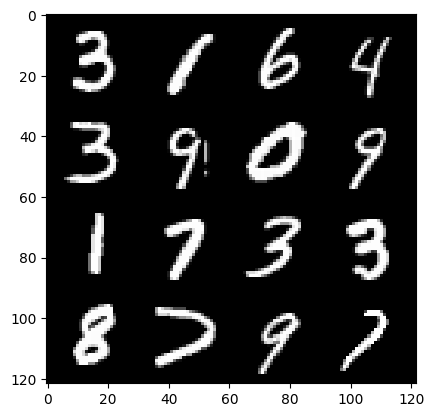

146: step 68700 / Gen loss: 2.0545751527945177 / disc_loss: 0.288003645489613


  0%|          | 0/469 [00:00<?, ?it/s]

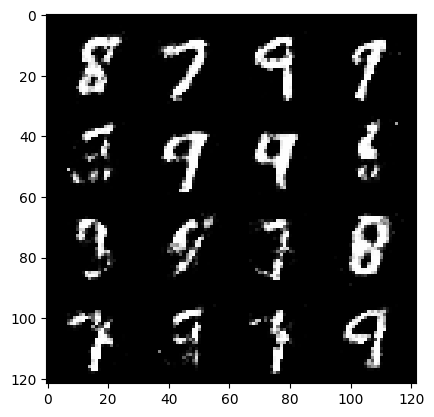

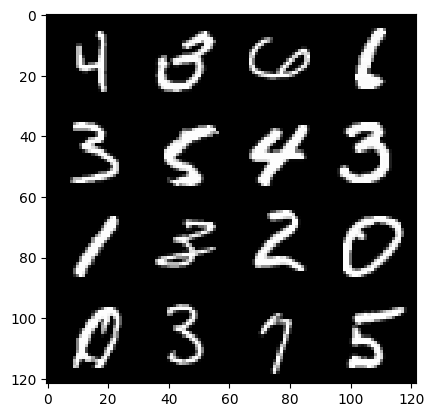

147: step 69000 / Gen loss: 2.0465469042460147 / disc_loss: 0.28115827813744554


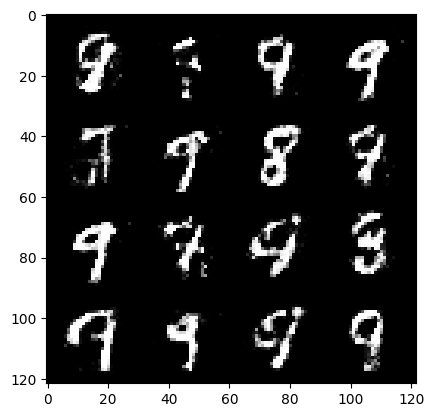

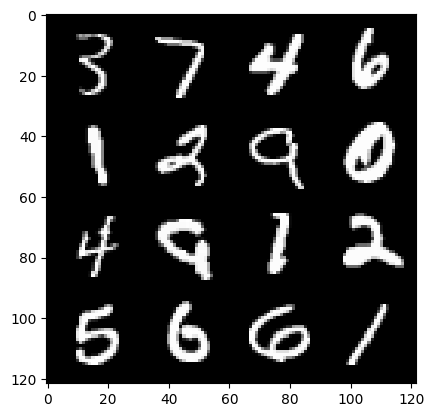

147: step 69300 / Gen loss: 2.1440648361047105 / disc_loss: 0.2706177785992622


  0%|          | 0/469 [00:00<?, ?it/s]

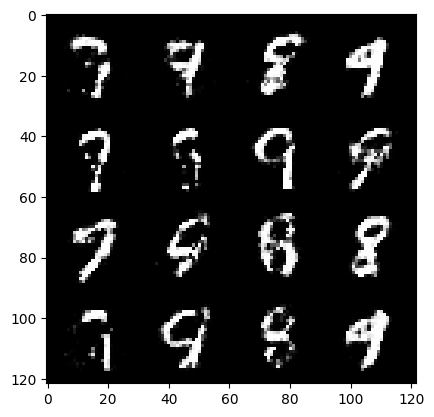

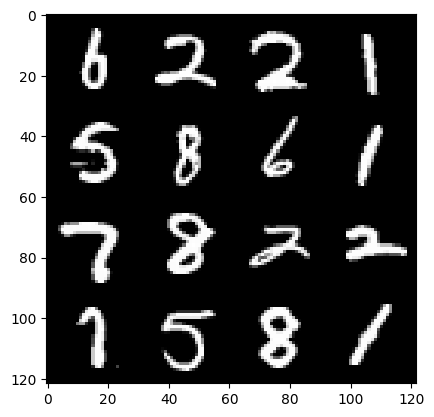

148: step 69600 / Gen loss: 2.0998426262537633 / disc_loss: 0.2787122368812564


  0%|          | 0/469 [00:00<?, ?it/s]

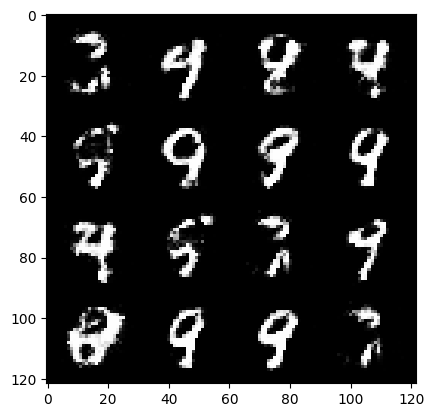

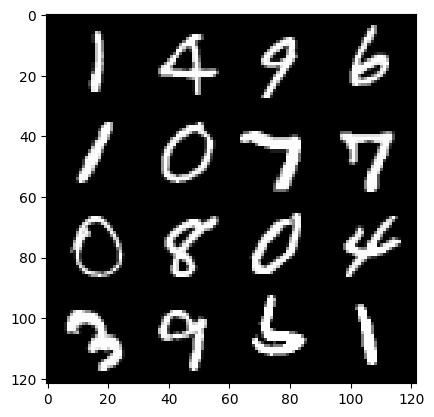

149: step 69900 / Gen loss: 2.092769314845403 / disc_loss: 0.2738259064654509


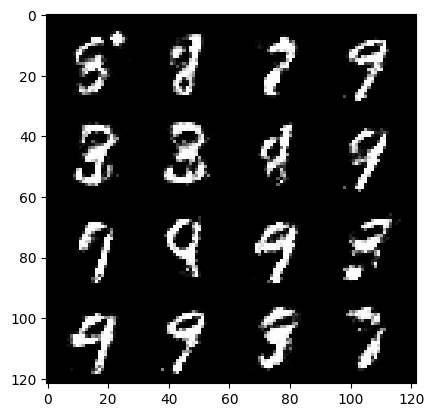

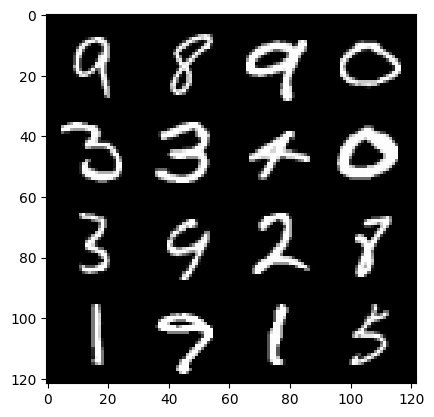

149: step 70200 / Gen loss: 1.966444669564565 / disc_loss: 0.3057434336344401


  0%|          | 0/469 [00:00<?, ?it/s]

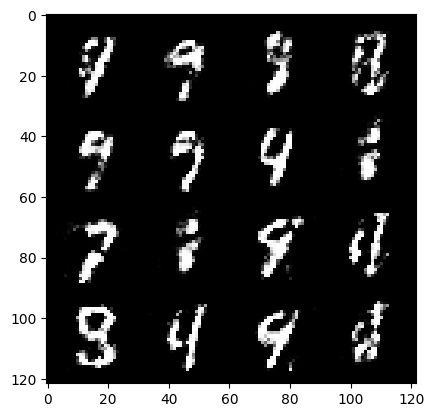

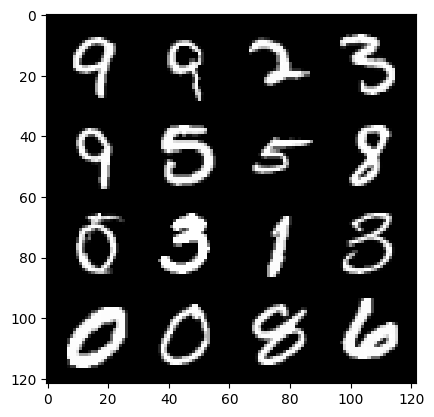

150: step 70500 / Gen loss: 2.1069756484031688 / disc_loss: 0.272276871452729


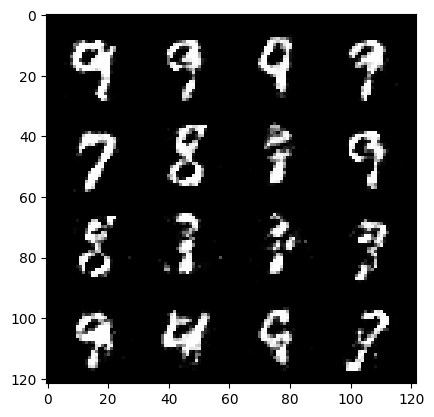

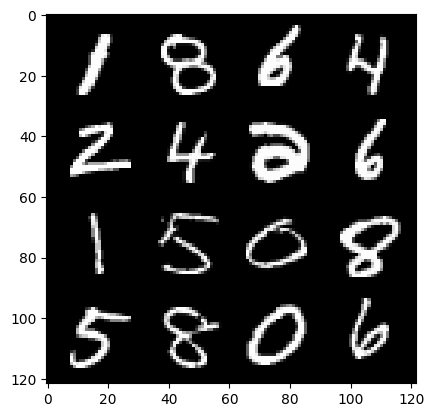

150: step 70800 / Gen loss: 2.109818314313889 / disc_loss: 0.2768684425950049


  0%|          | 0/469 [00:00<?, ?it/s]

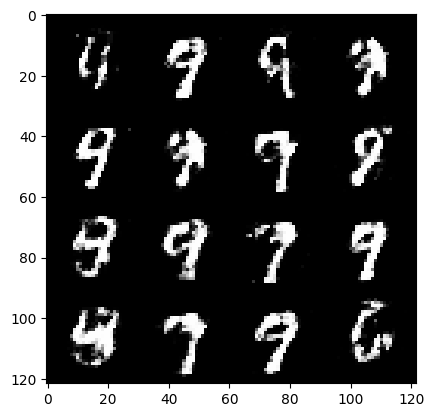

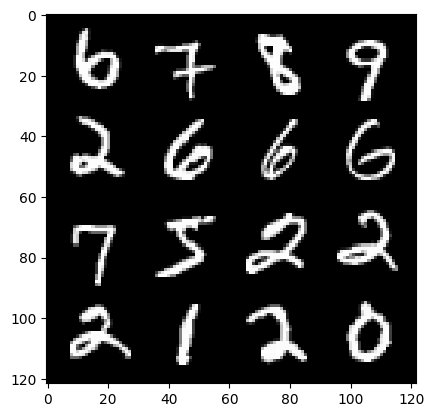

151: step 71100 / Gen loss: 2.062705147663753 / disc_loss: 0.2820960174997648


  0%|          | 0/469 [00:00<?, ?it/s]

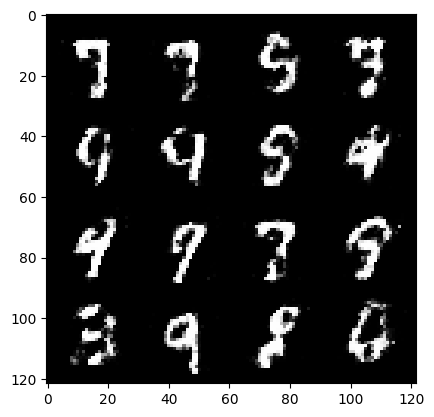

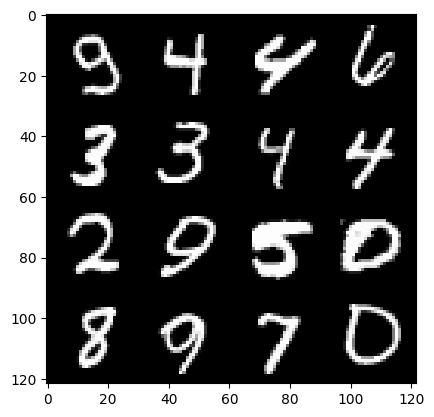

152: step 71400 / Gen loss: 2.0190852161248523 / disc_loss: 0.2990658660729726


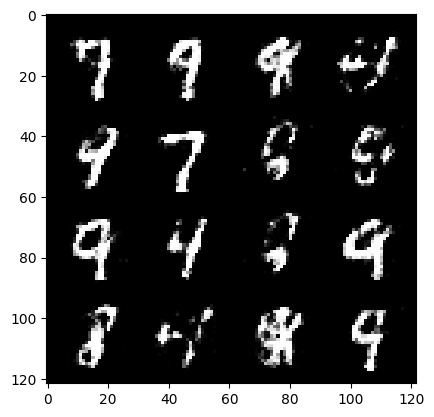

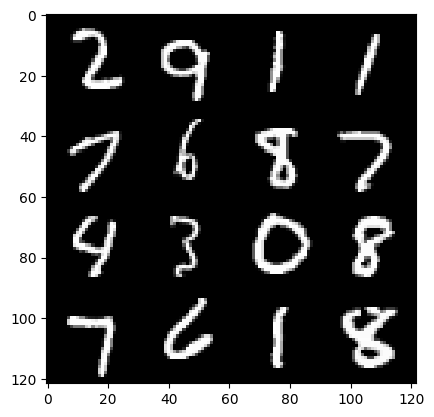

152: step 71700 / Gen loss: 2.000350162188211 / disc_loss: 0.29361144170165054


  0%|          | 0/469 [00:00<?, ?it/s]

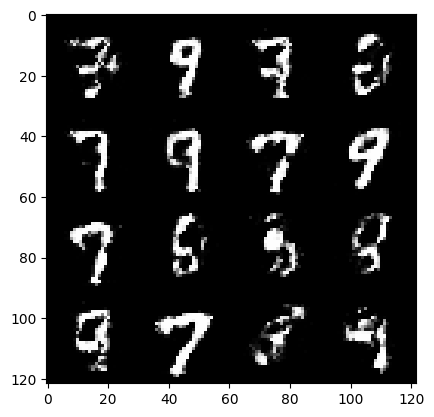

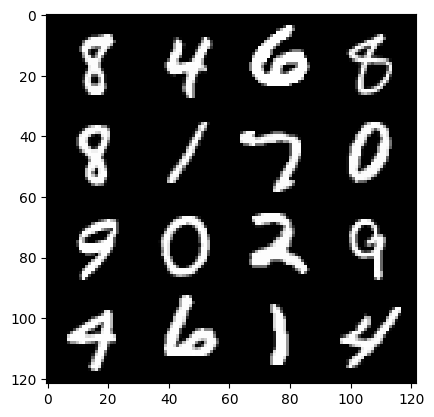

153: step 72000 / Gen loss: 2.0925130712986006 / disc_loss: 0.28409636244177827


  0%|          | 0/469 [00:00<?, ?it/s]

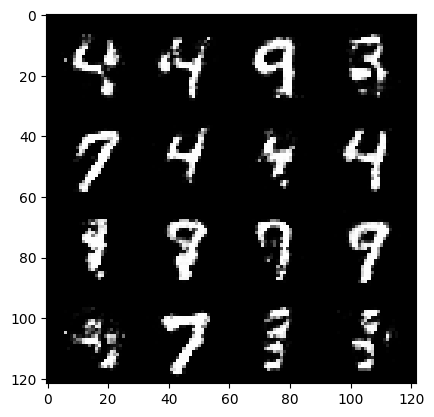

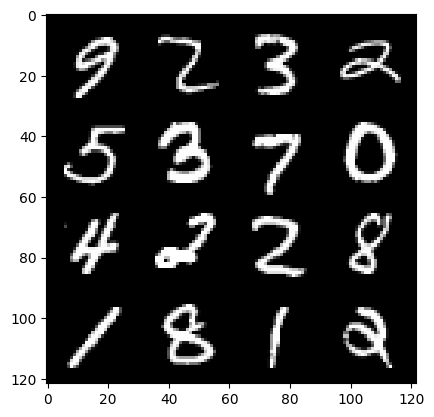

154: step 72300 / Gen loss: 1.9935346003373464 / disc_loss: 0.2953528597454228


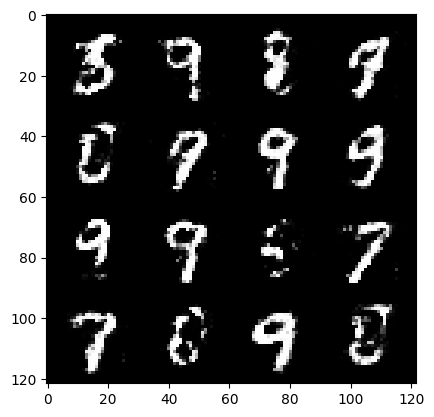

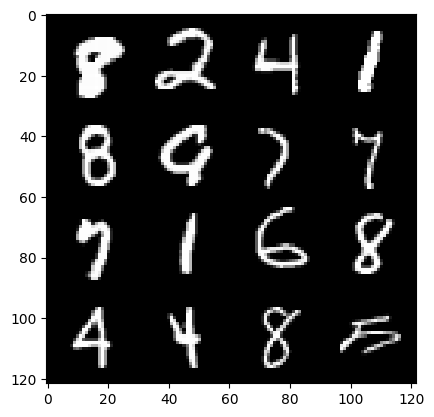

154: step 72600 / Gen loss: 1.966161860624949 / disc_loss: 0.29547604387005183


  0%|          | 0/469 [00:00<?, ?it/s]

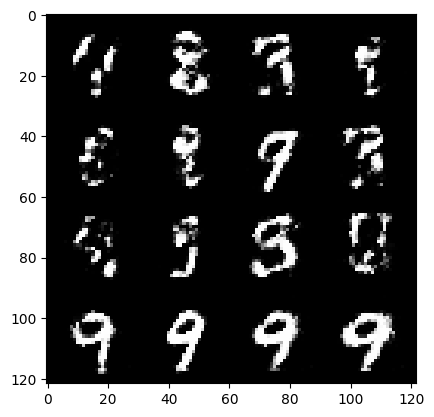

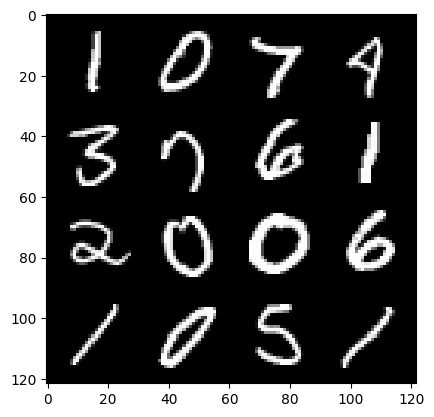

155: step 72900 / Gen loss: 2.065223074356715 / disc_loss: 0.2716654841601848


  0%|          | 0/469 [00:00<?, ?it/s]

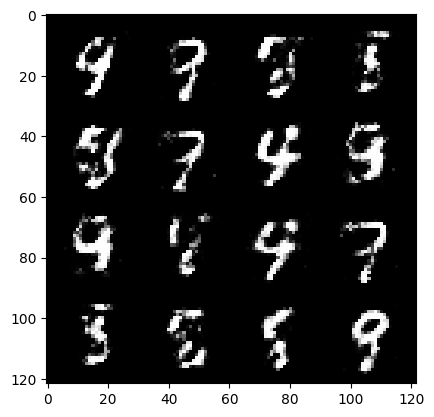

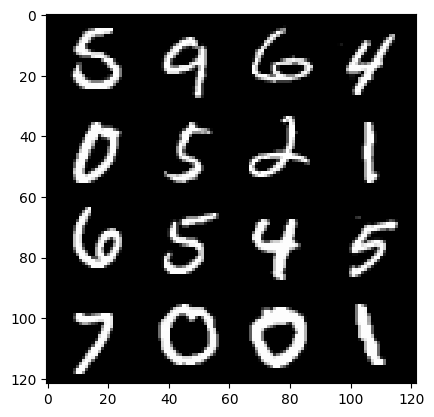

156: step 73200 / Gen loss: 2.0986553331216187 / disc_loss: 0.27081505298614494


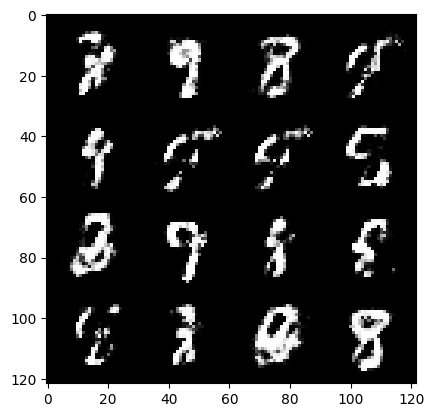

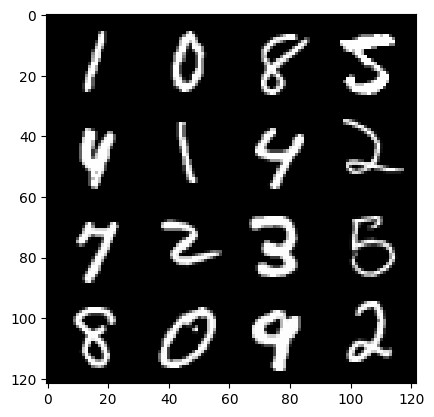

156: step 73500 / Gen loss: 2.1117597679297124 / disc_loss: 0.273987681965033


  0%|          | 0/469 [00:00<?, ?it/s]

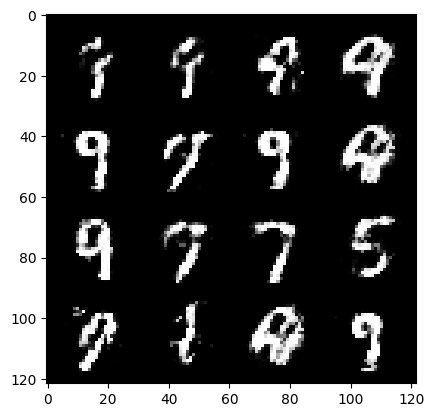

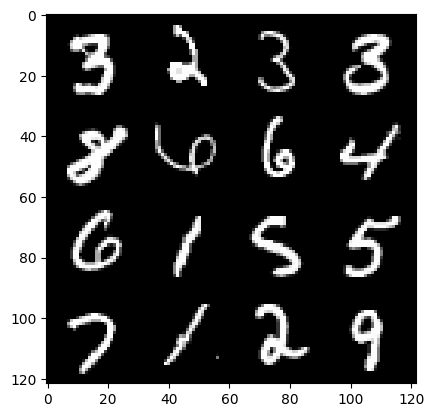

157: step 73800 / Gen loss: 2.0205370640754716 / disc_loss: 0.29082340627908715


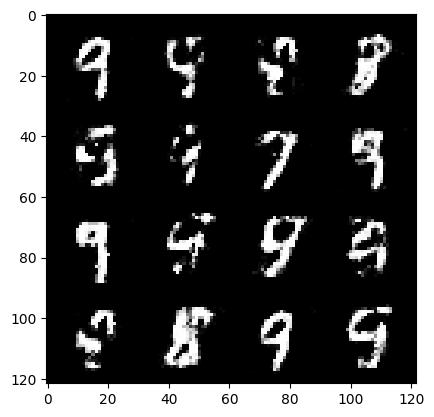

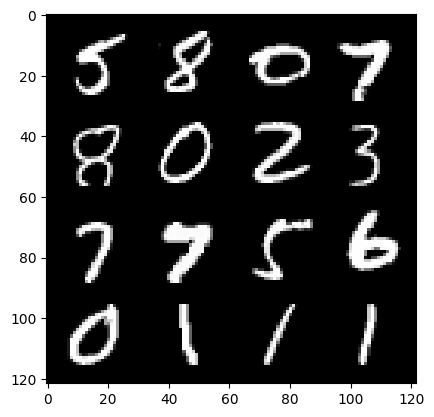

157: step 74100 / Gen loss: 2.0313636457920077 / disc_loss: 0.28987900778651227


  0%|          | 0/469 [00:00<?, ?it/s]

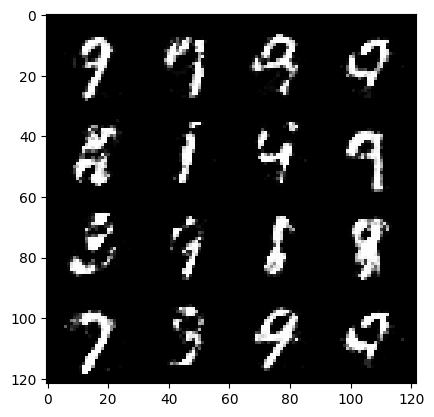

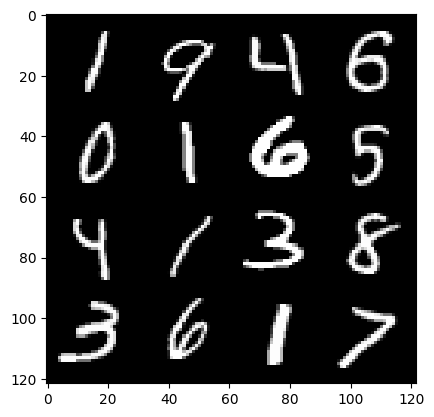

158: step 74400 / Gen loss: 1.912619359493257 / disc_loss: 0.32094781249761567


  0%|          | 0/469 [00:00<?, ?it/s]

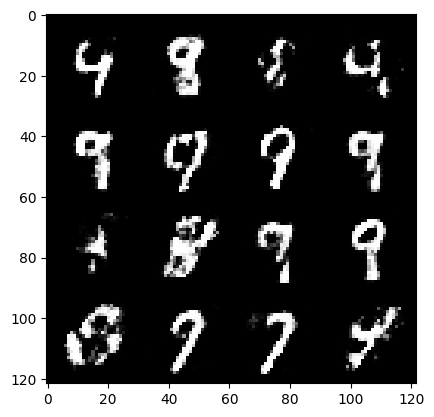

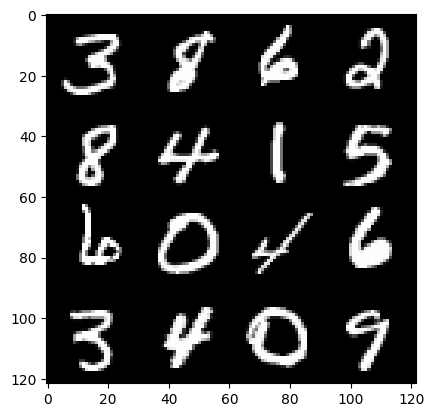

159: step 74700 / Gen loss: 1.951119701464971 / disc_loss: 0.30112066601713494


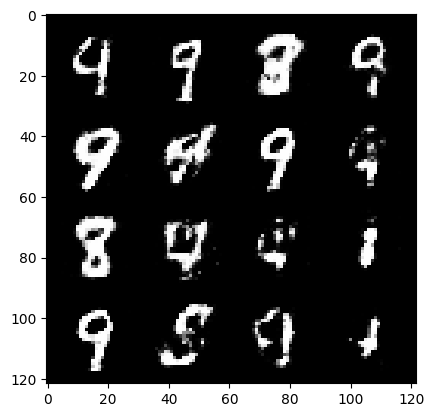

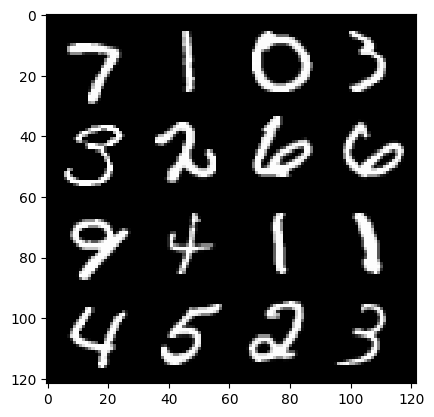

159: step 75000 / Gen loss: 1.921416666507722 / disc_loss: 0.30994208837548876


  0%|          | 0/469 [00:00<?, ?it/s]

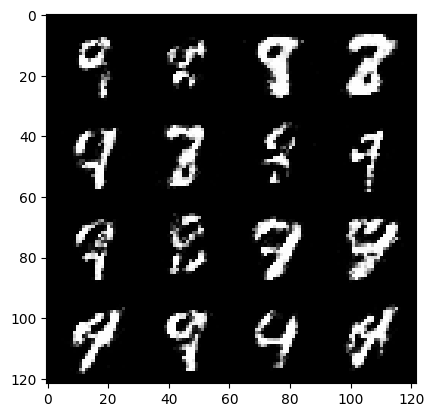

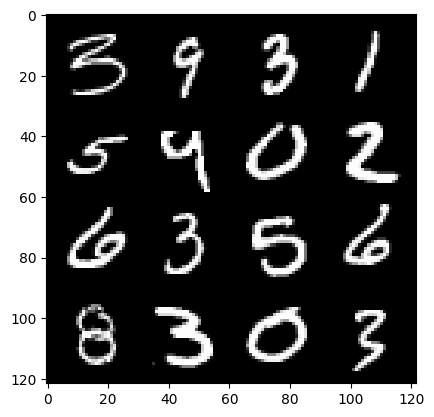

160: step 75300 / Gen loss: 1.883229224681854 / disc_loss: 0.29712789694468167


  0%|          | 0/469 [00:00<?, ?it/s]

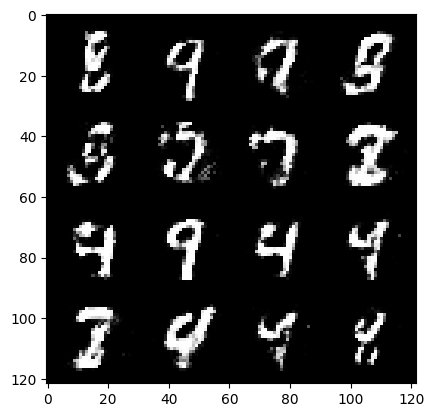

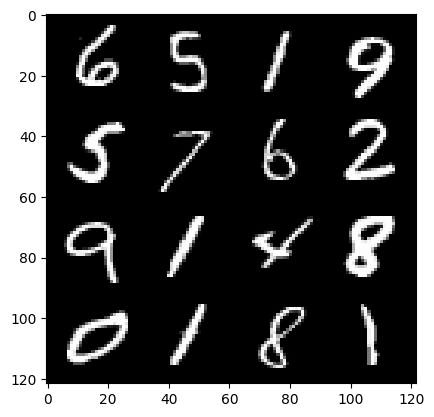

161: step 75600 / Gen loss: 2.0783495442072537 / disc_loss: 0.26792598381638516


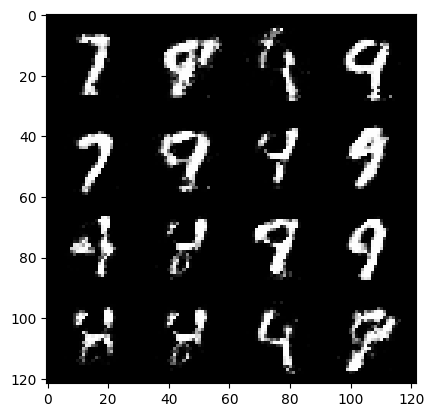

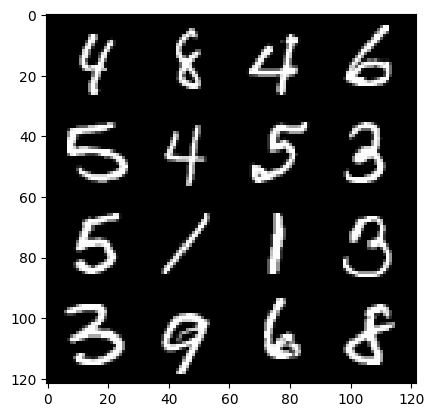

161: step 75900 / Gen loss: 1.950145026842753 / disc_loss: 0.29472610662380844


  0%|          | 0/469 [00:00<?, ?it/s]

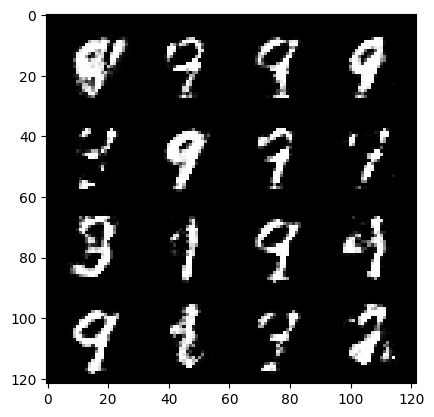

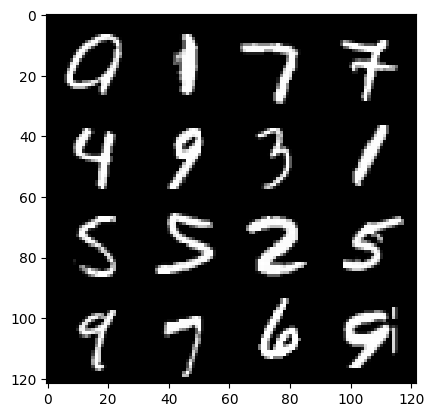

162: step 76200 / Gen loss: 1.8683390235900872 / disc_loss: 0.3117160361508525


  0%|          | 0/469 [00:00<?, ?it/s]

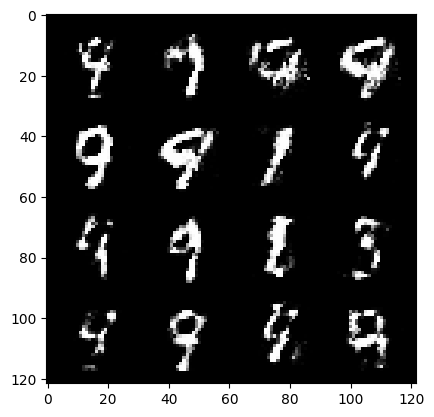

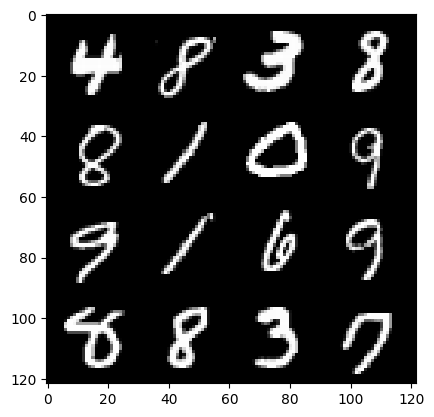

163: step 76500 / Gen loss: 1.8823789238929762 / disc_loss: 0.298872498969237


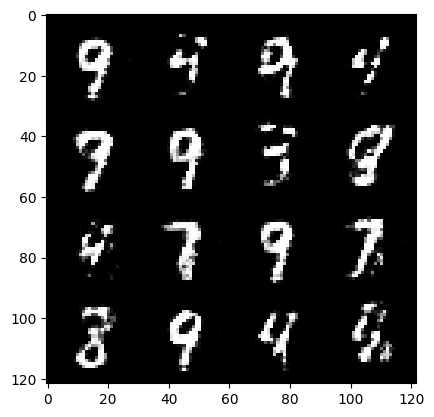

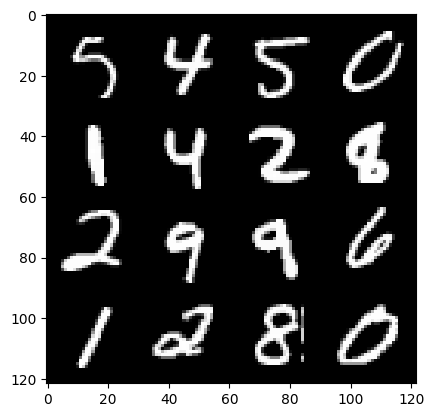

163: step 76800 / Gen loss: 1.90528421719869 / disc_loss: 0.31305634185671843


  0%|          | 0/469 [00:00<?, ?it/s]

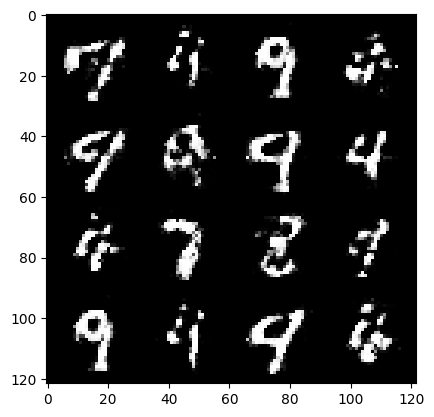

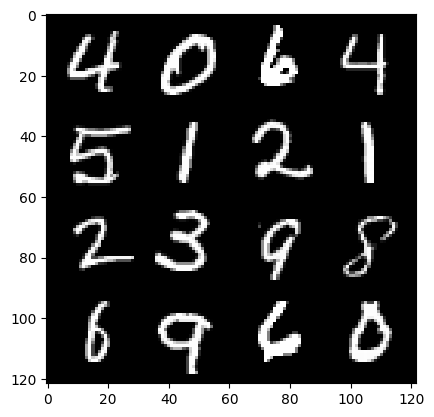

164: step 77100 / Gen loss: 1.8374367721875506 / disc_loss: 0.32579329406221713


  0%|          | 0/469 [00:00<?, ?it/s]

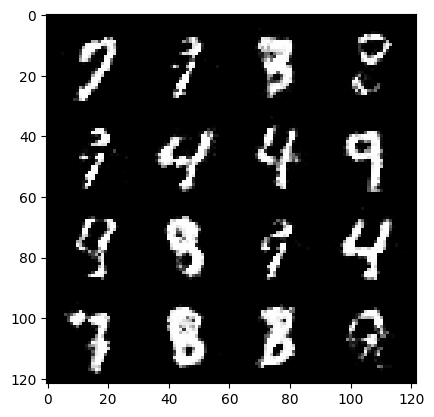

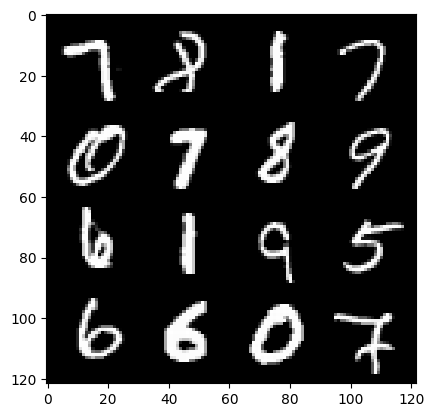

165: step 77400 / Gen loss: 1.9064444748560587 / disc_loss: 0.3104083831111589


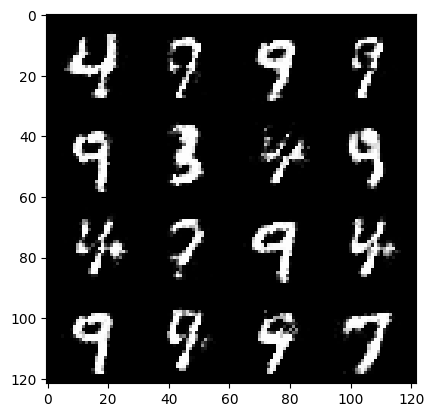

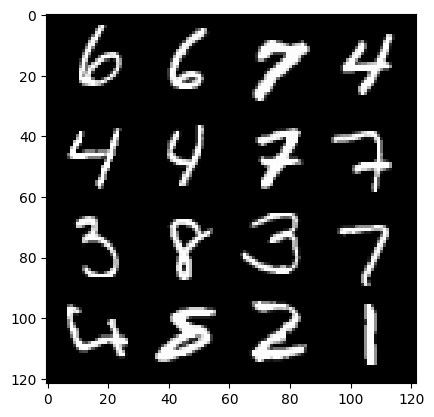

165: step 77700 / Gen loss: 1.8530849464734394 / disc_loss: 0.32574859147270546


  0%|          | 0/469 [00:00<?, ?it/s]

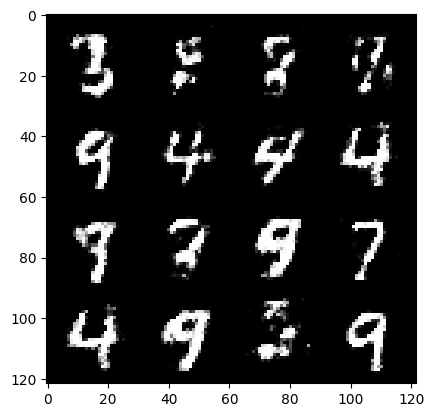

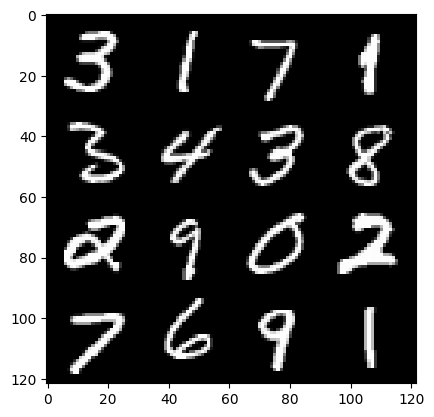

166: step 78000 / Gen loss: 1.8559912316004448 / disc_loss: 0.32911841010053966


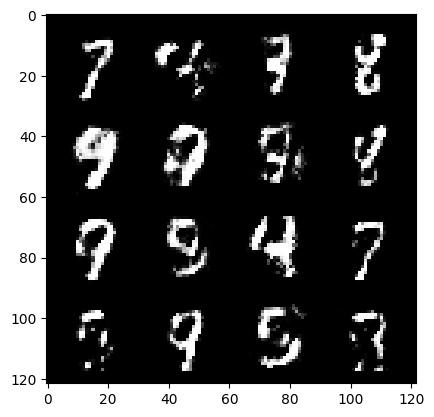

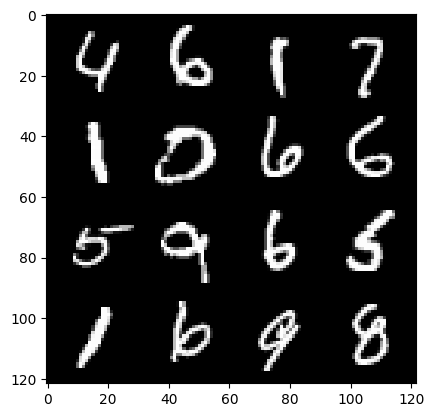

166: step 78300 / Gen loss: 1.7845657805601762 / disc_loss: 0.3422098791599273


  0%|          | 0/469 [00:00<?, ?it/s]

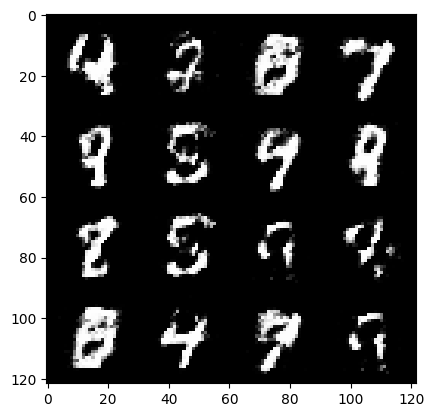

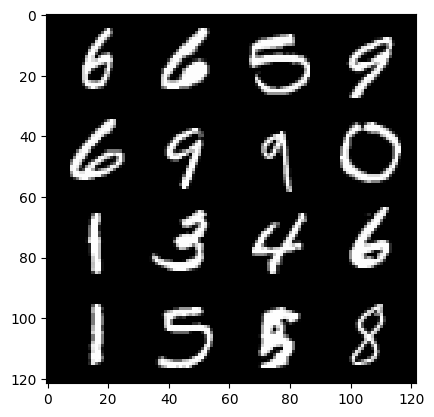

167: step 78600 / Gen loss: 1.7031801565488194 / disc_loss: 0.3587852724393208


  0%|          | 0/469 [00:00<?, ?it/s]

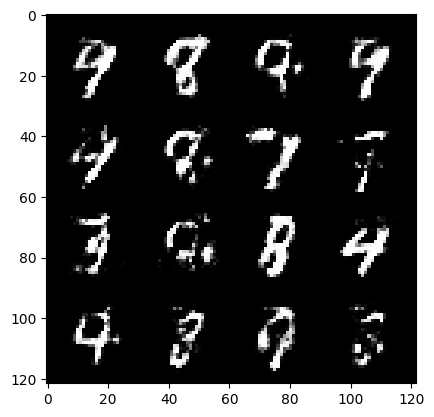

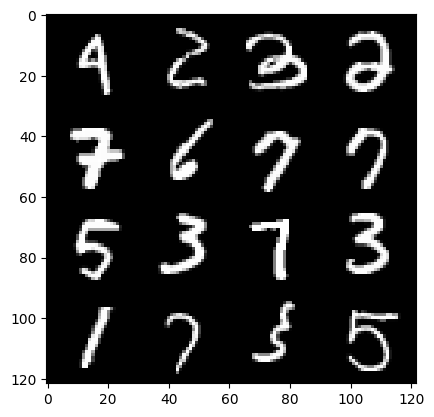

168: step 78900 / Gen loss: 1.7672726778189347 / disc_loss: 0.3240373719235261


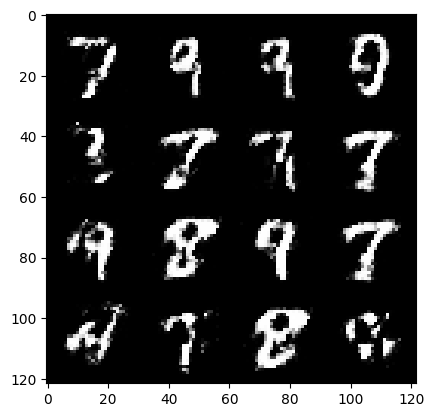

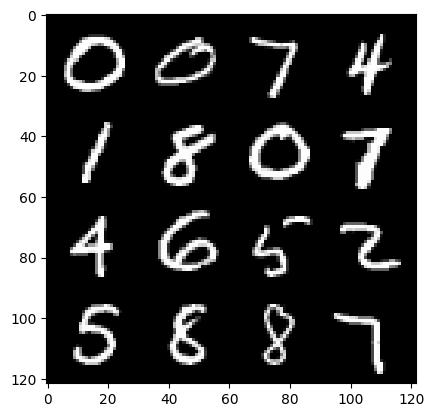

168: step 79200 / Gen loss: 1.8291245571772259 / disc_loss: 0.31946774760882


  0%|          | 0/469 [00:00<?, ?it/s]

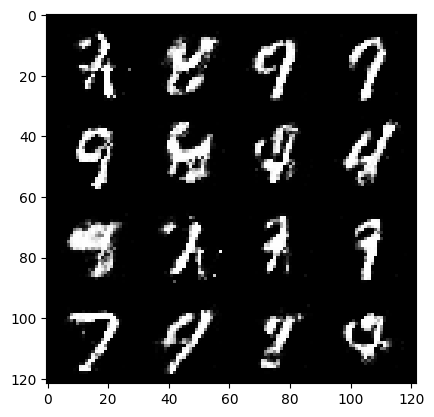

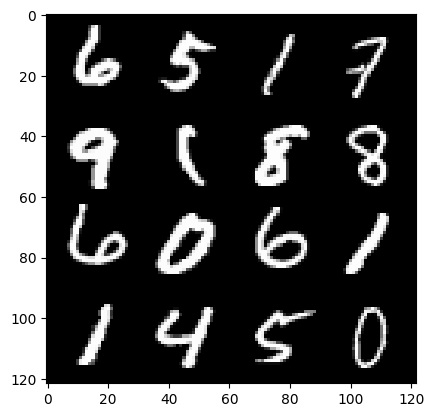

169: step 79500 / Gen loss: 1.845930201212565 / disc_loss: 0.3277112457156181


  0%|          | 0/469 [00:00<?, ?it/s]

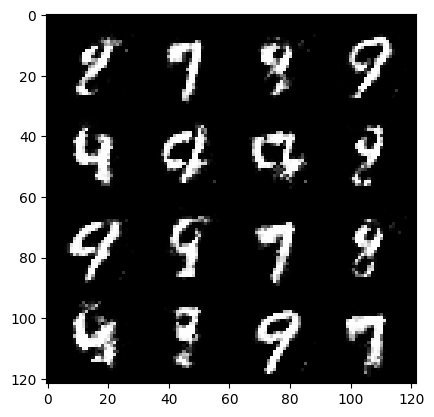

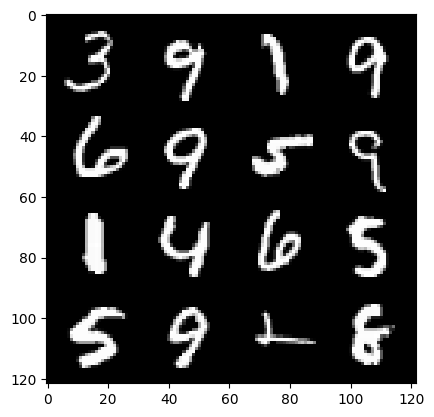

170: step 79800 / Gen loss: 1.9118500292301195 / disc_loss: 0.3134513422846796


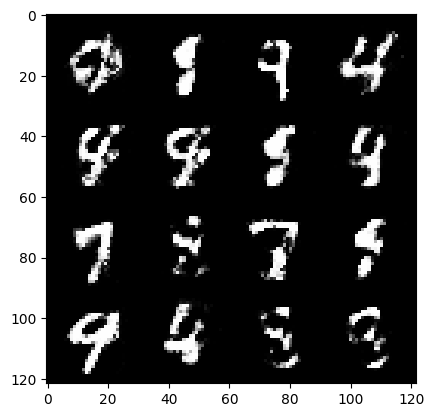

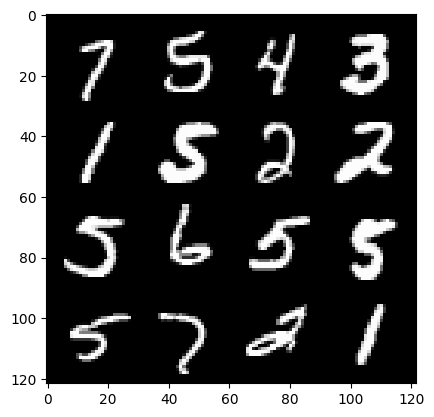

170: step 80100 / Gen loss: 1.8700753720601406 / disc_loss: 0.31597779144843435


  0%|          | 0/469 [00:00<?, ?it/s]

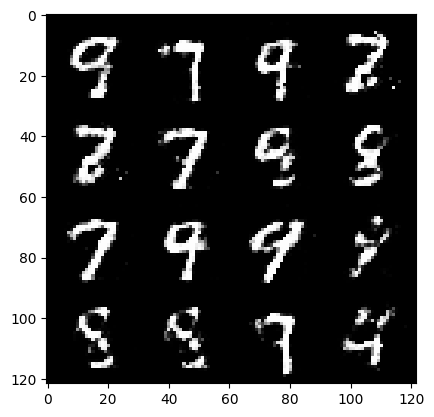

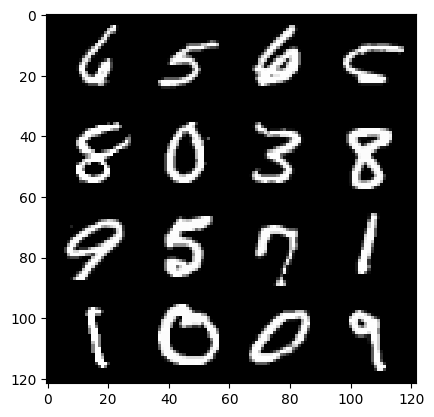

171: step 80400 / Gen loss: 1.9596665922800707 / disc_loss: 0.29858881016572325


  0%|          | 0/469 [00:00<?, ?it/s]

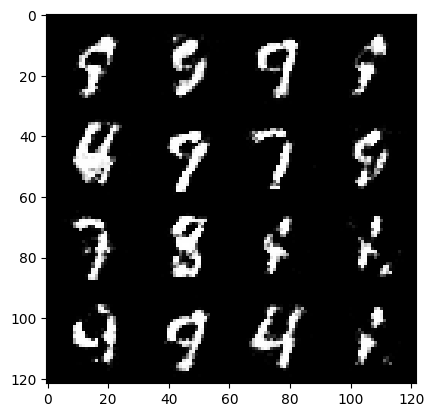

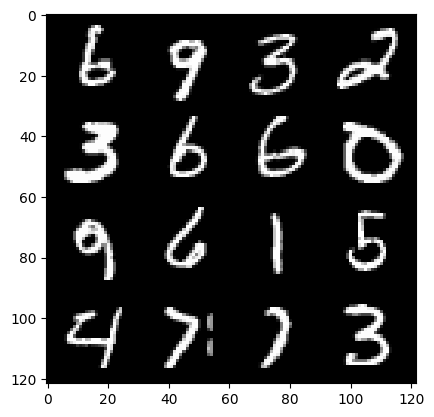

172: step 80700 / Gen loss: 1.9429667429129287 / disc_loss: 0.3019722126921017


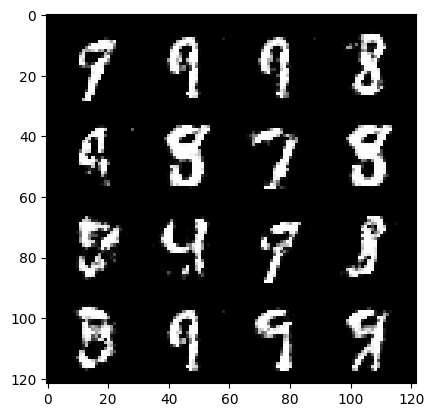

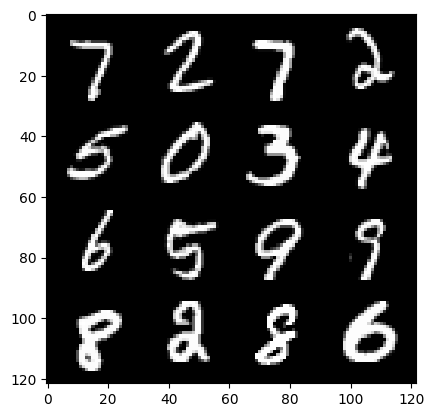

172: step 81000 / Gen loss: 1.9367114075024923 / disc_loss: 0.3026779511570933


  0%|          | 0/469 [00:00<?, ?it/s]

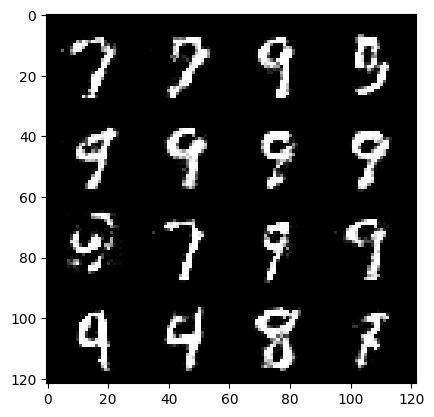

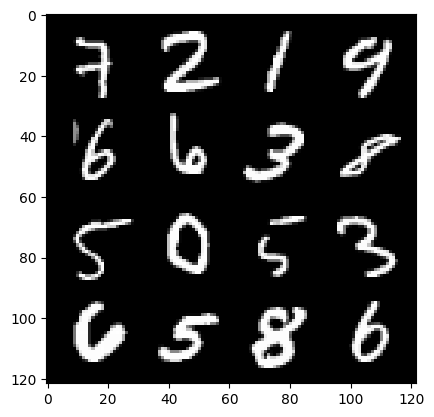

173: step 81300 / Gen loss: 1.9315248703956611 / disc_loss: 0.3014054527382056


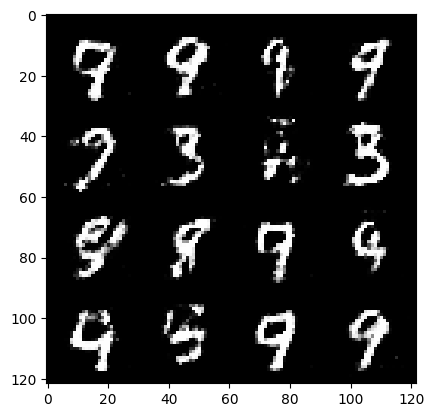

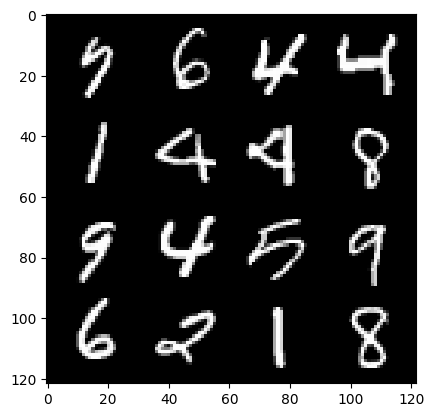

173: step 81600 / Gen loss: 1.9228557527065278 / disc_loss: 0.30193702504038794


  0%|          | 0/469 [00:00<?, ?it/s]

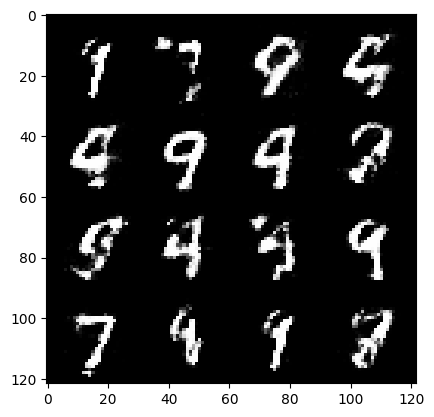

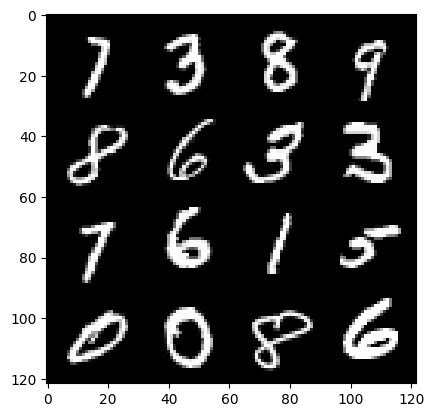

174: step 81900 / Gen loss: 1.79086900115013 / disc_loss: 0.33918977618217483


  0%|          | 0/469 [00:00<?, ?it/s]

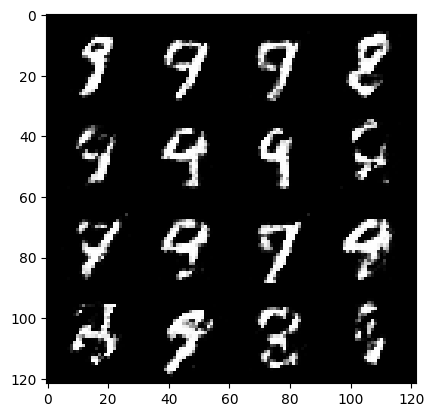

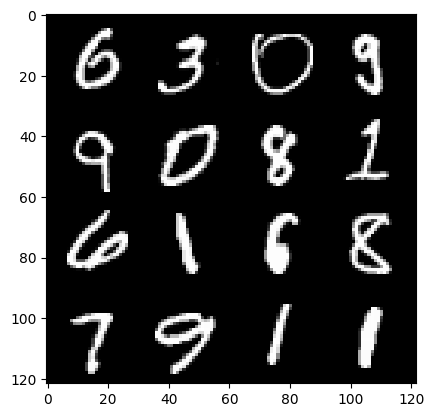

175: step 82200 / Gen loss: 1.7809810777505248 / disc_loss: 0.33998473515113176


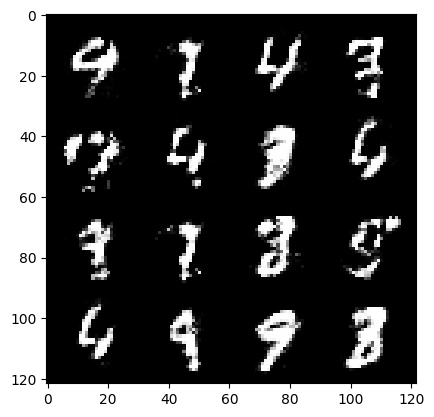

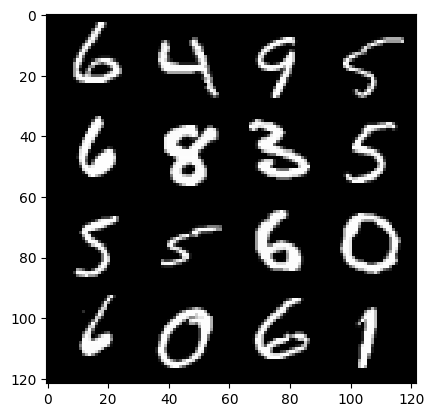

175: step 82500 / Gen loss: 1.845673784414926 / disc_loss: 0.3194161082307498


  0%|          | 0/469 [00:00<?, ?it/s]

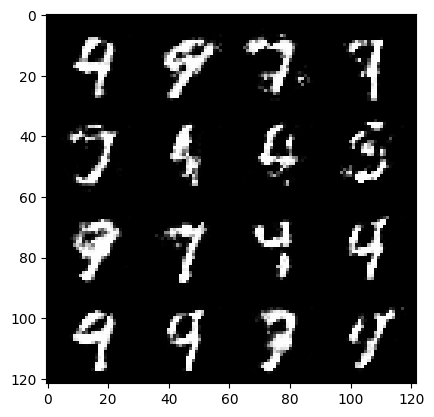

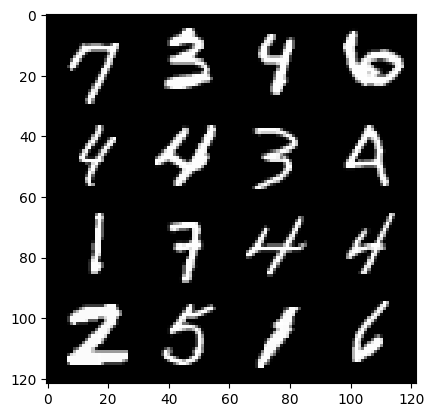

176: step 82800 / Gen loss: 1.7927393762270611 / disc_loss: 0.335756576408942


  0%|          | 0/469 [00:00<?, ?it/s]

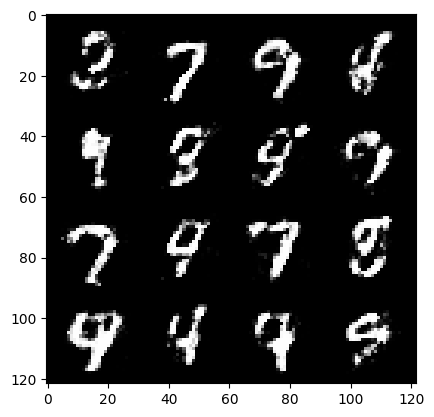

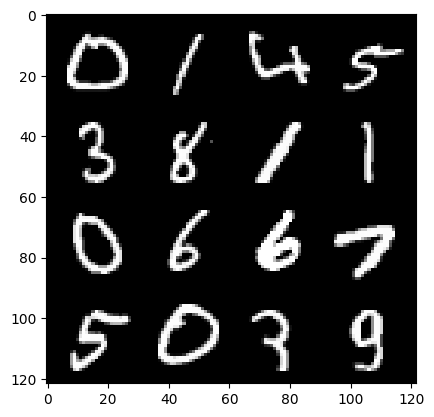

177: step 83100 / Gen loss: 1.807501829067866 / disc_loss: 0.3361609385410946


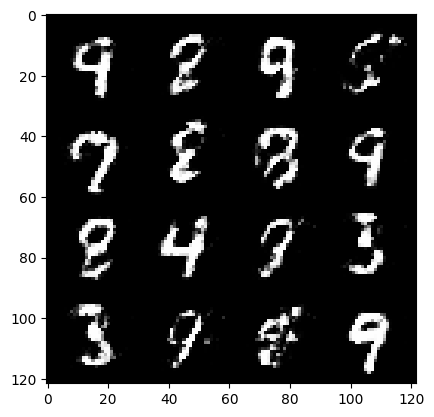

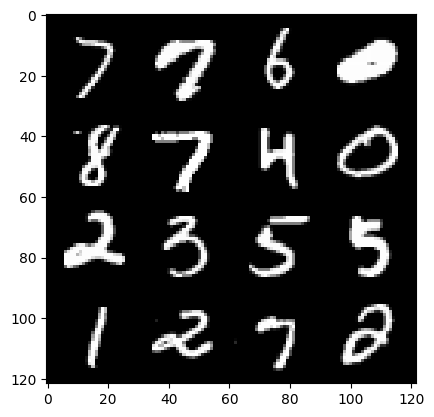

177: step 83400 / Gen loss: 1.7122073920567826 / disc_loss: 0.3578716738025347


  0%|          | 0/469 [00:00<?, ?it/s]

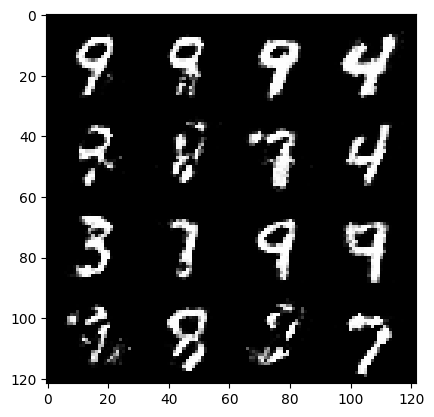

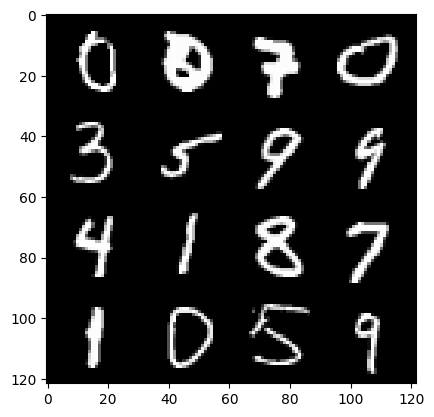

178: step 83700 / Gen loss: 1.7380907901128133 / disc_loss: 0.34550406356652574


  0%|          | 0/469 [00:00<?, ?it/s]

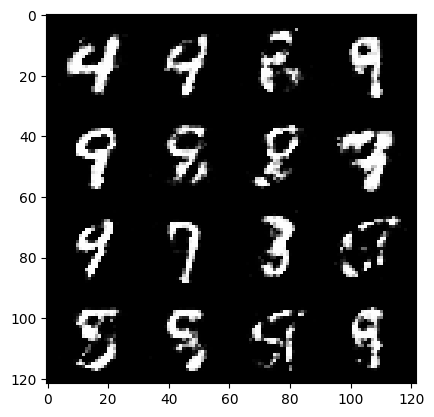

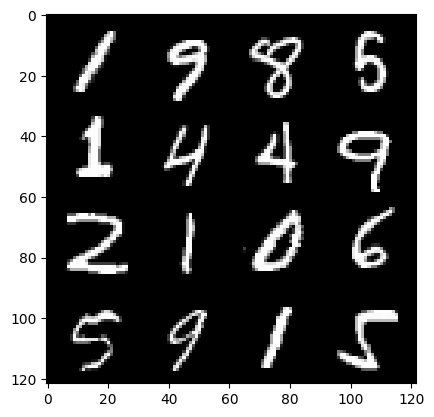

179: step 84000 / Gen loss: 1.703216797510783 / disc_loss: 0.35064789444208155


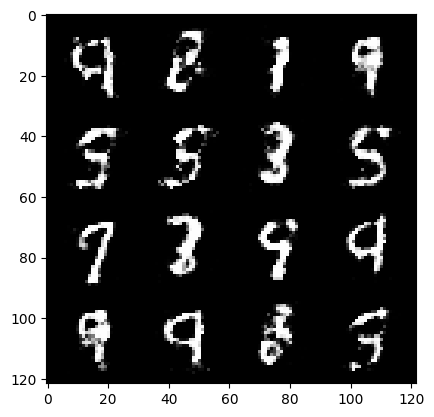

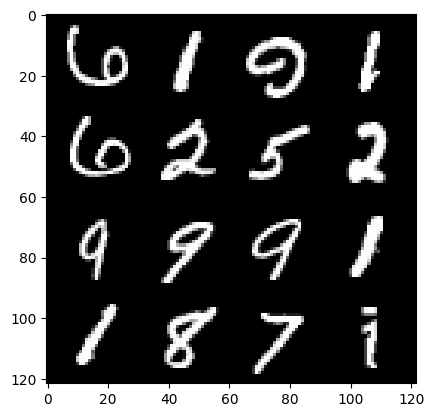

179: step 84300 / Gen loss: 1.7713344951470695 / disc_loss: 0.32976486802101146


  0%|          | 0/469 [00:00<?, ?it/s]

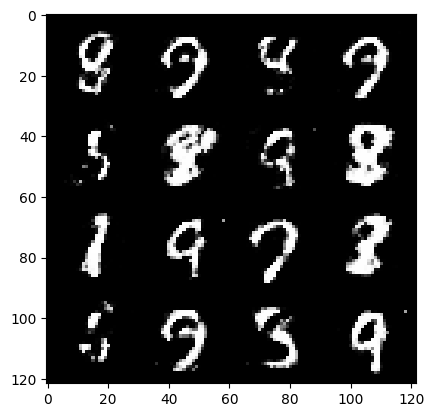

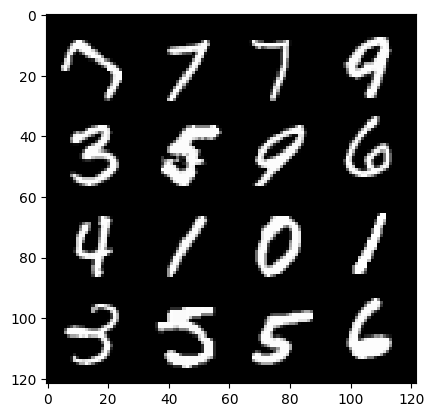

180: step 84600 / Gen loss: 1.7638043161233268 / disc_loss: 0.3245522716144722


  0%|          | 0/469 [00:00<?, ?it/s]

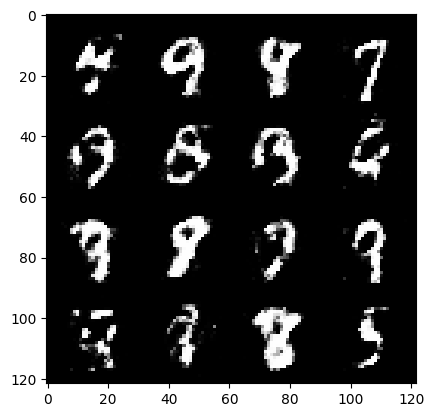

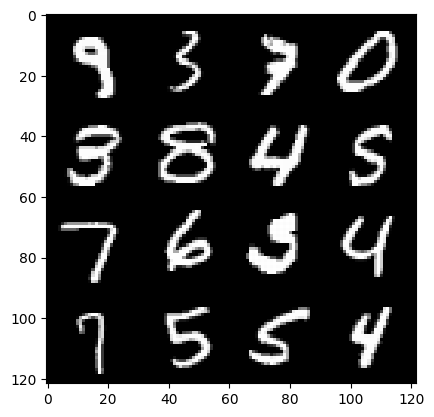

181: step 84900 / Gen loss: 1.8555117897192646 / disc_loss: 0.30918254569172854


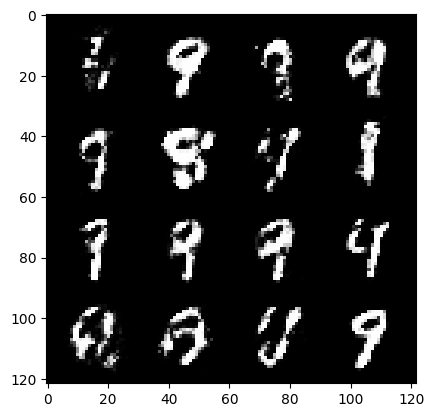

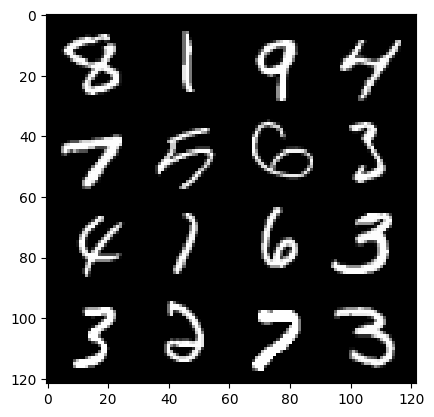

181: step 85200 / Gen loss: 1.8133104904492712 / disc_loss: 0.3165422355631988


KeyboardInterrupt: 

In [18]:
# training loop

'''
  MNIST library contains 60,000 images. We will be running batches of 128. Each epoch will have
  (60,000 / 128) -> 468.75 steps -> 469.
  Each step will process 128 images (same size as the batch, except for the last step.)

  Notes on calculating loss:
  The generator aims to minimize its loss by creating data that the discriminator classifies as 'real'.
  The discriminator aims to maximize its loss by accurately classifying fake data.
  The generator's loss is calculated based on the output of the discriminator. If the generator classifies the data as real,
  (a score of 1), then the generator receives a low score, indicating it is doing its job well.
'''

for epoch in range(epochs):
  for real, _ in tqdm(dataloader): # for each run we will store real images in the var 'real', but labels are returned as well. Because this is unsupervised learning we do not need the labels, so they are stored in the var '_'.
    # discriminator
    disc_opt.zero_grad() # set gradients to 0 for each step
    cur_batch_size = len(real) # real: 128 x 1 x 28 X 28
    real = real.view(cur_batch_size, -1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func, gen, disc, cur_batch_size, real, z_dim)
    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    # generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func, gen, disc, cur_batch_size, z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    # visualization $ stats
    mean_disc_loss += disc_loss.item() / info_step
    mean_gen_loss += gen_loss.item() / info_step

    if cur_step % info_step == 0 and cur_step > 0:
      fake_noise = gen_noise(cur_batch_size, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f'{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}')

      mean_gen_loss, mean_disc_loss = 0, 0
    cur_step += 1
